In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scapy.utils
from scapy.layers.inet import IP, UDP

from lte import *

plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.figsize'] = (7, 3.5)

In [2]:
def normalize(z):
    return z / np.abs(z)

In [3]:
fs = 30720000

x = np.fromfile('LTE_uplink_847MHz_2022-01-30_30720ksps.sigmf-data', 'int16')

# Scale amplitude so that the PUSCH QPSK symbols are (+/-1 +/-1j)/sqrt(2)
x = (x[::2] + 1j*x[1::2])/3.65e5
# Correct for CFO. The CFO is measured with the PUSCH and DMRS.
delta_f = -1065
# Adjust phase offset (done with DMRS signal)
delta_phi = 2.06

samp_rate_error = 1 - 1.49e-6

x *= np.exp(1j*(2*np.pi*delta_f/fs*np.arange(x.size) + delta_phi))

In [4]:
# The units here are samples
Tu = 2048 # useful time of a symbol
cp_len = 144  # 4.7 usecs, used in symbols 1-6 in a slot
cp_len2 = 160  # 5.2 usecs, used in symbol 0 in a slot

## Coarse time synchronization

In [5]:
# Poor man's Schmidl & Cox: correlate the end of each symbol with its own cyclic prefix
cp_corr_offset = round(0.0756 * fs)
cp_corr_len = 20 * Tu
cp_corr = np.empty(cp_corr_len, 'complex64')
for j in range(cp_corr.size):
    # the - sign is to account for the fact that the 7.5 kHz frequency offset
    # of the uplink subcarrier performs a 180 deg rotation during Tu
    cp_corr[j] = -np.sum(x[j+cp_corr_offset:][:cp_len] * np.conjugate(x[j+cp_corr_offset+Tu:][:cp_len])) 

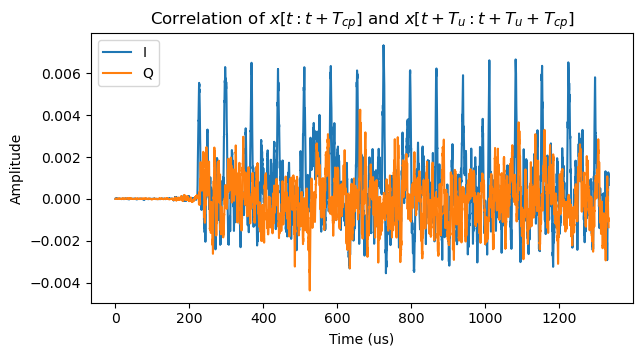

In [6]:
t = np.arange(cp_corr.size)/fs*1e6
plt.plot(t, np.real(cp_corr))
plt.plot(t, np.imag(cp_corr))
plt.title('Correlation of $x[t:t+T_{cp}]$ and $x[t+T_u:t+T_u+T_{cp}]$')
plt.xlabel('Time (us)')
plt.ylabel('Amplitude')
plt.legend(['I', 'Q']);

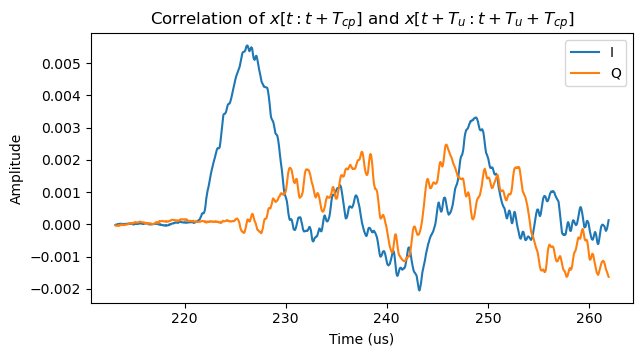

In [7]:
sel = slice(Tu+4500, Tu+6000)
plt.plot(t[sel], np.real(cp_corr[sel]))
plt.plot(t[sel], np.imag(cp_corr[sel]))
plt.title('Correlation of $x[t:t+T_{cp}]$ and $x[t+T_u:t+T_u+T_{cp}]$')
plt.xlabel('Time (us)')
plt.ylabel('Amplitude')
plt.legend(['I', 'Q']);

## OFDM demodulation

In [8]:
# a0 is our estimate for the first sample of the first symbol of the first
# slot. On top of that, we add a correction that has been determined with
# the DMRS.
correction = -44
a0 = cp_corr_offset + np.argmax(np.abs(cp_corr[sel])) + sel.start + cp_len2 + correction

In [9]:
sym0 = a0 // (fs // 1000) * 14
a1 = a0 - round(sym0 // 14 * (fs // 1000) * samp_rate_error)
frac_clock_error = 10.5e-9 * fs

In [10]:
slots = (x.size - a1) // (fs // 1000) * 2
nsymbols = slots * 7

occupied_subcarriers = np.arange(724, 1324)

# Here we take into account the 7.5 kHz shift of the uplink
# subcarriers
freq_syms = 7.5e3 + np.fft.fftshift(np.fft.fftfreq(Tu, 1/fs))
freq_syms = freq_syms[occupied_subcarriers]

# Extract symbols: PUSCH is handled as SC-OFDM, while DMRS is plain OFDM
ofdm_syms = np.empty((nsymbols, occupied_subcarriers.size), 'complex64')
t_syms = np.empty(nsymbols)
for j in range(nsymbols):
    # For each slot, we need to advance cp_len2-cp_len because of the
    # longer cyclic prefix of the first symbol in each slot. delta counts
    # this.
    delta = (cp_len2 - cp_len) * (j//7)

    exact_sample = j*(Tu+cp_len)*samp_rate_error + frac_clock_error
    round_sample = round(exact_sample)
    error_sample = exact_sample - round_sample
    start_sample = a1 + round_sample + delta
    t_syms[j] = (start_sample + error_sample) / fs
    
    # Before performing the FFT, we multiply by an exponential to cancel out the 7.5 kHz shift of
    # the symbols. The phase of this exponential is zero at the start of the symbol.
    syms = np.fft.fftshift(np.fft.fft(x[start_sample:][:Tu] * np.exp(-1j*np.pi*np.arange(Tu)/Tu)))
    # Correct for fractional sample delay
    syms *= np.exp(1j*2*np.pi*error_sample*np.arange(-Tu//2, Tu//2)/Tu)
    ofdm_syms[j] = syms[occupied_subcarriers]

## Demodulation of some PUSCH transmissions

In [11]:
# Selection of subcarriers in use
pusch_subcarriers = np.arange(180, 360)
pusch_syms = np.fft.ifft(ofdm_syms[sym0:sym0+14*7, pusch_subcarriers]) * np.sqrt(pusch_subcarriers.size)
pusch_syms[3::7] = ofdm_syms[sym0:sym0+14*7, pusch_subcarriers][3::7]

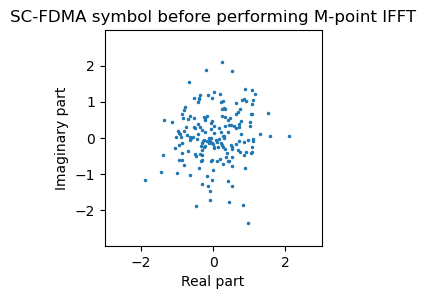

In [12]:
plt.figure(figsize=(2.8, 2.8))
s = ofdm_syms[sym0, pusch_subcarriers]
plt.plot(s.real, s.imag, '.', markersize=3)
plt.axis('equal')
plt.xlim((-3, 3))
plt.ylim((-3, 3))
plt.title('SC-FDMA symbol before performing M-point IFFT')
plt.ylabel('Imaginary part')
plt.xlabel('Real part');

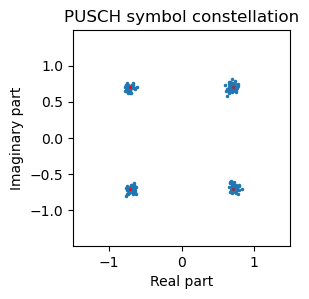

In [13]:
plt.figure(figsize=(2.8, 2.8))
plt.plot(pusch_syms[0].real, pusch_syms[0].imag, '.', markersize=3)
plt.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
         np.array([1, -1, 1, -1])/np.sqrt(2), '.',
         color='red', markersize=2)
plt.axis('equal')
plt.xlim((-1.5, 1.5))
plt.ylim((-1.5, 1.5))
plt.title('PUSCH symbol constellation')
plt.ylabel('Imaginary part')
plt.xlabel('Real part');

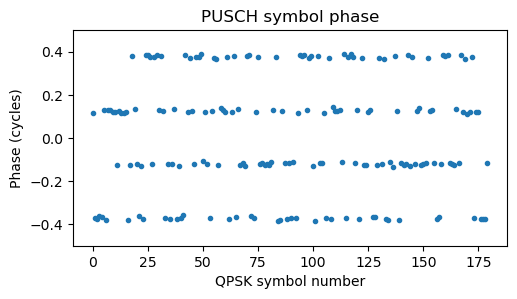

In [14]:
plt.figure(figsize=(5.6, 2.8))
plt.plot(np.angle(pusch_syms[0])/(2*np.pi), '.')
plt.ylim((-0.5, 0.5))
plt.title('PUSCH symbol phase')
plt.ylabel('Phase (cycles)')
plt.xlabel('QPSK symbol number');

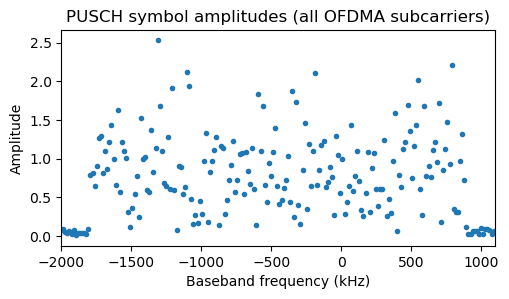

In [15]:
s = ofdm_syms[sym0]
plt.figure(figsize=(5.6, 2.8))
plt.plot(freq_syms*1e-3, np.abs(s), '.')
plt.xlim((-2e3, 1.1e3))
plt.title('PUSCH symbol amplitudes (all OFDMA subcarriers)')
plt.ylabel('Amplitude')
plt.xlabel('Baseband frequency (kHz)');

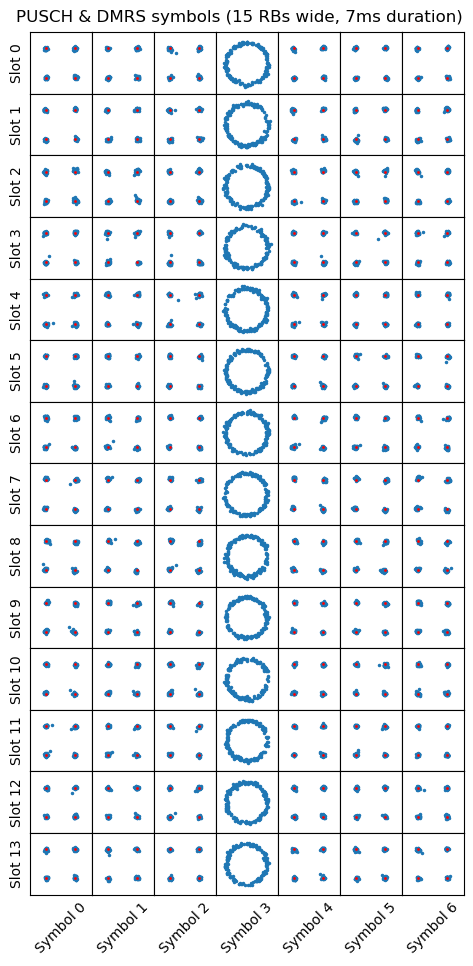

In [16]:
fig, axs = plt.subplots(14, 7, figsize=(5.6, 11.2), facecolor='w', sharex=True, sharey=True)
for j in range(14 * 7):
    slot = j // 7
    sym = j % 7
    ax = axs[slot, sym]
    ax.plot(pusch_syms[j].real, pusch_syms[j].imag, '.', markersize=3)
    if sym != 3:
        ax.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
                np.array([1, -1, 1, -1])/np.sqrt(2), '.',
                color='red', markersize=2)
    ax.set_xlim((-1.5, 1.5))
    ax.set_ylim((-1.5, 1.5))
    ax.set_xticks([])
    ax.set_yticks([])
    if sym == 0:
        ax.set_ylabel(f'Slot {slot}')
    if slot == axs.shape[0] - 1:
        ax.set_xlabel(f'Symbol {sym}', rotation=45)
        
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('PUSCH & DMRS symbols (15 RBs wide, 7ms duration)', y=0.9);

In [17]:
# Table 5.5.1.2-1 in TS 36.211
table_551_12 = np.array(
    [[-1, 1, 3, -3, 3, 3, 1, 1, 3, 1, -3, 3],
     [1, 1, 3, 3, 3, -1, 1, -3, -3, 1, -3, 3],
     [1, 1, -3, -3, -3, -1, -3, -3, 1, -3, 1, -1],
     [-1, 1, 1, 1, 1, -1, -3, -3, 1, -3, 3, -1],
     [-1, 3, 1, -1, 1, -1, -3, -1, 1, -1, 1, 3],
     [1, -3, 3, -1, -1, 1, 1, -1, -1, 3, -3, 1],
     [-1, 3, -3, -3, -3, 3, 1, -1, 3, 3, -3, 1],
     [-3, -1, -1, -1, 1, -3, 3, -1, 1, -3, 3, 1],
     [1, -3, 3, 1, -1, -1, -1, 1, 1, 3, -1, 1],
     [1, -3, -1, 3, 3, -1, -3, 1, 1, 1, 1, 1],
     [-1, 3, -1, 1, 1, -3, -3, -1, -3, -3, 3, -1],
     [3, 1, -1, -1, 3, 3, -3, 1, 3, 1, 3, 3],
     [1, -3, 1, 1, -3, 1, 1, 1, -3, -3, -3, 1],
     [3, 3, -3, 3, -3, 1, 1, 3, -1, -3, 3, 3],
     [-3, 1, -1, -3, -1, 3, 1, 3, 3, 3, -1, 1],
     [3, -1, 1, -3, -1, -1, 1, 1, 3, 1, -1, -3],
     [1, 3, 1, -1, 1, 3, 3, 3, -1, -1, 3, -1],
     [-3, 1, 1, 3, -3, 3, -3, -3, 3, 1, 3, -1],
     [-3, 3, 1, 1, -3, 1, -3, -3, -1, -1, 1, -3],
     [-1, 3, 1, 3, 1, -1, -1, 3, -3, -1, -3, -1],
     [-1, -3, 1, 1, 1, 1, 3, 1, -1, 1, -3, -1],
     [-1, 3, -1, 1, -3, -3, -3, -3, -3, 1, -1, -3],
     [1, 1, -3, -3, -3, -3, -1, 3, -3, 1, -3, 3],
     [1, 1, -1, -3, -1, -3, 1, -1, 1, 3, -1, 1],
     [1, 1, 3, 1, 3, 3, -1, 1, -1, -3, -3, 1],
     [1, -3, 3, 3, 1, 3, 3, 1, -3, -1, -1, 3],
     [1, 3, -3, -3, 3, -3, 1, -1, -1, 3, -1, -3],
     [-3, -1, -3, -1, -3, 3, 1, -1, 1, 3, -3, -3],
     [-1, 3, -3, 3, -1, 3, 3, -3, 3, 3, -1, -1],
     [3, -3, -3, -1, -1, -3, -1, 3, -3, 3, 1, -1]])

# Table 5.5.1.2-2 in TS 36.211
table_551_24 = np.array(
    [[-1, 3, 1, -3, 3, -1, 1, 3, -3, 3, 1, 3, -3, 3, 1, 1, -1, 1, 3, -3, 3, -3, -1, -3],
     [-3, 3, -3, -3, -3, 1, -3, -3, 3, -1, 1, 1, 1, 3, 1, -1, 3, -3, -3, 1, 3, 1, 1, -3],
     [3, -1, 3, 3, 1, 1, -3, 3, 3, 3, 3, 1, -1, 3, -1, 1, 1, -1, -3, -1, -1, 1, 3, 3],
     [-1, -3, 1, 1, 3, -3, 1, 1, -3, -1, -1, 1, 3, 1, 3, 1, -1, 3, 1, 1, -3, -1, -3, -1],
     [-1, -1, -1, -3, -3, -1, 1, 1, 3, 3, -1, 3, -1, 1, -1, -3, 1, -1, -3, -3, 1, -3, -1, -1],
     [-3, 1, 1, 3, -1, 1, 3, 1, -3, 1, -3, 1, 1, -1, -1, 3, -1, -3, 3, -3, -3, -3, 1, 1],
     [1, 1, -1, -1, 3, -3, -3, 3, -3, 1, -1, -1, 1, -1, 1, 1, -1, -3, -1, 1, -1, 3, -1, -3],
     [-3, 3, 3, -1, -1, -3, -1, 3, 1, 3, 1, 3, 1, 1, -1, 3, 1, -1, 1, 3, -3, -1, -1, 1],
     [-3, 1, 3, -3, 1, -1, -3, 3, -3, 3, -1, -1, -1, -1, 1, -3, -3, -3, 1, -3, -3, -3, 1, -3],
     [1, 1, -3, 3, 3, -1, -3, -1, 3, -3, 3, 3, 3, -1, 1, 1, -3, 1, -1, 1, 1, -3, 1, 1],
     [-1, 1, -3, -3, 3, -1, 3, -1, -1, -3, -3, -3, -1, -3, -3, 1, -1, 1, 3, 3, -1, 1, -1, 3],
     [1, 3, 3, -3, -3, 1, 3, 1, -1, -3, -3, -3, 3, 3, -3, 3, 3, -1, -3, 3, -1, 1, -3, 1],
     [1, 3, 3, 1, 1, 1, -1, -1, 1, -3, 3, -1, 1, 1, -3, 3, 3, -1, -3, 3, -3, -1, -3, -1],
     [3, -1, -1, -1, -1, -3, -1, 3, 3, 1, -1, 1, 3, 3, 3, -1, 1, 1, -3, 1, 3, -1, -3, 3],
     [-3, -3, 3, 1, 3, 1, -3, 3, 1, 3, 1, 1, 3, 3, -1, -1, -3, 1, -3, -1, 3, 1, 1, 3],
     [-1, -1, 1, -3, 1, 3, -3, 1, -1, -3, -1, 3, 1, 3, 1, -1, -3, -3, -1, -1, -3, -3, -3, -1],
     [-1, -3, 3, -1, -1, -1, -1, 1, 1, -3, 3, 1, 3, 3, 1, -1, 1, -3, 1, -3, 1, 1, -3, -1],
     [1, 3, -1, 3, 3, -1, -3, 1, -1, -3, 3, 3, 3, -1, 1, 1, 3, -1, -3, -1, 3, -1, -1, -1],
     [1, 1, 1, 1, 1, -1, 3, -1, -3, 1, 1, 3, -3, 1, -3, -1, 1, 1, -3, -3, 3, 1, 1, -3],
     [1, 3, 3, 1, -1, -3, 3, -1, 3, 3, 3, -3, 1, -1, 1, -1, -3, -1, 1, 3, -1, 3, -3, -3],
     [-1, -3, 3, -3, -3, -3, -1, -1, -3, -1, -3, 3, 1, 3, -3, -1, 3, -1, 1, -1, 3, -3, 1, -1],
     [-3, -3, 1, 1, -1, 1, -1, 1, -1, 3, 1, -3, -1, 1, -1, 1, -1, -1, 3, 3, -3, -1, 1, -3],
     [-3, -1, -3, 3, 1, -1, -3, -1, -3, -3, 3, -3, 3, -3, -1, 1, 3, 1, -3, 1, 3, 3, -1, -3],
     [-1, -1, -1, -1, 3, 3, 3, 1, 3, 3, -3, 1, 3, -1, 3, -1, 3, 3, -3, 3, 1, -1, 3, 3],
     [1, -1, 3, 3, -1, -3, 3, -3, -1, -1, 3, -1, 3, -1, -1, 1, 1, 1, 1, -1, -1, -3, -1, 3],
     [1, -1, 1, -1, 3, -1, 3, 1, 1, -1, -1, -3, 1, 1, -3, 1, 3, -3, 1, 1, -3, -3, -1, -1],
     [-3, -1, 1, 3, 1, 1, -3, -1, -1, -3, 3, -3, 3, 1, -3, 3, -3, 1, -1, 1, -3, 1, 1, 1],
     [-1, -3, 3, 3, 1, 1, 3, -1, -3, -1, -1, -1, 3, 1, -3, -3, -1, 3, -3, -1, -3, -1, -3, -1],
     [-1, -3, -1, -1, 1, -3, -1, -1, 1, -1, -3, 1, 1, -3, 1, -3, -3, 3, 1, 1, -1, 3, -1, -1],
     [1, 1, -1, -1, -3, -1, 3, -1, 3, -1, 1, 3, 1, -1, 3, 1, 3, -3, -3, 1, -1, -1, 1, 3]])

def is_prime(n):
    return not any(n % i == 0 for i in range(2,n))

def zadoff_chu(u, v, alpha=0, M=180):
    if M == 12:
        return np.exp(1j * (np.pi * table_551_12[u] / 4 + alpha * np.arange(M)))
    if M == 24:
        return np.exp(1j * (np.pi * table_551_24[u] / 4 + alpha * np.arange(M)))
    N_ZC = [n for n in range(2, M) if is_prime(n)][-1]  # largest prime < M
    q_ = N_ZC * (u + 1) / 31
    q = int(q_ + 0.5) + v * (-1)**int(2 * q_)
    m = np.arange(N_ZC)
    x_q = np.exp(-1j * np.pi * q * m * (m + 1) / N_ZC)
    n = np.arange(M)
    r_ = x_q[n % N_ZC]
    # we assume delta = 0
    r = np.exp(1j * alpha * n) * r_
    return r

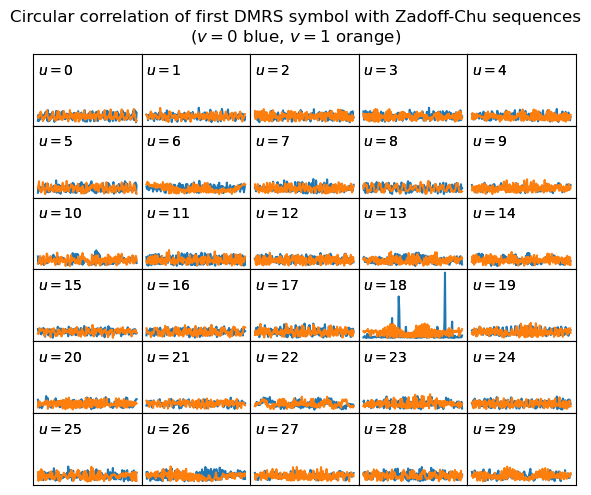

In [18]:
fig, axs = plt.subplots(6, 5, figsize=(7, 5.6), facecolor='w', sharex=True, sharey=True)
axsr = axs.ravel()
for u in range(30):
    for v in range(2):
        r = zadoff_chu(u, v)
        corr = np.abs(np.fft.ifft(np.fft.fft(pusch_syms[3]) * np.conjugate(np.fft.fft(r))))
        axsr[u].plot(corr)
        axsr[u].text(0, 100, f'$u = {u}$')
        axsr[u].set_yticks([])
        axsr[u].set_xticks([])
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('Circular correlation of first DMRS symbol with Zadoff-Chu sequences\n($v = 0$ blue, $v = 1$ orange)',
             y=0.96);

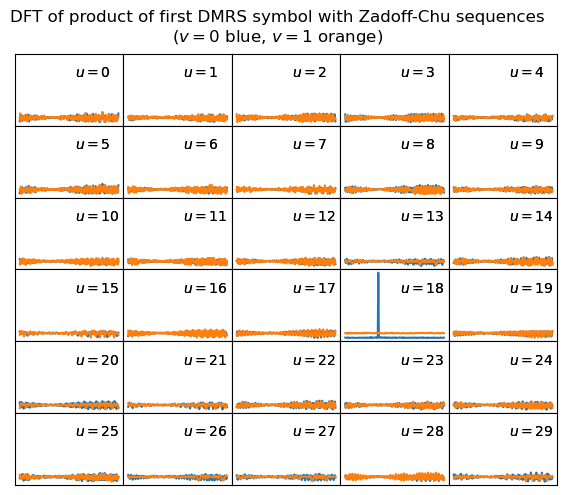

In [19]:
fig, axs = plt.subplots(6, 5, figsize=(7, 5.6), facecolor='w', sharex=True, sharey=True)
axsr = axs.ravel()
for u in range(30):
    for v in range(2):
        r = zadoff_chu(u, v)
        corr = np.abs(np.fft.fft(pusch_syms[3] * np.conjugate(r)))
        axsr[u].plot(corr)
        axsr[u].text(100, 130, f'$u = {u}$')
        axsr[u].set_yticks([])
        axsr[u].set_xticks([])
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('DFT of product of first DMRS symbol with Zadoff-Chu sequences\n($v = 0$ blue, $v = 1$ orange)',
             y=0.96);

In [20]:
zc_u = 18
zc_v = 0

In [21]:
alphas_ambiguity = np.linspace(-np.pi/2, np.pi/2, 1000)
M = 180
ambiguity = np.empty((alphas_ambiguity.size, M))
zc0 = zadoff_chu(zc_u, zc_v, alpha=0)
zc0f = np.fft.fft(zc0)
for j, alpha in enumerate(alphas_ambiguity):
    zc1 = zadoff_chu(zc_u, zc_v, alpha=alpha)
    ambiguity[j] = np.abs(np.fft.fftshift(np.fft.ifft(zc0f * np.conjugate(np.fft.fft(zc1)))))/M

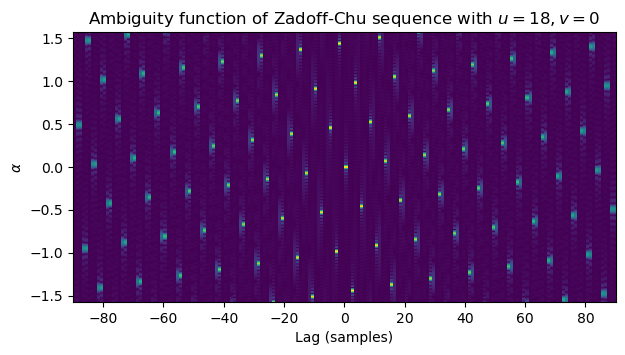

In [22]:
plt.imshow(ambiguity[::-1], interpolation='none', aspect='auto', vmin=0, vmax=1,
           extent=[-M//2, M//2, -np.pi/2, np.pi/2])
plt.ylabel('$\\alpha$')
plt.xlabel('Lag (samples)')
plt.title(f'Ambiguity function of Zadoff-Chu sequence with $u = {zc_u}, v = {zc_v}$');

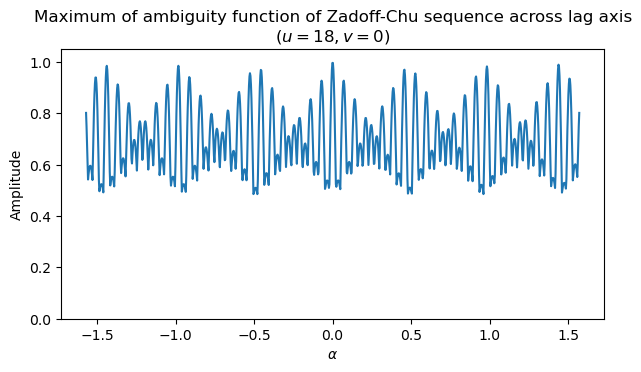

In [23]:
plt.plot(alphas_ambiguity, np.max(ambiguity, axis=1))
plt.ylim((0, 1.05))
plt.title(f'Maximum of ambiguity function of Zadoff-Chu sequence across lag axis\n($u = {zc_u}, v = {zc_v}$)')
plt.ylabel('Amplitude')
plt.xlabel('$\\alpha$');

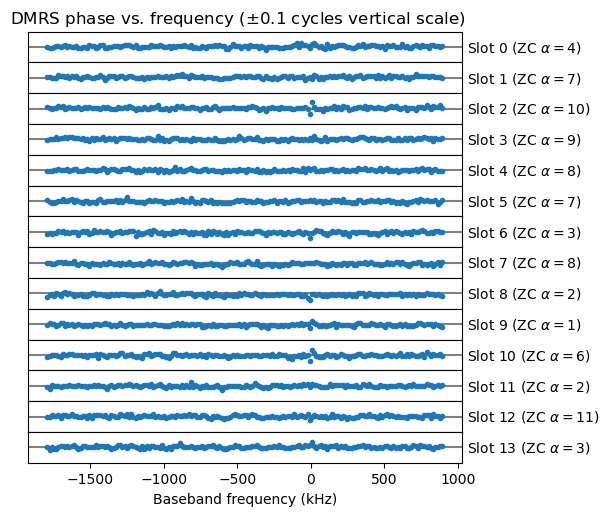

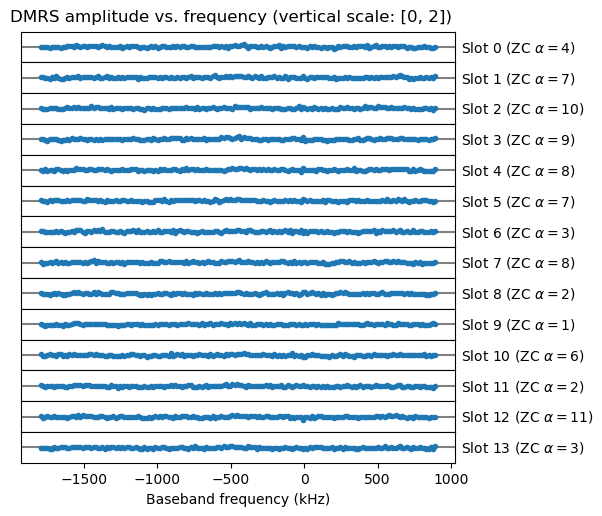

In [24]:
symbols_zc = pusch_syms[3::7]
alphas = np.empty(symbols_zc.shape[0], 'int')
corrs = np.empty(12)
fig, axs = plt.subplots(symbols_zc.shape[0], 1, figsize=(5.6, 5.6), facecolor='w', sharex=True)
fig2, axs2 = plt.subplots(symbols_zc.shape[0], 1, figsize=(5.6, 5.6), facecolor='w', sharex=True)
fits_phase = np.empty((symbols_zc.shape[0], 2))
fits_amplitude = np.empty(symbols_zc.shape[0])
for n in range(symbols_zc.shape[0]):
    for k in range(12):
        r = zadoff_chu(zc_u, zc_v, alpha=2*np.pi*k/12)
        corrs[k] = np.abs(np.sum(symbols_zc[n] * np.conjugate(r)))
    alphas[n] = np.argmax(corrs)
    syms = symbols_zc[n] * np.conjugate(zadoff_chu(zc_u, zc_v, alpha=2*np.pi*alphas[n]/12))
    angle = np.angle(syms)/(2*np.pi)
    fits_phase[n] = np.polyfit(freq_syms[pusch_subcarriers], angle, 1)
    fits_amplitude[n] = np.average(np.abs(syms))
    axs[n].axhline(y=0, color='gray')
    axs[n].plot(freq_syms[pusch_subcarriers] * 1e-3, angle, '.')
    axs2[n].axhline(y=1, color='gray')
    axs2[n].plot(freq_syms[pusch_subcarriers] * 1e-3, np.abs(syms), '.')
    axs[n].set_ylim((-0.1, 0.1))
    axs2[n].set_ylim((0, 2))
    for ax in [axs[n], axs2[n]]:
        ax.set_yticks([])
        ax.yaxis.set_label_position('right')
        ax.set_ylabel(f'Slot {n} (ZC $\\alpha = {alphas[n]}$)',
                      rotation=0, horizontalalignment='left',
                      verticalalignment='center')
for ax in [axs[-1], axs2[-1]]:
    ax.set_xlabel('Baseband frequency (kHz)')
fig.subplots_adjust(hspace=0)
fig2.subplots_adjust(hspace=0)
fig.suptitle('DMRS phase vs. frequency ($\\pm 0.1$ cycles vertical scale)', y=0.92);
fig2.suptitle('DMRS amplitude vs. frequency (vertical scale: [0, 2])', y=0.92);

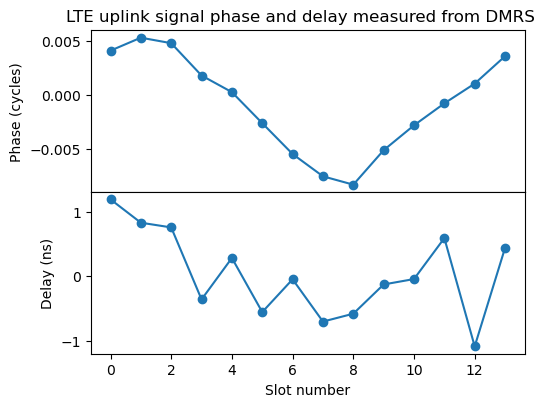

In [25]:
fig, axs = plt.subplots(2, 1, figsize=(5.6, 4.2), sharex=True)
axs[0].plot(fits_phase[:, 1], 'o-')
axs[1].plot(fits_phase[:, 0] * 1e9, 'o-')
axs[0].set_ylabel('Phase (cycles)')
axs[1].set_ylabel('Delay (ns)')
axs[1].set_xlabel('Slot number')
fig.subplots_adjust(hspace=0)
fig.suptitle('LTE uplink signal phase and delay measured from DMRS', y=0.93);

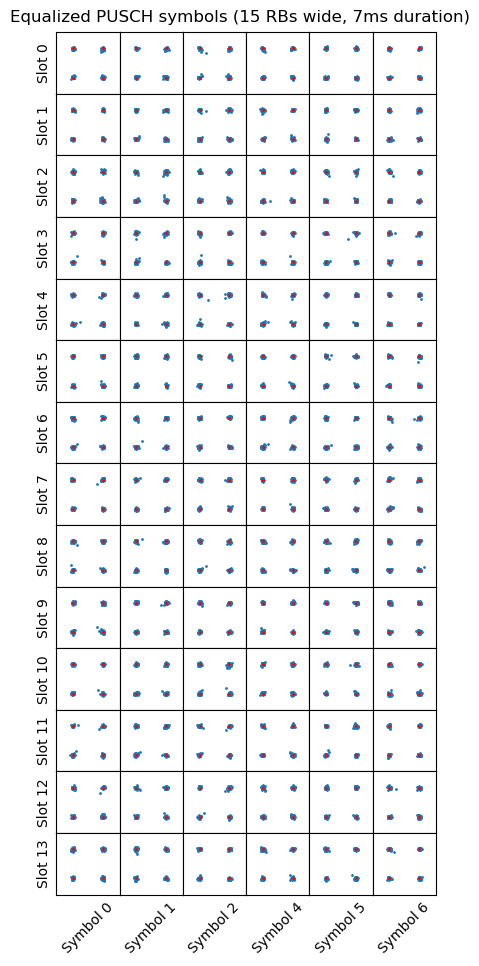

In [26]:
symbols_eq = np.empty((pusch_syms.shape[0]//7*6, pusch_syms.shape[1]), 'complex')
fig, axs = plt.subplots(14, 6, figsize=(4.9, 11.2), facecolor='w', sharex=True, sharey=True)
for j in range(14 * 7):
    slot = j // 7
    sym = j % 7
    if sym == 3:
        continue
    elif sym > 3:
        sym -= 1
    ax = axs[slot, sym]
    k = 6 * slot + sym
    symbols_eq[k] = np.fft.ifft(np.fft.fft(pusch_syms[j])
                                * np.exp(-1j*2*np.pi*np.polyval(fits_phase[slot], freq_syms[pusch_subcarriers])))
    symbols_eq[k] /= fits_amplitude[slot]
    ax.plot(symbols_eq[k].real, symbols_eq[k].imag, '.', markersize=2)
    ref = 1j**np.arange(4) * (1 + 1j)
    ax.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
            np.array([1, -1, 1, -1])/np.sqrt(2), '.',
            color='red', markersize=2)
    ax.set_xlim((-1.5, 1.5))
    ax.set_ylim((-1.5, 1.5))
    ax.set_xticks([])
    ax.set_yticks([])
    if sym == 0:
        ax.set_ylabel(f'Slot {slot}')
    if slot == axs.shape[0] - 1:
        ax.set_xlabel(f'Symbol {j % 7}', rotation=45)
        
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('Equalized PUSCH symbols (15 RBs wide, 7ms duration)', y=0.9);

In [27]:
# Calculation of EVM
err = symbols_eq.ravel()[:, np.newaxis] - (1j**np.arange(4) * (1+1j) / np.sqrt(2))[np.newaxis, :]
evm = np.sqrt(np.average(np.min(np.abs(err)**2, axis=1)))
evm, 20*np.log10(evm)

(0.0623143340315184, -24.108240840571543)

## PUCCH demodulation

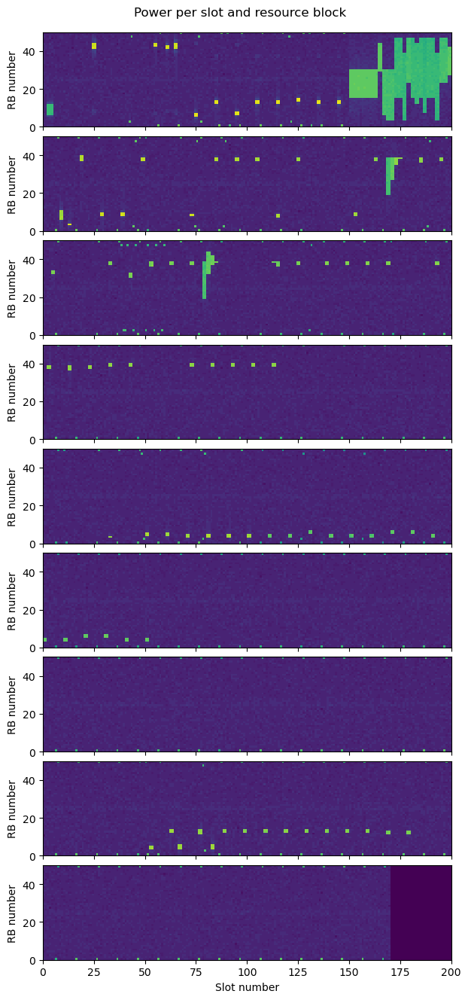

In [28]:
t_slot = t_syms[::7]
rb_pwr = np.average(np.abs(ofdm_syms.reshape(-1, 7, 50, 12))**2, axis=(1, 3))
slot_step = 200
starts = np.arange(0, rb_pwr.shape[0], slot_step)
fig, axs = plt.subplots(starts.size, 1, figsize=(7, 16), sharex=True, sharey=True)
for j in range(starts.size):
    w = np.full((rb_pwr.shape[1], slot_step), -30)
    z = 10*np.log10(rb_pwr[starts[j]:starts[j]+slot_step]).T[::-1]
    w[:, :z.shape[1]] = z
    axs[j].imshow(w, aspect='auto', interpolation='none', extent=[0, w.shape[1], 0, w.shape[0]],
                  vmin=-30, vmax=10)
plt.subplots_adjust(hspace=0.1)
plt.suptitle('Power per slot and resource block', y=0.901)
axs[-1].set_xlabel('Slot number')
for ax in axs:
    ax.set_ylabel('RB number');

In [29]:
# All possible RBs used by PUCCH
pucch_rbs = np.array([0, 2, 47, 49])

pucch_rb = np.empty(rb_pwr.shape[0], 'int')
pucch_syms = np.empty((rb_pwr.shape[0], 7, 12), 'complex')
for j in range(rb_pwr.shape[0]):    
    # Power detect the RB in which the transmission happens
    pucch_rb[j] = pucch_rbs[np.argmax(rb_pwr[j, pucch_rbs])]
    # Extract only the subcarriers in that RB
    pucch_syms[j] = ofdm_syms[7*j:7*(j+1), 12 * pucch_rb[j] + np.arange(12)]

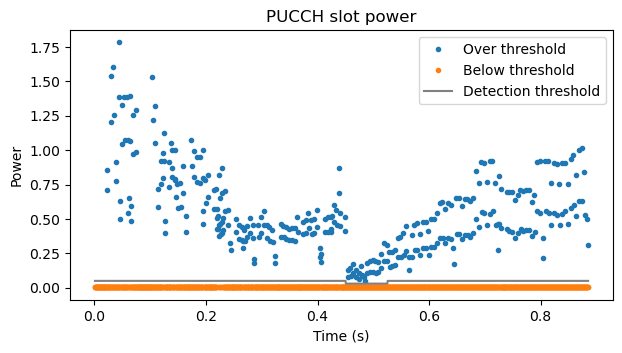

In [30]:
pucch_slot_power = np.average(np.abs(pucch_syms)**2, axis=(1, 2))
pucch_slot_threshold = np.empty_like(pucch_slot_power)
pucch_slot_threshold[:] = 0.05
pucch_slot_threshold[900:1050] = 0.03
sel = pucch_slot_power >= pucch_slot_threshold
plt.plot(t_slot[sel], pucch_slot_power[sel],
         '.', label='Over threshold')
plt.plot(t_slot[~sel], pucch_slot_power[~sel], '.',
         label='Below threshold')
plt.plot(t_slot, pucch_slot_threshold, color='gray', label='Detection threshold')
plt.title('PUCCH slot power')
plt.ylabel('Power')
plt.xlabel('Time (s)')
plt.legend();

In [31]:
pucch_active_slots = np.arange(slots)[pucch_slot_power >= pucch_slot_threshold]
pucch_active_slots.size

356

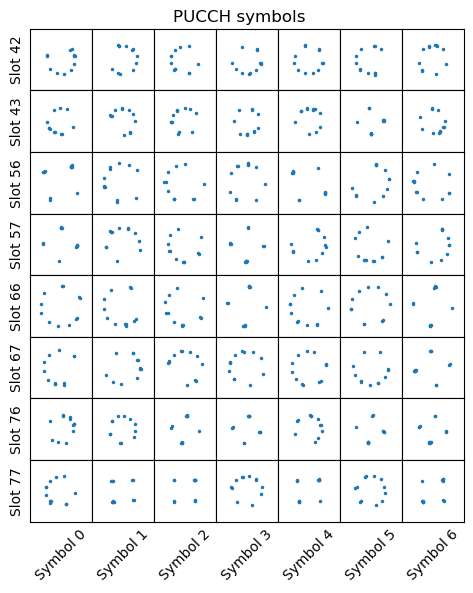

In [32]:
n_active = 8
fig, axs = plt.subplots(n_active, 7, figsize=(5.6, 5.6*n_active/7), facecolor='w', sharex=True, sharey=True)
for slot in range(n_active):
    for sym in range(7):
        ax = axs[slot, sym]
        syms = pucch_syms[pucch_active_slots[slot], sym]
        ax.plot(syms.real, syms.imag, '.', markersize=3)
        ax.set_xlim((-2, 2))
        ax.set_ylim((-2, 2))
        ax.set_xticks([])
        ax.set_yticks([])
        if sym == 0:
            ax.set_ylabel(f'Slot {pucch_active_slots[slot]}')
        if slot == axs.shape[0] - 1:
            ax.set_xlabel(f'Symbol {sym}', rotation=45)
        
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('PUCCH symbols', y=0.91);

In [33]:
pucch_active_rb = pucch_rb[pucch_active_slots]
pucch_active_rb

array([ 2, 47,  0, 49,  0, 49, 47,  2,  0, 49, 49,  0,  0, 49,  0, 49,  0,
       49, 47,  2,  0, 49, 49,  0,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,
        0, 49,  2, 47,  0, 49, 49,  0,  0, 49,  2, 47,  0, 49,  0, 49,  2,
       47,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,
        0, 49,  2, 47,  0, 49,  0, 49,  0, 49,  0, 49, 47,  2,  2, 47,  2,
       47,  0, 49,  2, 47,  2, 47,  0, 49,  2, 47,  0, 49,  0, 49,  0, 49,
        0, 49,  0, 49,  0, 49,  2, 47,  0, 49,  0, 49,  0, 49,  0, 49, 49,
        0,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,
        0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0,
       49,  0, 49,  0, 49,  0, 49,  0, 49, 49,  0,  0, 49,  0, 49,  0, 49,
       47,  2,  0, 49,  0, 49,  0, 49,  2, 47,  0, 49,  0, 49,  0, 49,  2,
       47,  0, 49,  0, 49,  2, 47,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,
        0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0, 49,  0,
       49,  0, 49,  0, 49

In [34]:
# Check that in each subframe the frequency allocation for the first slot
# and second slot are mirrored.
np.all(pucch_active_rb[::2] + pucch_active_rb[1::2] == 49)

True

In [35]:
set(zip(pucch_active_rb[::2], pucch_active_rb[1::2]))

{(0, 49), (2, 47), (47, 2), (49, 0)}

In [36]:
# Table 5.5.1.2-1 in 3GPP TS 36.211
phi = np.array([[-1,  1,  3, -3,  3,  3,  1,  1,  3,  1, -3,  3],
       [ 1,  1,  3,  3,  3, -1,  1, -3, -3,  1, -3,  3],
       [ 1,  1, -3, -3, -3, -1, -3, -3,  1, -3,  1, -1],
       [-1,  1,  1,  1,  1, -1, -3, -3,  1, -3,  3, -1],
       [-1,  3,  1, -1,  1, -1, -3, -1,  1, -1,  1,  3],
       [ 1, -3,  3, -1, -1,  1,  1, -1, -1,  3, -3,  1],
       [-1,  3, -3, -3, -3,  3,  1, -1,  3,  3, -3,  1],
       [-3, -1, -1, -1,  1, -3,  3, -1,  1, -3,  3,  1],
       [ 1, -3,  3,  1, -1, -1, -1,  1,  1,  3, -1,  1],
       [ 1, -3, -1,  3,  3, -1, -3,  1,  1,  1,  1,  1],
       [-1,  3, -1,  1,  1, -3, -3, -1, -3, -3,  3, -1],
       [ 3,  1, -1, -1,  3,  3, -3,  1,  3,  1,  3,  3],
       [ 1, -3,  1,  1, -3,  1,  1,  1, -3, -3, -3,  1],
       [ 3,  3, -3,  3, -3,  1,  1,  3, -1, -3,  3,  3],
       [-3,  1, -1, -3, -1,  3,  1,  3,  3,  3, -1,  1],
       [ 3, -1,  1, -3, -1, -1,  1,  1,  3,  1, -1, -3],
       [ 1,  3,  1, -1,  1,  3,  3,  3, -1, -1,  3, -1],
       [-3,  1,  1,  3, -3,  3, -3, -3,  3,  1,  3, -1],
       [-3,  3,  1,  1, -3,  1, -3, -3, -1, -1,  1, -3],
       [-1,  3,  1,  3,  1, -1, -1,  3, -3, -1, -3, -1],
       [-1, -3,  1,  1,  1,  1,  3,  1, -1,  1, -3, -1],
       [-1,  3, -1,  1, -3, -3, -3, -3, -3,  1, -1, -3],
       [ 1,  1, -3, -3, -3, -3, -1,  3, -3,  1, -3,  3],
       [ 1,  1, -1, -3, -1, -3,  1, -1,  1,  3, -1,  1],
       [ 1,  1,  3,  1,  3,  3, -1,  1, -1, -3, -3,  1],
       [ 1, -3,  3,  3,  1,  3,  3,  1, -3, -1, -1,  3],
       [ 1,  3, -3, -3,  3, -3,  1, -1, -1,  3, -1, -3],
       [-3, -1, -3, -1, -3,  3,  1, -1,  1,  3, -3, -3],
       [-1,  3, -3,  3, -1,  3,  3, -3,  3,  3, -1, -1],
       [ 3, -3, -3, -1, -1, -3, -1,  3, -3,  3,  1, -1]])

In [37]:
r_uv = np.exp(1j*phi*np.pi/4)
corr_r_uv = np.abs(np.fft.fft(pucch_syms[pucch_active_slots[0], 0] * np.conjugate(r_uv)))

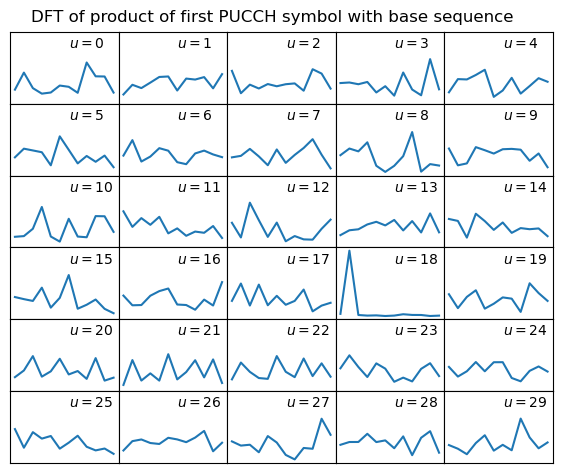

In [38]:
fig, axs = plt.subplots(6, 5, figsize=(7, 5.6), facecolor='w', sharex=True, sharey=True)
axsr = axs.ravel()
for u in range(30):
    axsr[u].plot(corr_r_uv[u])
    axsr[u].text(6, 9, f'$u = {u}$')
    axsr[u].set_yticks([])
    axsr[u].set_xticks([])
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('DFT of product of first PUCCH symbol with base sequence',
             y=0.92);

In [39]:
pucch_u = 18
pucch_ref_seq = r_uv[pucch_u]

# Determine the shift of the base sequence for each symbol
pucch_alpha = np.argmax(np.abs(np.fft.fft(pucch_syms[pucch_active_slots] * np.conjugate(pucch_ref_seq))), axis=-1)

# Wipe off the shifted base sequence at each symbol
pucch_wipe = (
    np.conjugate(np.exp(1j*2*np.pi*pucch_alpha[:, :, np.newaxis]/12*np.arange(12)) * pucch_ref_seq)
    * pucch_syms[pucch_active_slots])

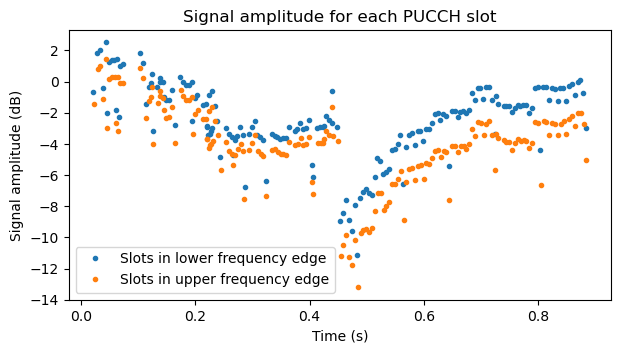

In [40]:
lower_edge = pucch_active_rb <= 25
plt.plot(t_slot[pucch_active_slots][lower_edge], 10*np.log10(pucch_slot_power[pucch_active_slots][lower_edge]), '.',
         label='Slots in lower frequency edge')
plt.plot(t_slot[pucch_active_slots][~lower_edge], 10*np.log10(pucch_slot_power[pucch_active_slots][~lower_edge]), '.',
         label='Slots in upper frequency edge')
plt.xlabel('Time (s)')
plt.ylabel('Signal amplitude (dB)')
plt.title('Signal amplitude for each PUCCH slot')
plt.legend();

In [41]:
# Estimate delay using each symbol separately and then averaging for each slot
pucch_delay_est = np.empty((pucch_wipe.shape[0], pucch_wipe.shape[1]))
for j in range(pucch_wipe.shape[0]):
    for k in range(pucch_wipe.shape[1]):
        s = pucch_wipe[j, k]
        pucch_delay_est[j, k] = np.polyfit(np.arange(12), np.angle(s / np.average(s)), 1)[0]
pucch_delay_est_avg = np.average(pucch_delay_est, axis=1)

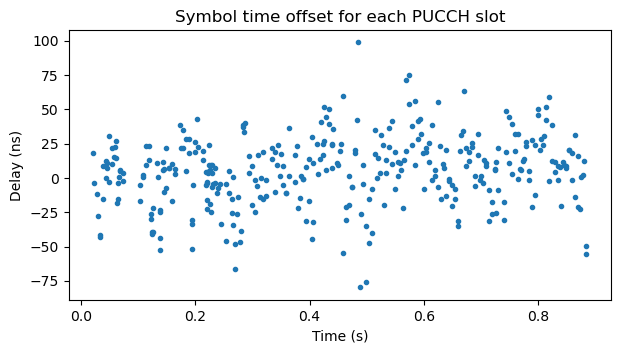

In [42]:
plt.plot(t_slot[pucch_active_slots], pucch_delay_est_avg/(2*np.pi*15e3)*1e9, '.')
plt.xlabel('Time (s)')
plt.ylabel('Delay (ns)')
plt.title('Symbol time offset for each PUCCH slot');

In [43]:
pucch_wipe_eq = (
    pucch_wipe / np.sqrt(pucch_slot_power[pucch_active_slots])[:, np.newaxis, np.newaxis]
    * np.exp(-1j*pucch_delay_est_avg[:, np.newaxis, np.newaxis]*np.arange(12)))
pucch_per_sym = np.average(pucch_wipe_eq, axis=-1)

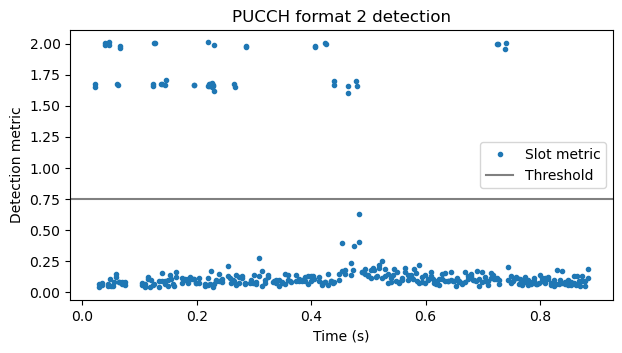

In [44]:
pucch_format2_candidate = (
    pucch_per_sym[:, [0, 2, 3, 4, 6]]
    * np.conjugate(normalize(pucch_per_sym[:, 1]))[:, np.newaxis])
pucch_qpsk_rms = np.sqrt(np.average(np.abs((pucch_format2_candidate**4 + 1)**2), axis=-1))
pucch_qpsk_rms_threshold = 0.75
plt.plot(t_slot[pucch_active_slots], pucch_qpsk_rms, '.',
         label='Slot metric')
plt.axhline(y=pucch_qpsk_rms_threshold, color='gray', label='Threshold')
plt.title('PUCCH format 2 detection')
plt.xlabel('Time (s)')
plt.ylabel('Detection metric')
plt.legend();

In [45]:
pucch_format2_sel = np.where(pucch_qpsk_rms <= pucch_qpsk_rms_threshold)[0]
pucch_format2_phase_ref = normalize(np.average(pucch_wipe_eq[pucch_format2_sel][:, 1], axis=-1))
pucch_format2_symbols = (
    pucch_wipe_eq[pucch_format2_sel]
    * np.conjugate(pucch_format2_phase_ref[:, np.newaxis, np.newaxis]))

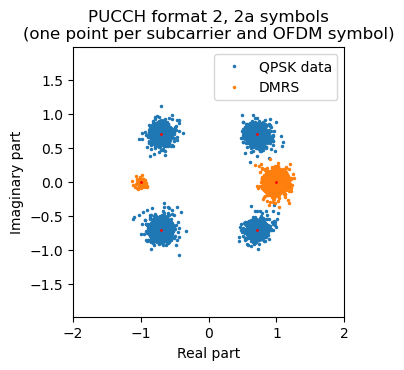

In [46]:
plt.figure(figsize=(3.5, 3.5))
pucch_format2_symbols_data = pucch_format2_symbols[:, [0, 2, 3, 4, 6]]
pucch_format2_symbols_dmrs = pucch_format2_symbols[:, [1, 5]]
plt.plot(pucch_format2_symbols_data.ravel().real, pucch_format2_symbols_data.ravel().imag, '.',
         label='QPSK data', markersize=3)
plt.plot(pucch_format2_symbols_dmrs.ravel().real, pucch_format2_symbols_dmrs.ravel().imag, '.',
         label='DMRS', markersize=3)
plt.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
         np.array([1, -1, 1, -1])/np.sqrt(2), '.',
         color='red', markersize=2)
plt.plot(np.array([1, -1]), np.array([0, 0]), '.', color='red', markersize=2)
plt.legend()
plt.axis('equal')
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.xlabel('Real part')
plt.ylabel('Imaginary part')
plt.title('PUCCH format 2, 2a symbols\n(one point per subcarrier and OFDM symbol)');

In [47]:
pucch_format1_sel = np.array([a for a in range(pucch_per_sym.shape[0]) if a not in pucch_format2_sel])
pucch_format1_sel

array([  0,   1,   6,   7,  10,  11,  18,  19,  22,  23,  36,  37,  40,
        41,  44,  45,  50,  51,  70,  71,  80,  81,  82,  83,  84,  85,
        88,  89,  90,  91,  94,  95, 108, 109, 118, 119, 162, 163, 170,
       171, 178, 179, 186, 187, 192, 193, 292, 293, 296, 297])

In [48]:
pucch_format2_sel

array([  2,   3,   4,   5,   8,   9,  12,  13,  14,  15,  16,  17,  20,
        21,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,
        38,  39,  42,  43,  46,  47,  48,  49,  52,  53,  54,  55,  56,
        57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
        72,  73,  74,  75,  76,  77,  78,  79,  86,  87,  92,  93,  96,
        97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 110, 111,
       112, 113, 114, 115, 116, 117, 120, 121, 122, 123, 124, 125, 126,
       127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
       140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152,
       153, 154, 155, 156, 157, 158, 159, 160, 161, 164, 165, 166, 167,
       168, 169, 172, 173, 174, 175, 176, 177, 180, 181, 182, 183, 184,
       185, 188, 189, 190, 191, 194, 195, 196, 197, 198, 199, 200, 201,
       202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214,
       215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 22

In [49]:
pucch_active_slots[pucch_format2_sel][::2]//2

array([ 28,  33,  43,  48,  53,  58,  63,  68,  73, 103, 108, 113, 118,
       123, 133, 138, 143, 148, 153, 158, 163, 173, 178, 183, 188, 193,
       198, 203, 213, 218, 223, 228, 233, 238, 243, 253, 258, 263, 268,
       273, 278, 283, 293, 298, 303, 308, 313, 318, 323, 333, 338, 343,
       348, 353, 358, 363, 373, 378, 383, 388, 393, 398, 403, 413, 418,
       423, 428, 433, 438, 448, 453, 458, 468, 473, 483, 488, 493, 498,
       503, 508, 513, 518, 523, 528, 533, 538, 543, 548, 553, 558, 563,
       568, 573, 578, 583, 588, 593, 598, 603, 608, 613, 618, 623, 628,
       633, 638, 643, 648, 653, 658, 663, 668, 673, 678, 683, 688, 693,
       698, 703, 708, 713, 718, 723, 728, 743, 748, 753, 758, 763, 768,
       773, 778, 783, 788, 793, 798, 803, 808, 813, 818, 823, 828, 833,
       838, 843, 848, 853, 858, 863, 868, 873, 878, 883])

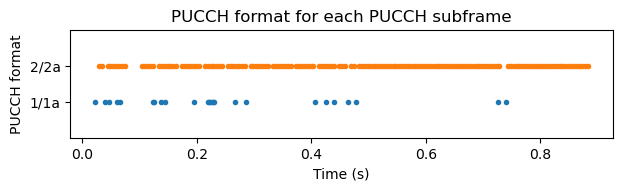

In [50]:
plt.figure(figsize=(7, 1.4))
plt.plot(t_slot[pucch_active_slots][pucch_format1_sel[::2]], [1] * (pucch_format1_sel.size//2), '.')
plt.plot(t_slot[pucch_active_slots][pucch_format2_sel[::2]], [2] * (pucch_format2_sel.size//2), '.')
plt.yticks([1, 2], ['1/1a', '2/2a'])
plt.ylim((0, 3))
plt.ylabel('PUCCH format')
plt.xlabel('Time (s)')
plt.title('PUCCH format for each PUCCH subframe');

In [51]:
# Check that the same format is detected in the two slots in each subframe
assert np.all(pucch_format1_sel[::2] + 1 == pucch_format1_sel[1::2])
assert np.all(pucch_format2_sel[::2] + 1 == pucch_format2_sel[1::2])

In [52]:
pucch_rb_format1 = pucch_rb[pucch_active_slots][pucch_format1_sel]
set(zip(pucch_rb_format1[::2], pucch_rb_format1[1::2]))

{(2, 47), (47, 2), (49, 0)}

In [53]:
pucch_rb_format2 = pucch_rb[pucch_active_slots][pucch_format2_sel]
set(zip(pucch_rb_format2[::2], pucch_rb_format2[1::2]))

{(0, 49)}

In [54]:
dmrs_pucch_format1_seq_idx = np.argmax(np.abs(np.fft.fft(pucch_per_sym[pucch_format1_sel, 2:5])),
                                       axis=-1)
dmrs_pucch_format1_seq_idx

array([1, 2, 0, 0, 0, 0, 1, 1, 0, 0, 2, 1, 0, 0, 1, 2, 1, 2, 2, 1, 0, 2,
       2, 2, 2, 1, 2, 1, 1, 2, 2, 0, 1, 2, 0, 0, 0, 0, 0, 0, 2, 1, 1, 2,
       2, 2, 0, 0, 0, 0])

In [55]:
dmrs_pucch_format1_wipe = (pucch_wipe_eq[pucch_format1_sel, 2:5] 
                           * np.exp(-1j*2*np.pi*dmrs_pucch_format1_seq_idx[:, np.newaxis]*np.arange(3)/3)[..., np.newaxis])
pucch_format1_phase_ref = normalize(np.average(dmrs_pucch_format1_wipe, axis=(1, 2)))
pucch_format1_data = (
    pucch_wipe_eq[pucch_format1_sel][:, [0, 1, 5, 6]]
    * np.conjugate(pucch_format1_phase_ref)[:, np.newaxis, np.newaxis])
pucch_format1_dmrs = dmrs_pucch_format1_wipe * np.conjugate(pucch_format1_phase_ref)[:, np.newaxis, np.newaxis]
pucch_format1_w = np.array([[1, 1, 1, 1], [1, -1, 1, -1], [1, -1, -1, 1]])
pucch_w_sel = np.argmax(np.abs(np.average(pucch_format1_data, axis=-1) @ pucch_format1_w.T), axis=-1)
pucch_format1_data_wipe = pucch_format1_data * pucch_format1_w[pucch_w_sel][..., np.newaxis]

In [56]:
# Check that the sequence index used for the data symbols overlay code
# and for spreading the DMRS matches
assert np.all(pucch_w_sel == dmrs_pucch_format1_seq_idx)

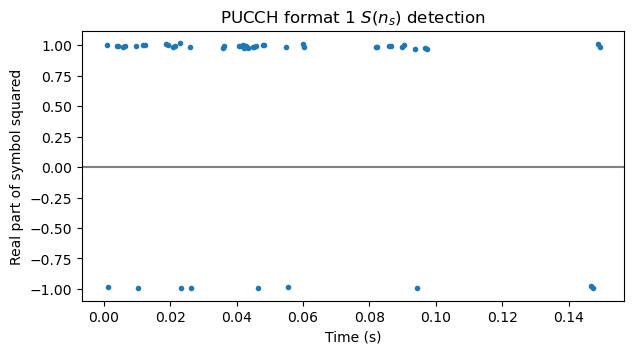

In [57]:
pucch_format1_sq = (np.average(pucch_format1_data_wipe, axis=(1, 2))**2).real
plt.plot(t_slot[pucch_format1_sel], pucch_format1_sq, '.')
plt.axhline(y=0, color='grey')
pucch_format1_S = pucch_format1_sq < 0
plt.title('PUCCH format 1 $S(n_s)$ detection')
plt.ylabel('Real part of symbol squared')
plt.xlabel('Time (s)');

In [58]:
pucch_format1_data_wipe_S = pucch_format1_data_wipe.copy()
pucch_format1_data_wipe_S[pucch_format1_S] *= -1j

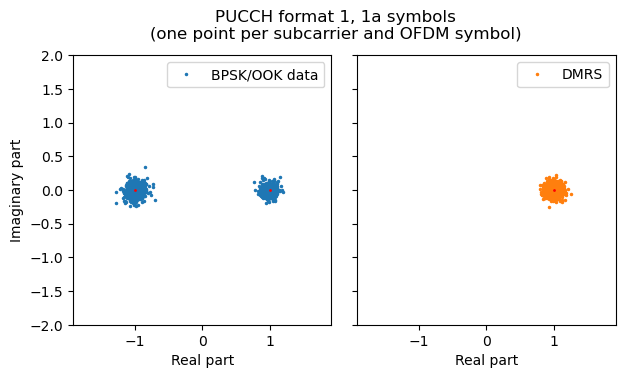

In [59]:
fig, axs = plt.subplots(1, 2, figsize=(7, 3.5), sharey=True)
axs[0].plot(pucch_format1_data_wipe_S.ravel().real, pucch_format1_data_wipe_S.ravel().imag, '.',
            label='BPSK/OOK data', markersize=3)
axs[0].plot(np.array([1, -1]), np.array([0, 0]), '.', color='red', markersize=2)
axs[1].plot(pucch_format1_dmrs.ravel().real, pucch_format1_dmrs.ravel().imag, '.',
            label='DMRS', color='C1', markersize=3)
axs[1].plot(np.array([1]), np.array([0]), '.', color='red', markersize=2)
for ax in axs:
    ax.axis('equal')
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.legend()
    ax.set_xlabel('Real part')
axs[0].set_ylabel('Imaginary part')
fig.subplots_adjust(wspace=0.1)
fig.suptitle('PUCCH format 1, 1a symbols\n(one point per subcarrier and OFDM symbol)', y=1.01);

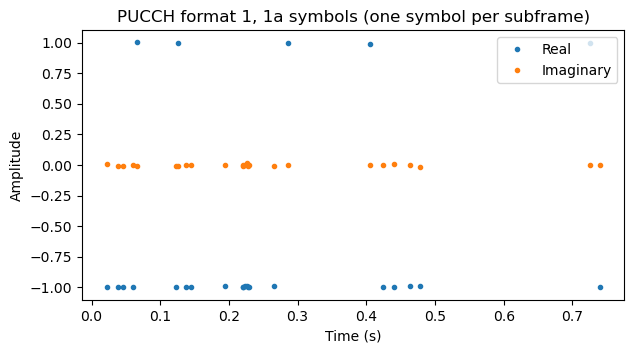

In [60]:
pucch_format1_bits = np.average(np.average(pucch_format1_data_wipe_S, axis=(1, 2)).reshape(-1, 2), axis=-1)
t_pucch_format1 = t_slot[pucch_active_slots][pucch_format1_sel[::2]]
plt.plot(t_pucch_format1, pucch_format1_bits.real, '.', label='Real')
plt.plot(t_pucch_format1, pucch_format1_bits.imag, '.', label='Imaginary')
plt.title('PUCCH format 1, 1a symbols (one symbol per subframe)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend();

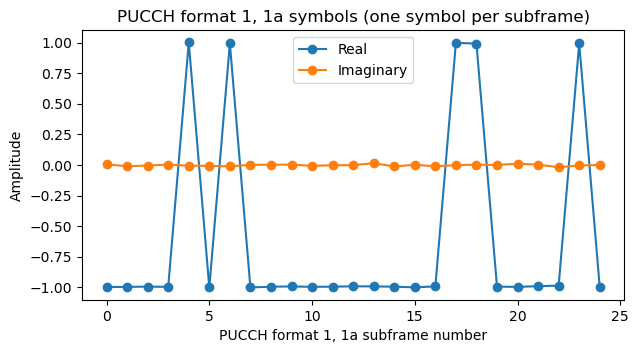

In [61]:
plt.plot(pucch_format1_bits.real, 'o-', label='Real')
plt.plot(pucch_format1_bits.imag, 'o-', label='Imaginary')
plt.title('PUCCH format 1, 1a symbols (one symbol per subframe)')
plt.xlabel('PUCCH format 1, 1a subframe number')
plt.ylabel('Amplitude')
plt.legend();

In [62]:
N_cell_id = 378
c_rsid = c_seq(N_cell_id, 8 * 7 * 20)
ncell_cs = np.packbits(c_rsid.reshape(20, 7, 8)[..., ::-1], axis=-1)[..., 0]

In [63]:
(pucch_alpha[0] - ncell_cs) % 12

array([[ 4,  9, 10, 10,  4,  2,  8],
       [ 0,  1,  2,  7,  6,  8,  9],
       [10, 10, 10, 10, 10, 10, 10],
       [ 1,  7,  7,  0,  8,  9,  7],
       [ 1,  8,  2,  7,  4,  0,  4],
       [ 1, 10,  6,  8, 11,  6,  4],
       [ 9,  2,  4,  2,  8,  7,  9],
       [ 7, 11, 10,  1,  7,  2,  9],
       [ 0, 11,  3,  5,  9,  5,  1],
       [ 8,  4, 11,  6,  2,  8,  3],
       [ 4,  1,  5, 11,  4,  6,  7],
       [ 2,  0,  4,  9,  6,  8,  6],
       [ 5,  2,  4,  7,  3,  0,  5],
       [ 9,  5,  7,  5,  2,  7,  0],
       [ 7, 11,  4,  5,  4,  4, 11],
       [ 3,  2,  4, 10,  3,  7, 10],
       [ 8,  5,  4,  9,  0,  4,  4],
       [11,  4,  7,  2,  4, 11,  1],
       [ 8,  4,  9,  5,  7,  5,  3],
       [ 8,  3,  7,  2,  9,  0,  4]])

In [64]:
ns0 = (2 - pucch_active_slots[0]) % 20
ns0

0

In [65]:
pucch_alpha_match = np.array([(pucch_alpha[j] - ncell_cs[(pucch_active_slots[j] + ns0) % 20]) % 12 for j in range(pucch_alpha.shape[0])])
np.all(pucch_alpha_match == pucch_alpha_match[:, 0][:, np.newaxis])

True

In [66]:
pucch_alpha_match[pucch_format1_sel, 0]

array([10,  7,  2,  8,  0,  2,  6,  7,  0,  2,  6,  6,  0,  2, 10,  7, 10,
        7,  6,  6,  8,  2,  8,  0,  6,  6,  6,  6, 10,  7,  2,  6, 10,  7,
        0,  2,  0,  2,  2,  8,  6,  6, 10,  7,  8,  0,  0,  2,  2,  8])

In [67]:
pucch_m = np.copy(pucch_rb[pucch_active_slots][::2])
pucch_m[pucch_m < 25] = 2 * pucch_m[pucch_m < 25]
pucch_m[pucch_m > 25] = 2 * (49 - pucch_m[pucch_m > 25]) + 1

In [68]:
pucch_m[pucch_format1_sel[::2]//2]

array([4, 5, 1, 5, 1, 4, 1, 4, 4, 4, 5, 4, 4, 4, 4, 4, 4, 1, 1, 5, 4, 4,
       4, 1, 5])

In [69]:
N2_RB = 1
n1pucch_map = {}
for j in range(36):
    k = (j % 12, (((3 * (j + 1)) % 37) - 1) % 12)
    if k in n1pucch_map:
        raise RuntimeErorr('key already present')
    n1pucch_map[k] = j

n1_pucch = np.array([n1pucch_map[a[0], a[1]] + offset for offset, a in 
                    zip(36 * (pucch_m[pucch_format1_sel[::2]//2] - N2_RB),
                    pucch_alpha_match[pucch_format1_sel, 0].reshape(-1, 2))])
n1_pucch

array([130, 146,   0, 162,   0, 138,   0, 130, 130, 138, 152, 140, 138,
       138, 130, 134, 130,   0,   0, 146, 138, 130, 140,   0, 146])

In [70]:
np_prime = np.zeros(n1_pucch.size * 2, 'int')
np_prime[::2] = n1_pucch % 36
np_prime[1::2] = ((3 * (np_prime[::2] + 1)) % 37) - 1
nocp = np_prime // 12
assert np.all(nocp == pucch_w_sel)

In [71]:
pucch_alpha_match[pucch_format2_sel, 0]

array([4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7,
       4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4, 7, 4,

In [72]:
((12 * (4 + 1)) % 13) - 1

7

In [73]:
npucch2 = 4
np.all(pucch_alpha_match[pucch_format2_sel, 0].reshape(-1, 2) == np.array([npucch2 % 12, ((12 * ((npucch2 % 12) + 1)) % 13) - 1]))

True

In [74]:
pucch_format2_qpsk = np.average(pucch_format2_symbols[:, [0, 2, 3, 4, 6]], axis=-1).reshape(-1, 10)
pucch_format2_ns_2 = ((pucch_active_slots[pucch_format2_sel[::2]] + ns0) % 20) // 2
pucch_format2_ns_2

array([8, 3, 3, 8, 3, 8, 3, 8, 3, 3, 8, 3, 8, 3, 3, 8, 3, 8, 3, 8, 3, 3,
       8, 3, 8, 3, 8, 3, 3, 8, 3, 8, 3, 8, 3, 3, 8, 3, 8, 3, 8, 3, 3, 8,
       3, 8, 3, 8, 3, 3, 8, 3, 8, 3, 8, 3, 3, 8, 3, 8, 3, 8, 3, 3, 8, 3,
       8, 3, 8, 8, 3, 8, 8, 3, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8,
       3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8,
       3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8,
       3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3, 8, 3])

In [75]:
# TS 36.212 Table 5.2.3.3-1
G_reed_muller = np.array([
[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0],
[1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0],
[1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1],
[1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1],
[1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1],
[1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1],
[1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1],
[1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1],
[1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1],
[1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1],
[1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1],
[1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1],
[1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1],
[1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1],
[1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1],
[1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1],
[1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1],
[1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1],
[1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]])

G_reed_muller_10 = G_reed_muller[:, :10]

In [76]:
H_reed_muller = np.zeros((7, 20), 'int')
H_reed_muller[:, :7] = np.eye(7, dtype='int')
H_reed_muller[:, 7:] = G_reed_muller[:-13] @ np.round(np.linalg.inv(G_reed_muller[-13:])).astype('int') % 2
assert np.all((H_reed_muller @ G_reed_muller) % 2 == 0)

In [77]:
G_reed_muller_10_row_perm = np.roll(np.arange(20), 1)
np.linalg.det(G_reed_muller_10[G_reed_muller_10_row_perm][-10:])

3.0000000000000004

In [78]:
H_reed_muller_10 = np.zeros((10, 20), 'int')
H_reed_muller_10[:, :10] = np.eye(10, dtype='int')
H_reed_muller_10[:, 10:] = (G_reed_muller_10[G_reed_muller_10_row_perm][:-10]
    @ np.round(np.linalg.det(G_reed_muller_10[G_reed_muller_10_row_perm][-10:])
               * np.linalg.inv(G_reed_muller_10[G_reed_muller_10_row_perm][-10:])).astype('int') % 2)
H_reed_muller_10 = H_reed_muller_10[:, np.roll(np.arange(20), -1)]
assert np.all((H_reed_muller_10 @ G_reed_muller_10) % 2 == 0)

In [79]:
def test_rnti(rnti, j=0):
    seq = c_seq((pucch_format2_ns_2[j] + 1) * (2 * N_cell_id + 1) * 2**16 + rnti, 20)
    csi = (pucch_format2_qpsk[j].view('float') < 0) ^ seq
    return np.all((H_reed_muller_10 @ csi) % 2 == 0)

In [80]:
rnti_tests_pucch_format2 = [rnti for rnti in range(2**16) if all([test_rnti(rnti, j=0)])]

In [81]:
len(rnti_tests_pucch_format2)

64

## PUSCH

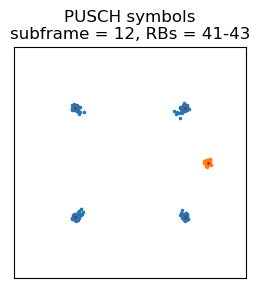

In [82]:
subframe = 12
rbs = slice(41, 44)

def pusch_demod_tb(subframe, rbs, *, do_plot=False, constellation=qpsk_constellation):
    pusch_tb_ofdm = ofdm_syms[14*subframe:14*(subframe+1), 12*rbs.start:12*rbs.stop]

    alphas = np.empty(2, 'int')
    corrs = np.empty(12)
    for n in range(2):
        for k in range(12):
            r = zadoff_chu(zc_u, zc_v, alpha=2*np.pi*k/12, M=pusch_tb_ofdm.shape[1])
            corrs[k] = np.abs(np.sum(pusch_tb_ofdm[3 + 7*n] * np.conjugate(r)))
        alphas[n] = np.argmax(corrs)
    pusch_tb_dmrs_wipe = np.array(
        [pusch_tb_ofdm[3 + 7*n] * np.conjugate(zadoff_chu(zc_u, zc_v, alpha=2*np.pi*alphas[n]/12, M=pusch_tb_ofdm.shape[1]))
        for n in range(2)])

    p_phase = np.polyfit(np.arange(pusch_tb_ofdm.shape[1]), np.angle(np.average(pusch_tb_dmrs_wipe, axis=0)), 1)
    phase_mod = np.polyval(p_phase, np.arange(pusch_tb_ofdm.shape[1]))
    pusch_tb_dmrs = (pusch_tb_dmrs_wipe * np.exp(-1j * phase_mod)).ravel()
    amp_mod = np.abs(np.average(pusch_tb_dmrs))
    pusch_tb_dmrs /= amp_mod

    pusch_tb_eq = pusch_tb_ofdm * np.exp(-1j * phase_mod) / amp_mod
    pusch_tb_syms = (np.fft.ifft(pusch_tb_eq[[0,1,2,4,5,6,7,8,9,11,12,13]]) * np.sqrt(pusch_tb_ofdm.shape[1])).ravel()

    if do_plot:
        fig = plt.figure(figsize=(3, 3))
        plt.plot(pusch_tb_syms.real, pusch_tb_syms.imag, '.', markersize=3)
        plt.plot(pusch_tb_dmrs.real, pusch_tb_dmrs.imag, '.', markersize=3)
        plt.plot(constellation.real, constellation.imag, '.',
                 color='red', markersize=2)
        plt.plot(np.array([1]), np.array([0]), '.', color='red', markersize=2)
        plt.axis('equal')
        plt.xlim(-1.5, 1.5)
        plt.ylim(-1.5, 1.5)
        plt.xticks([])
        plt.yticks([])
        plt.title(f'PUSCH symbols\nsubframe = {subframe}, RBs = {rbs.start}-{rbs.stop-1}')
        return pusch_tb_syms, pusch_tb_dmrs, fig
    return pusch_tb_syms, pusch_tb_dmrs

pusch_tb_syms, pusch_tb_dmrs, _ = pusch_demod_tb(subframe, rbs, do_plot=True)

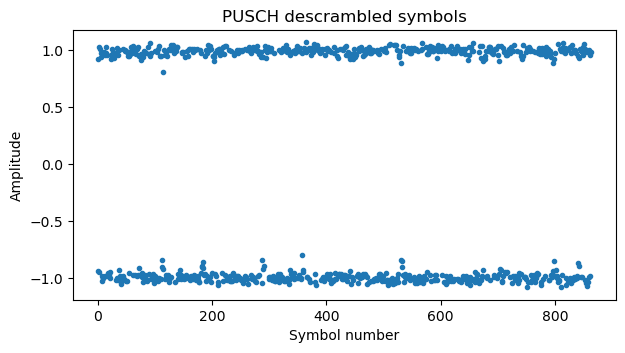

In [83]:
rnti = 0
pusch_descrambled = (-pusch_tb_syms.view('float') * np.sqrt(2)
                     * (1 - 2 * c_seq(rnti * 2**14 + (subframe % 10) * 2**9 + N_cell_id, 2*pusch_tb_syms.size).astype('float')))
plt.plot(pusch_descrambled, '.')
plt.title('PUSCH descrambled symbols')
plt.xlabel('Symbol number')
plt.ylabel('Amplitude');

In [84]:
pusch_tbs = 56
pusch_rv = 0
rnti_tests_pusch = []
for rnti in rnti_tests_pucch_format2:
    pusch_descrambled = (-pusch_tb_syms.view('float') * np.sqrt(2)
                         * (1 - 2 * c_seq(rnti * 2**14 + (subframe % 10) * 2**9 + N_cell_id, 2*pusch_tb_syms.size).astype('float')))
    pusch_deinterleaved = pusch_descrambled.view('complex').reshape(12, -1).T.ravel().view('float')
    if np.all([np.all(a[0] == a) for a in
               rate_matching_collect_turbo([(np.sign(pusch_deinterleaved), pusch_rv)], turbo_len(pusch_tbs)).values()]):
        rnti_tests_pusch.append(rnti)

In [85]:
[hex(a) for a in rnti_tests_pusch]

['0xbe52']

In [86]:
wireshark_udp_packets = []

# Format as UDP frame for wireshark
def mac_pdu_to_udp(subframe, mac_pdu, rnti, ce_mode=0, direction=1):
    udp_mac_pdu = b'mac-lte'
    radio_type = 1  # FDD
    # direction = 1 is downlink
    if rnti == None:
        rnti_type = 0  # PBCH (NO_RNTI)
    elif rnti == 0xffff:
        rnti_type = 4  # SI-RNTI
    elif rnti == 0xfffe:
        rnti_type = 1  # P-RNTI
    else:
        rnti_type = 3  # C-RNTI
    # The -1 is because subframe=0 corresponds
    # to the subframe imediately before of the first
    # PBCH.
    s = subframe #+ sfn[0] * 40 - 1 - window_offset * 10
    s = (((s // 10) << 4) | (s % 10)) & 0xffff
    payload_tag = 0x1    
    rnti_tag = 0x2
    ueid_tag = 0x3
    subframe_tag = 0x4
    ce_mode_tag = 0xe
    udp_mac_pdu += bytes([radio_type, direction, rnti_type])
    if rnti is not None:
        udp_mac_pdu += bytes([rnti_tag, rnti >> 8, rnti & 0xff])
    if rnti_type == 3:
        # use C-RNTI as UE ID, since we don't have anything better
        udp_mac_pdu += bytes([ueid_tag, rnti >> 8, rnti & 0xff])
    udp_mac_pdu += bytes([subframe_tag, s >> 8, s & 0xff])
    udp_mac_pdu += bytes([ce_mode_tag, ce_mode & 0xff])
    udp_mac_pdu += bytes([payload_tag])
    udp_mac_pdu += mac_pdu
    return udp_mac_pdu

def store_mac_pdu(subframe, mac_pdu, rnti):
    packet = (IP(src='127.0.0.1', dst='127.0.0.1')
              / UDP(sport=9999, dport=9999)
              / mac_pdu_to_udp(subframe, mac_pdu, rnti, direction=0))
    packet.time = (t_syms[14*subframe] * 1e9 * np.timedelta64(1, 'ns')
                   + np.datetime64('2022-01-30T09:35:41')
                   - np.datetime64('1970-01-01T00:00:00')) / np.timedelta64(1, 's')
    wireshark_udp_packets.append(packet)

In [87]:
rnti = 0xbe52
noise_sigma = 0.05

def pusch_fec_decode(pusch_tb_syms, subframe, rnti, tbs, noise_sigma, *,
                     q_cqi=0, q_ri=0, q_ack=0, plot_rate_match=False, plot_reencode_match=False,
                     constellation=qpsk_constellation, rv_idx=0,
                     **kwargs):
    pusch_llrs = llr_demod(pusch_tb_syms, noise_sigma, constellation)
    pusch_descrambled = (pusch_llrs 
                         * (1 - 2 * c_seq(rnti * 2**14 + (subframe % 10) * 2**9 + N_cell_id, pusch_llrs.size).astype('float')))
    bits_per_sym = int(round(np.log2(constellation.size)))
    pusch_deinterleaved = np.einsum('ijk->jik', pusch_descrambled.reshape(12, -1, bits_per_sym))
    # puncture ACK symbols, which are overwritten over the rate-matched transport block
    for i in range(q_ack):
        column_set = [2, 3, 8, 9]
        pusch_deinterleaved[pusch_deinterleaved.shape[0] - 1 - i//4, column_set[(3 * i) % 4], :] = 0.0
    # mark RI symbols for removal
    for i in range(q_ri):
        column_set = [1, 4, 7, 10]
        pusch_deinterleaved[pusch_deinterleaved.shape[0] - 1 - i//4, column_set[(3 * i) % 4], :] = np.nan
    pusch_deinterleaved = pusch_deinterleaved.ravel()
    pusch_deinterleaved = pusch_deinterleaved[~np.isnan(pusch_deinterleaved)]  # remove RI symbols
    # remove CQI bits, which are multiplexed before the rate-matched transport block
    pusch_deinterleaved = pusch_deinterleaved[q_cqi:]
    coding_rate = (tbs + 24) / pusch_deinterleaved.size
    if plot_rate_match:
        plt.figure()
        plt.plot([len(a) == 0 or np.all(a[0] == a) for a in
                  rate_matching_collect_turbo([(np.sign(pusch_deinterleaved), rv_idx)], turbo_len(tbs)).values()],
                  '.')
        plt.title('Hard symbols that coincide on rate matching')
        plt.xlabel('Turbo encoder output symbol index')
    decode = decode_transport_block([(pusch_deinterleaved, rv_idx)], tbs, **kwargs)
    if plot_reencode_match:
        encoded = 1 - 2 * np.concatenate(turbo_encode(decode)).astype('int')
        rate_match = np.array([np.sum(a) for a in
                               rate_matching_collect_turbo([(pusch_deinterleaved, rv_idx)], turbo_len(tbs)).values()])
        match = (rate_match == 0) | (np.sign(rate_match) == encoded)
        plt.figure()
        plt.plot(match, '.')
        plt.title('Hard symbols that coincide on re-encoding')
        plt.xlabel('Turbo encoder output symbol index')
    return decode, coding_rate

def pusch_decode(subframe, rbs, rnti, tbs, *,
                 constellation=qpsk_constellation, do_plot=True, plot_channel_LLRs=True, store_decoded=True, **kwargs):
    pusch_tb_syms, pusch_tb_dmrs, fig = pusch_demod_tb(subframe, rbs, do_plot=do_plot, constellation=constellation)
    noise_sigma = np.std(pusch_tb_dmrs)
    pusch_decoded, coding_rate = pusch_fec_decode(
        pusch_tb_syms, subframe, rnti, tbs, noise_sigma,
        constellation=constellation, plot_channel_LLRs=plot_channel_LLRs, **kwargs)
    fig.axes[0].set_title(fig.axes[0].get_title()
                          + f'\ntransport block size = {tbs}, coding rate = {coding_rate:.2}')
    if pusch_decoded is not None:
        if store_decoded:
            store_mac_pdu(subframe, pusch_decoded, rnti)
    else:
        raise RuntimeError('PUSCH decoding failed')

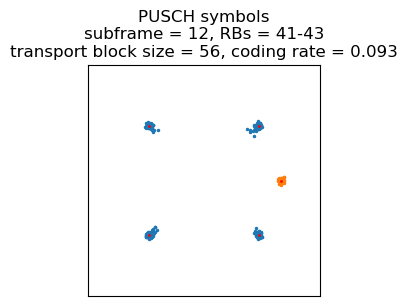

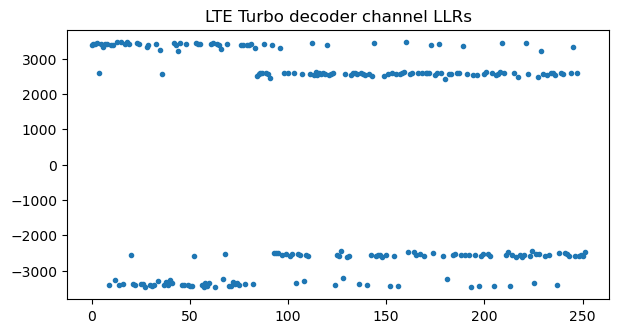

In [88]:
pusch_decode(subframe, rbs, rnti, pusch_tbs)

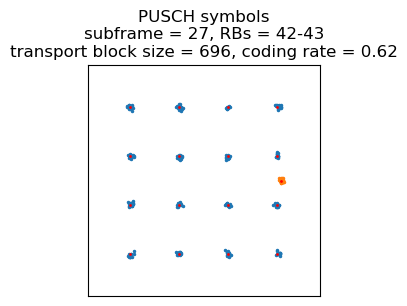

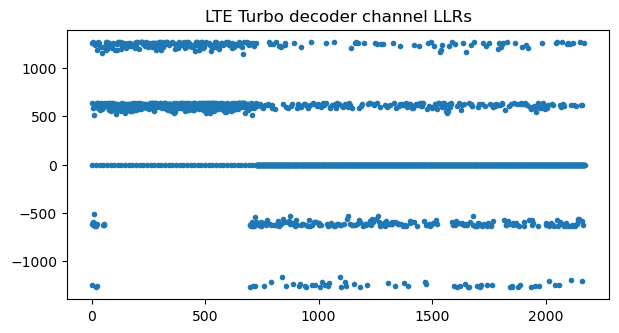

In [89]:
subframe = 27
rbs = range(42, 44)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation)

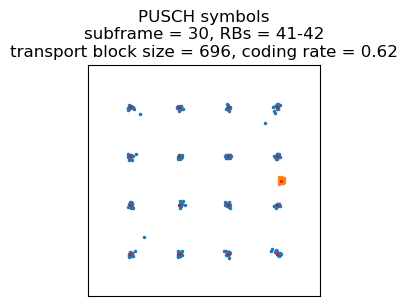

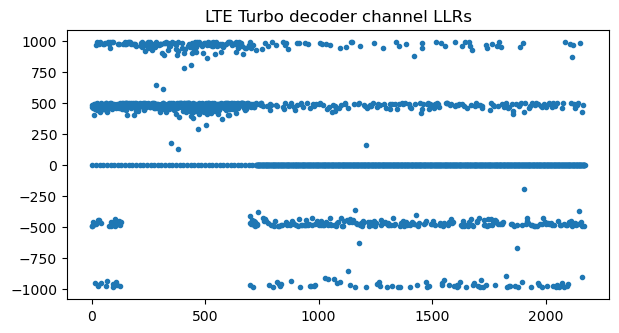

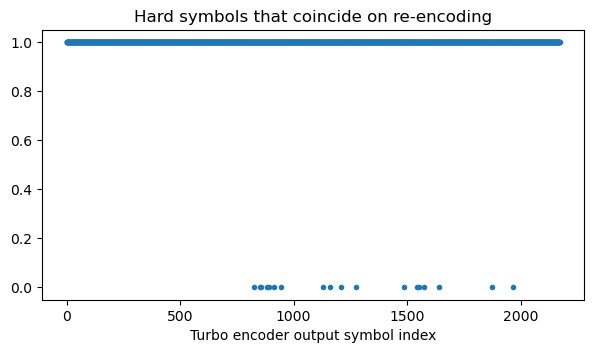

In [90]:
subframe = 30
rbs = range(41, 43)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation, q_ack=0, plot_reencode_match=True, store_decoded=False)

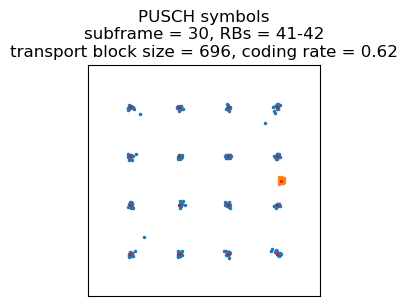

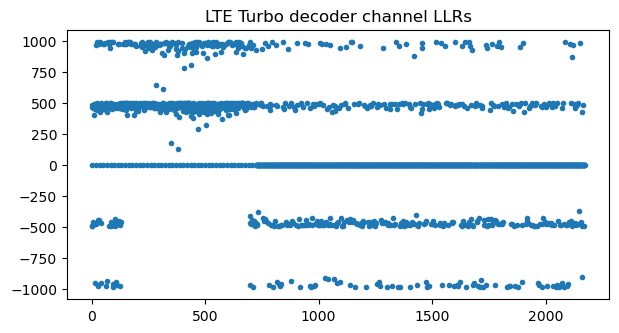

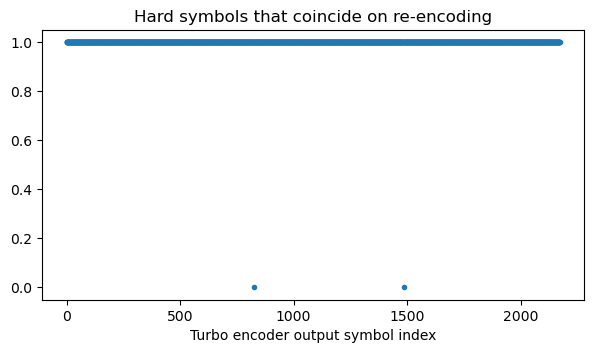

In [91]:
subframe = 30
rbs = range(41, 43)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation, q_ack=6, plot_reencode_match=True, store_decoded=False)

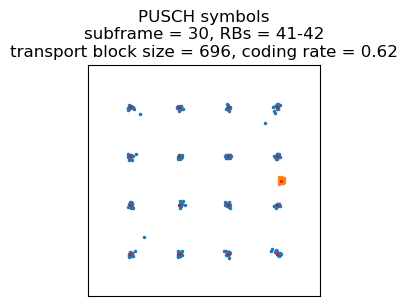

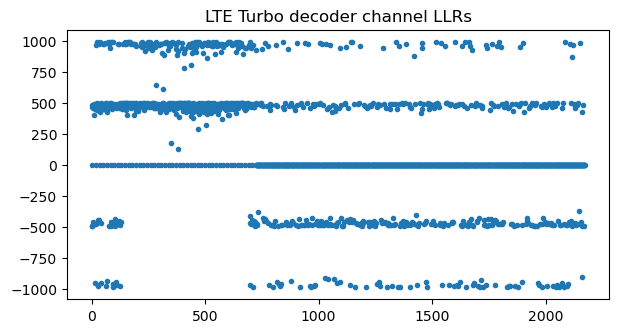

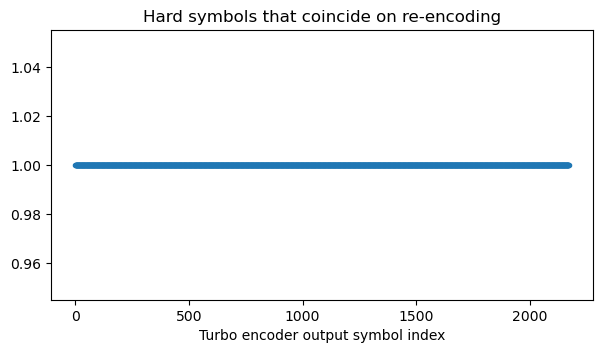

In [92]:
subframe = 30
rbs = range(41, 43)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation, q_ack=7, plot_reencode_match=True)

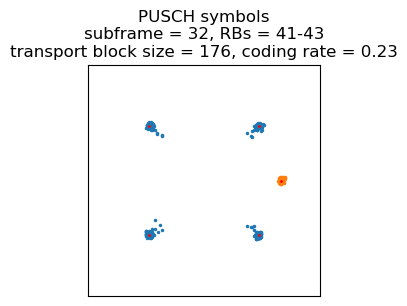

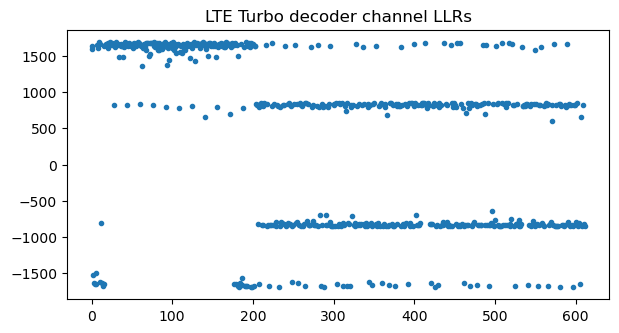

In [93]:
subframe = 32
rbs = range(41, 44)
# I_TBS = 2 -> tbs = 176
pusch_decode(subframe, rbs, rnti, 176)

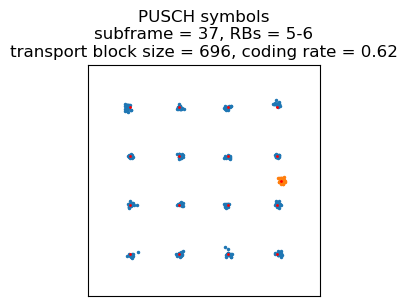

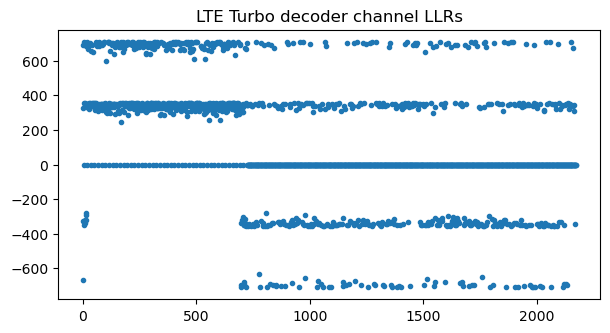

In [94]:
subframe = 37
rbs = range(5, 7)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation)

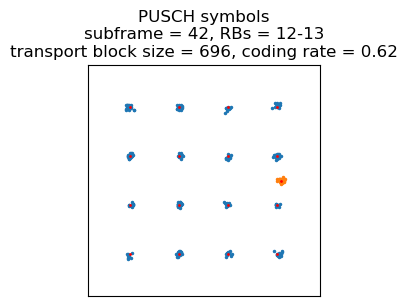

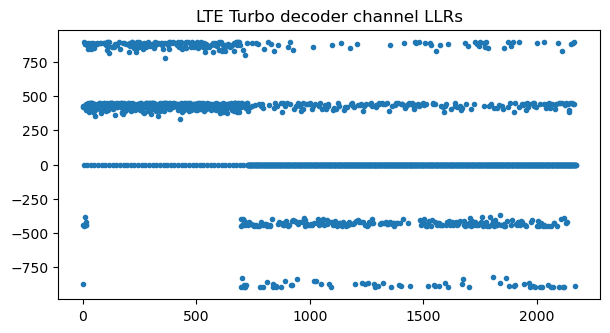

In [95]:
subframe = 42
rbs = range(12, 14)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation)

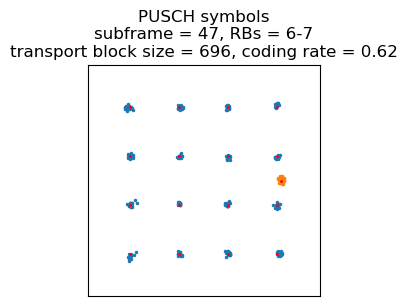

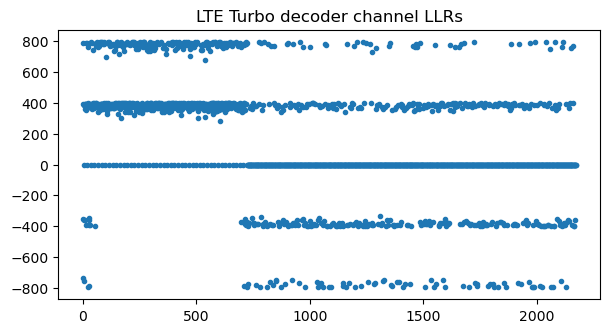

In [96]:
subframe = 47
rbs = range(6, 8)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation)

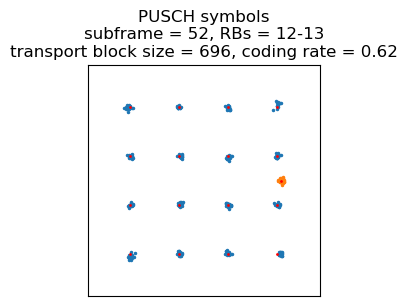

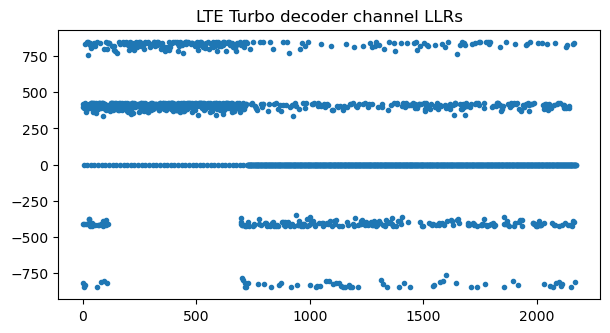

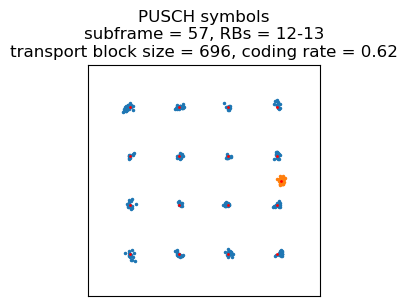

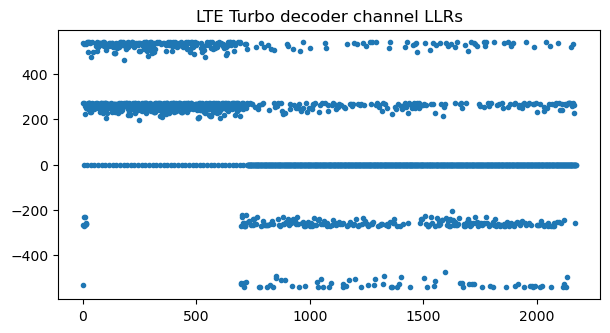

In [97]:
for subframe in [52, 57]:
    rbs = range(12, 14)
    # I_TBS = 17 -> tbs = 696
    pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation)

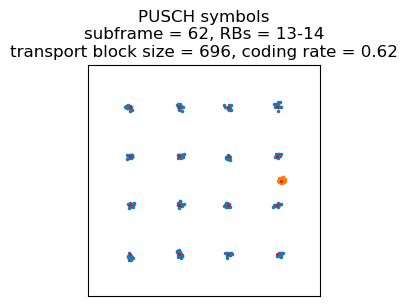

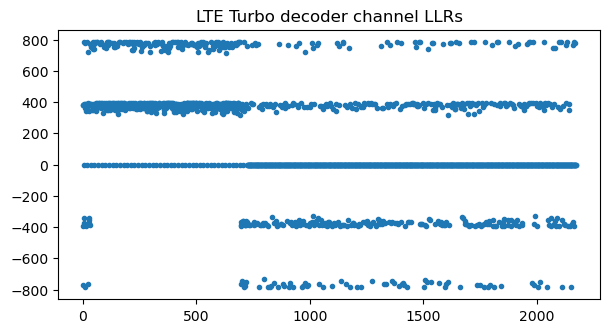

In [98]:
subframe = 62
rbs = range(13, 15)
# I_TBS = 17 -> tbs = 696
pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation)

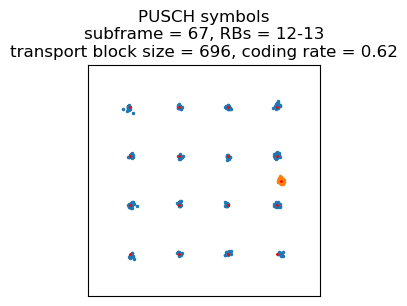

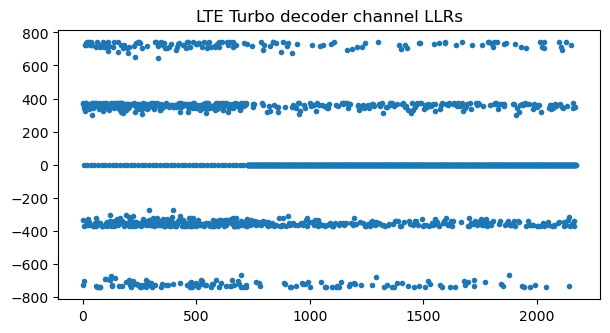

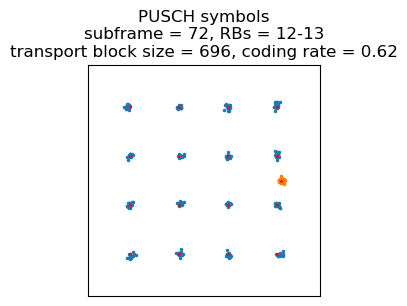

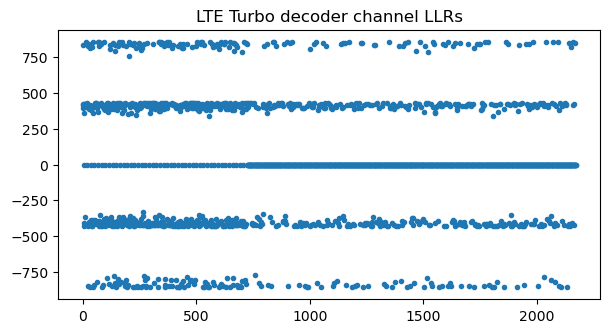

In [99]:
for subframe in [67, 72]:
    rbs = range(12, 14)
    # I_TBS = 17 -> tbs = 696
    pusch_decode(subframe, rbs, rnti, 696, constellation=qam16_constellation)

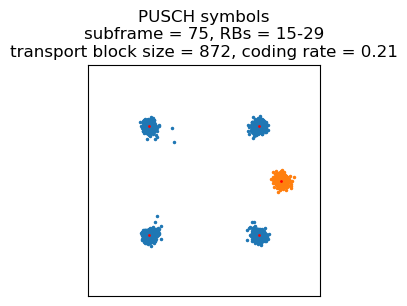

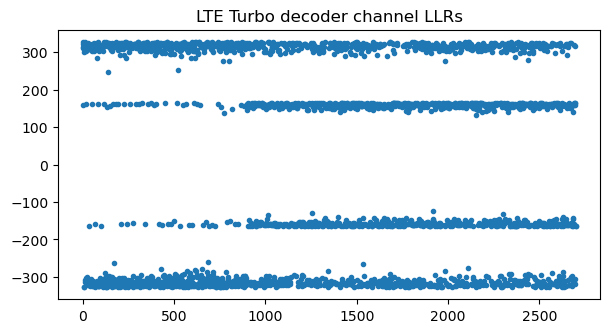

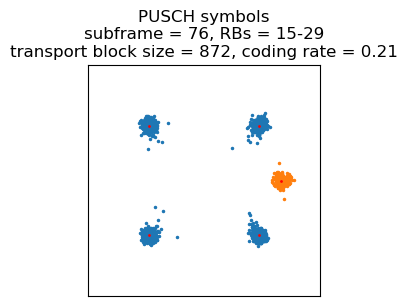

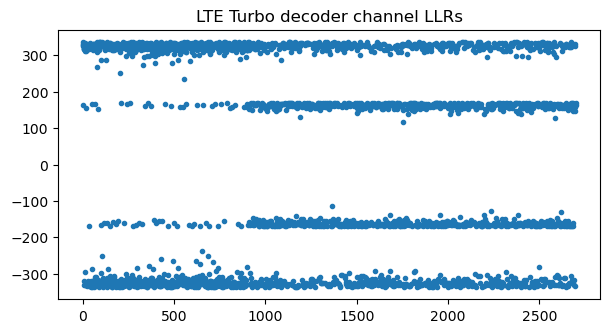

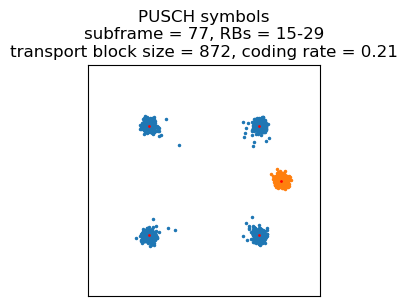

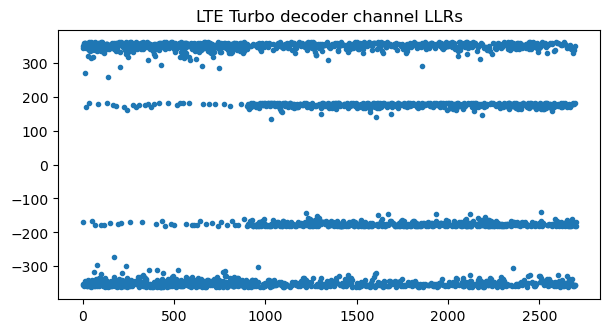

In [100]:
for subframe in range(75, 78):
    rbs = range(15, 30)
    # I_TBS = 3 -> tbs = 872
    pusch_decode(subframe, rbs, rnti, 872)

PUSCH decoding failed


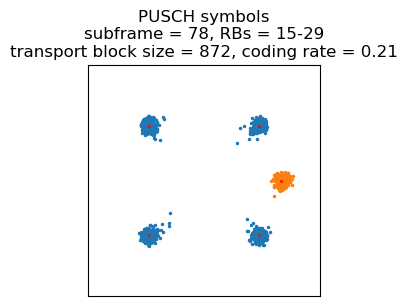

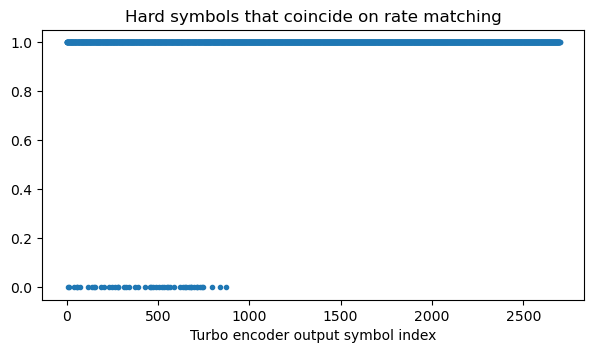

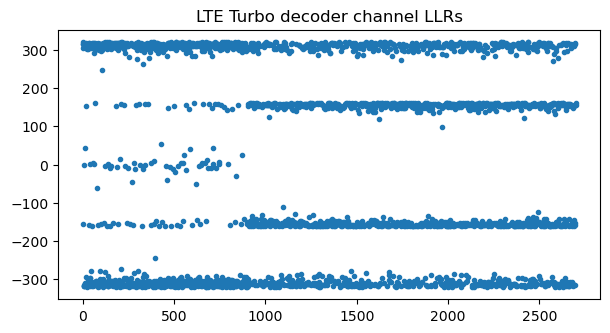

In [101]:
subframe = 78
rbs = range(15, 30)
# I_TBS = 3 -> tbs = 872
try:
    pusch_decode(subframe, rbs, rnti, 872, q_cqi=0, plot_rate_match=True)
except RuntimeError as e:
    print(e)

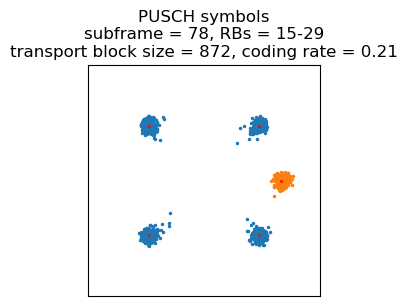

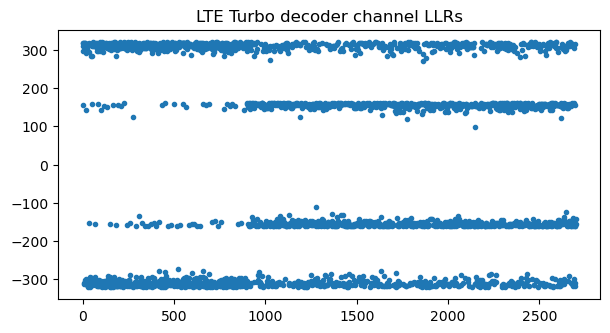

In [102]:
subframe = 78
rbs = range(15, 30)
# I_TBS = 3 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872, q_cqi=102)

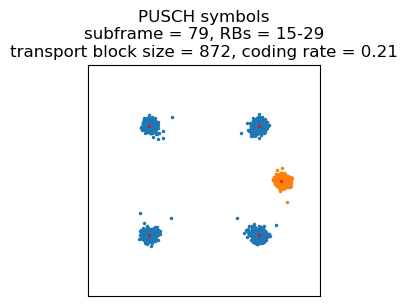

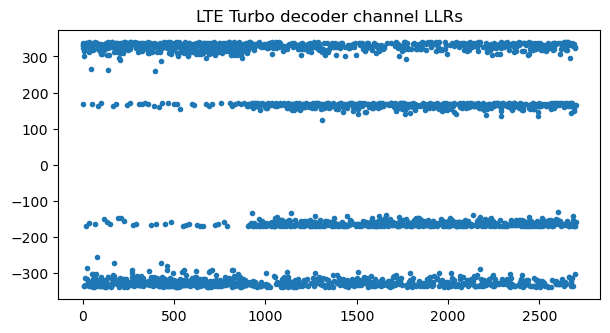

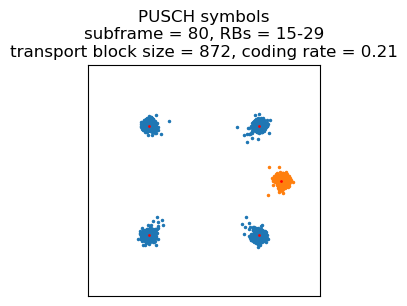

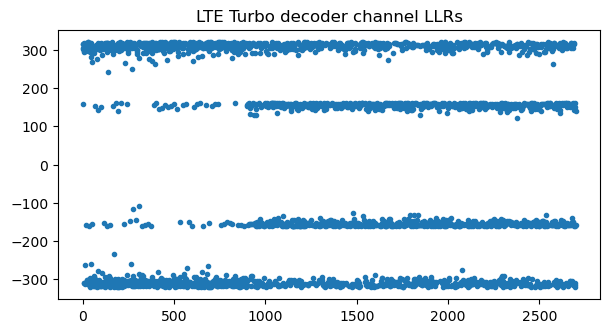

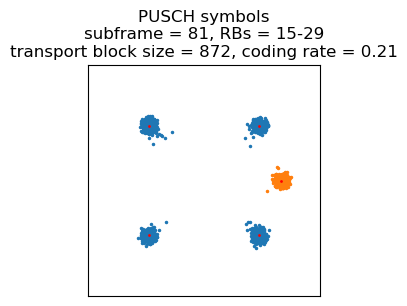

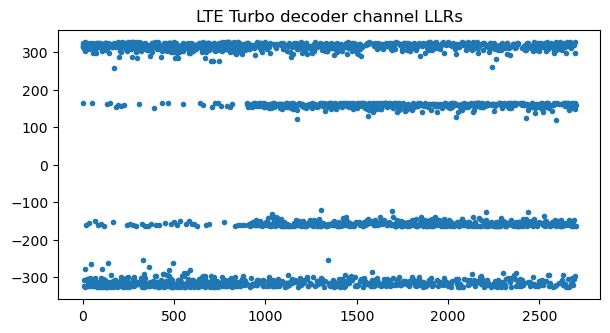

In [103]:
for subframe in range(79, 82):
    rbs = range(15, 30)
    # I_TBS = 3 -> tbs = 872
    pusch_decode(subframe, rbs, rnti, 872)

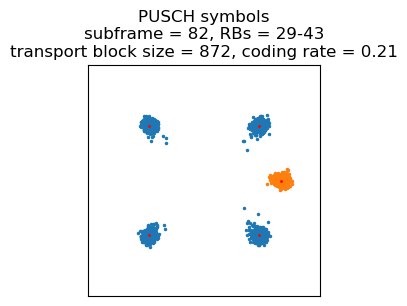

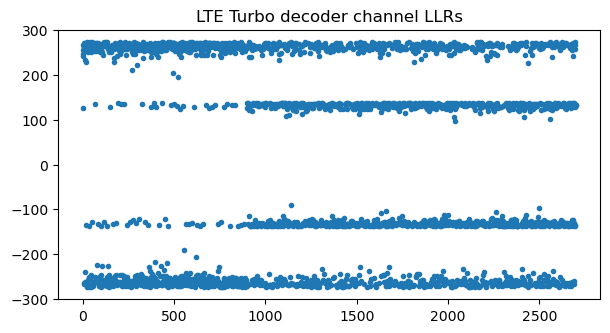

In [104]:
subframe = 82
rbs = range(29, 44)
# I_TBS = 3 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

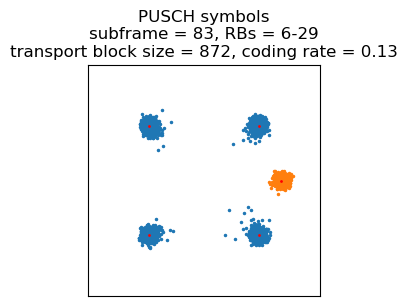

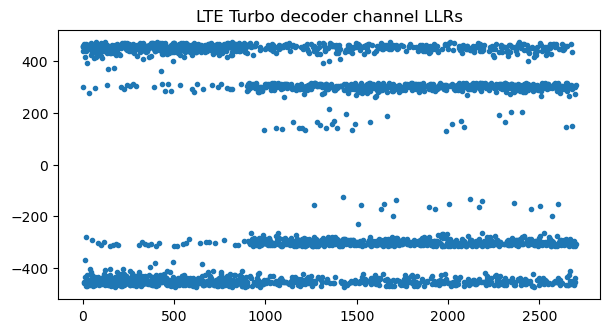

In [105]:
subframe = 83
rbs = range(6, 30)
# I_TBS = 1 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

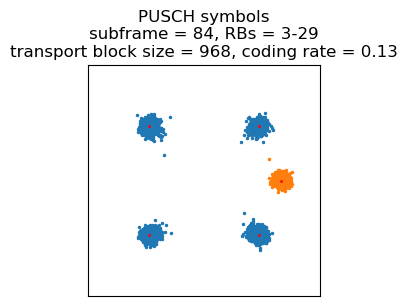

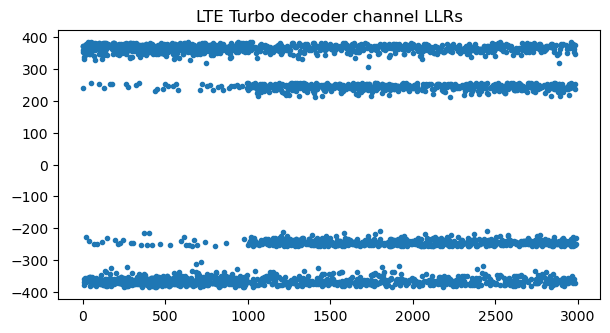

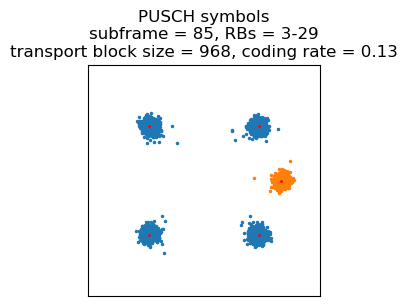

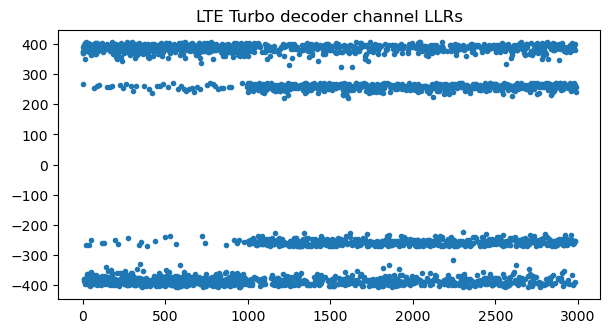

In [106]:
for subframe in range(84, 86):
    rbs = range(3, 30)
    # I_TBS = 1 -> tbs = 968
    pusch_decode(subframe, rbs, rnti, 968)

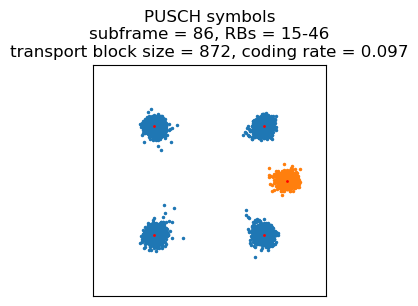

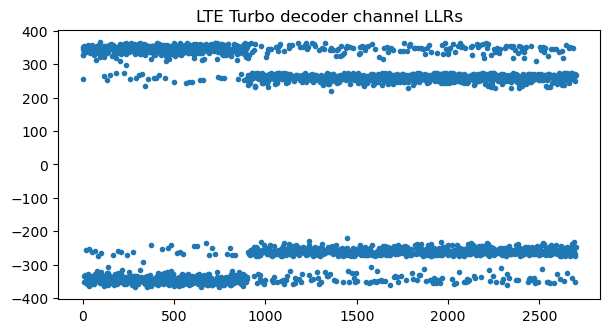

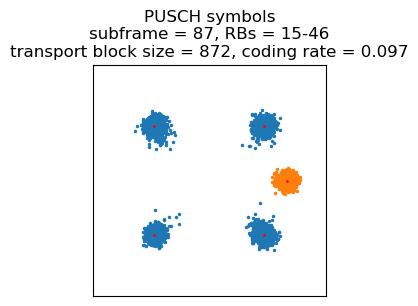

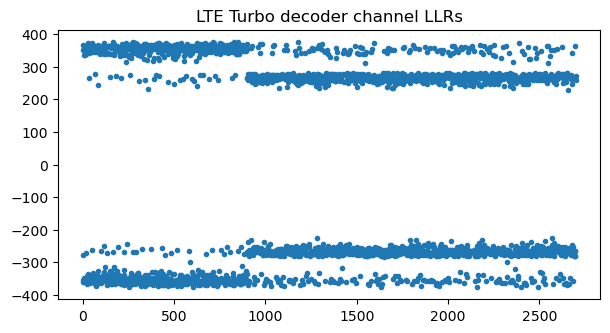

In [107]:
for subframe in range(86, 88):
    rbs = range(15, 47)
    # I_TBS = 0 -> tbs = 872
    pusch_decode(subframe, rbs, rnti, 872)    

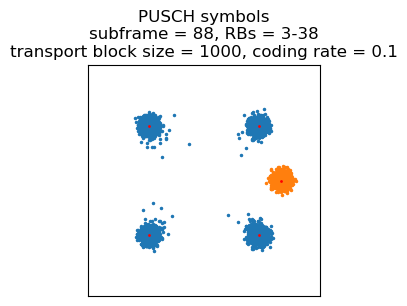

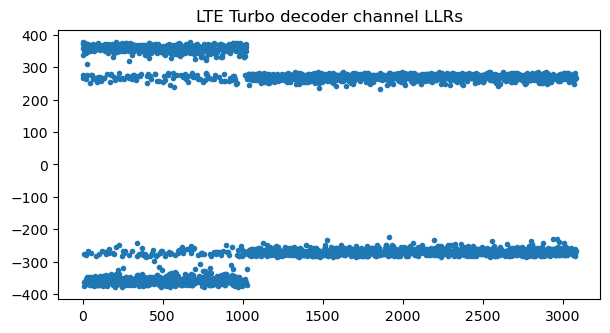

In [108]:
subframe = 88
rbs = range(3, 39)
# I_TBS = 0 -> tbs = 1000
pusch_decode(subframe, rbs, rnti, 1000, q_cqi=284)

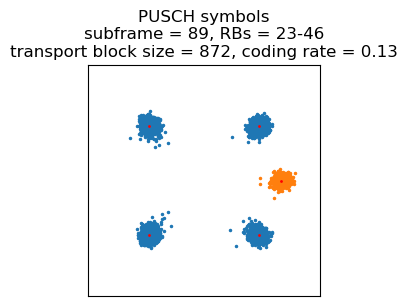

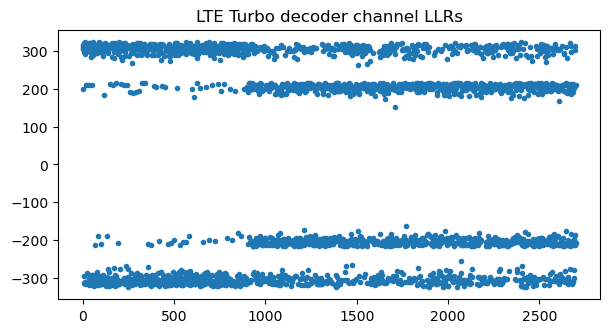

In [109]:
subframe = 89
rbs = range(23, 47)
# I_TBS = 1 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

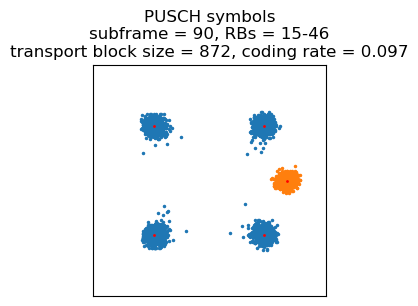

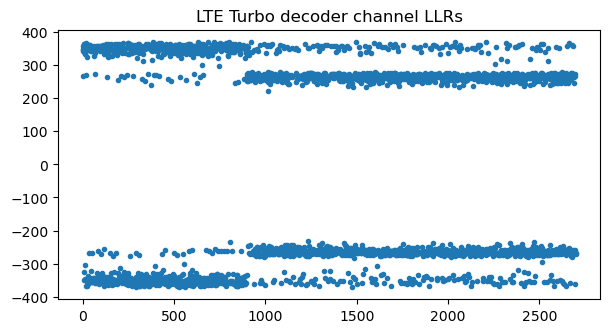

In [110]:
subframe = 90
rbs = range(15, 47)
# I_TBS = 0 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

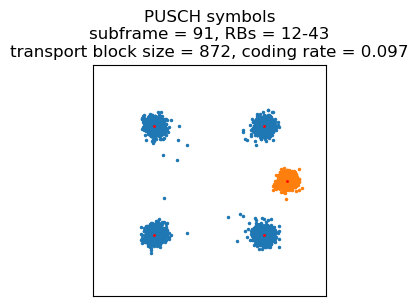

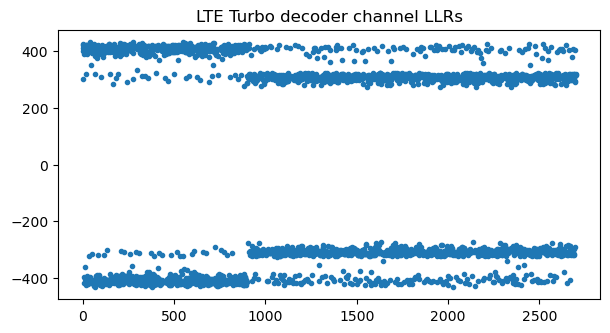

In [111]:
subframe = 91
rbs = range(12, 44)
# I_TBS = 0 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

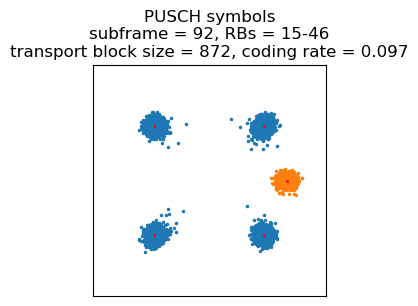

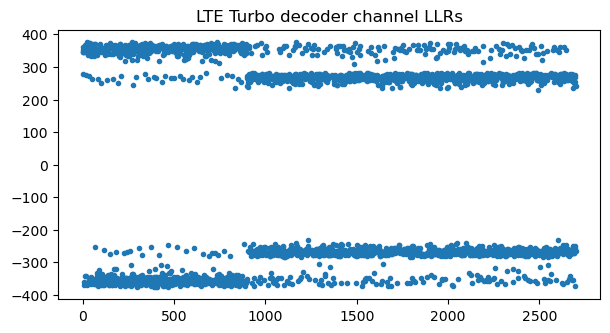

In [112]:
subframe = 92
rbs = range(15, 47)
# I_TBS = 0 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

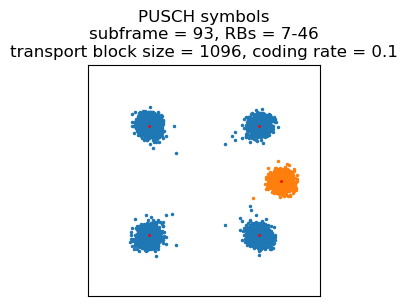

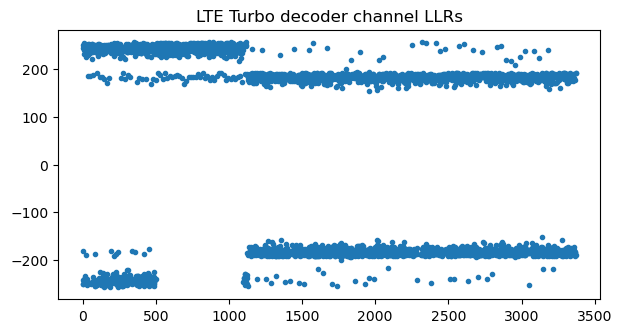

In [113]:
subframe = 93
rbs = range(7, 47)
# I_TBS = 0 -> tbs = 1096
pusch_decode(subframe, rbs, rnti, 1096, q_cqi=288)

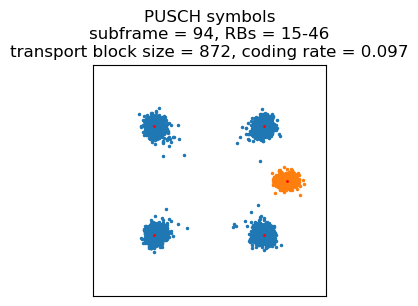

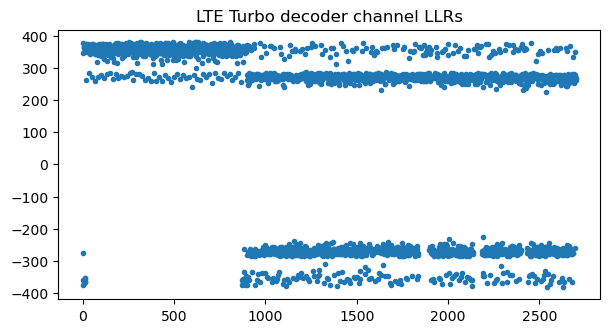

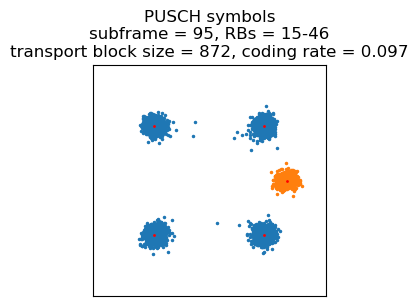

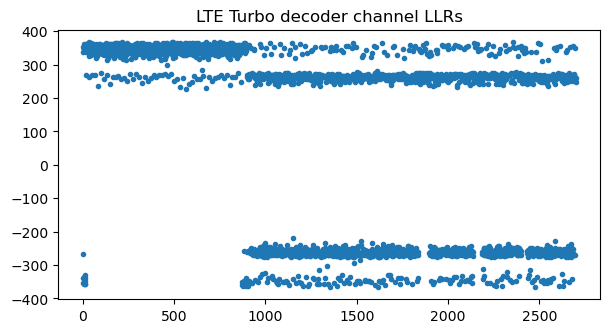

In [114]:
for subframe in range(94, 96):
    rbs = range(15, 47)
    # I_TBS = 0 -> tbs = 872
    pusch_decode(subframe, rbs, rnti, 872)

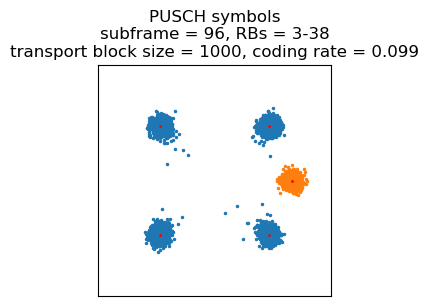

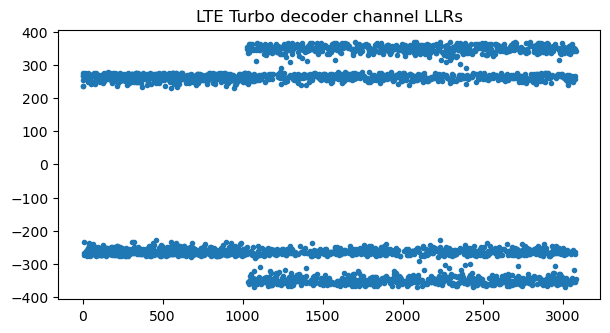

In [115]:
subframe = 96
rbs = range(3, 39)
# I_TBS = 0 -> tbs = 1000
pusch_decode(subframe, rbs, rnti, 1000, rv_idx=2)

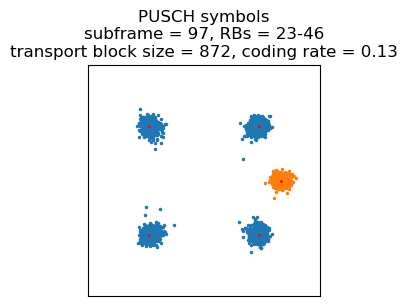

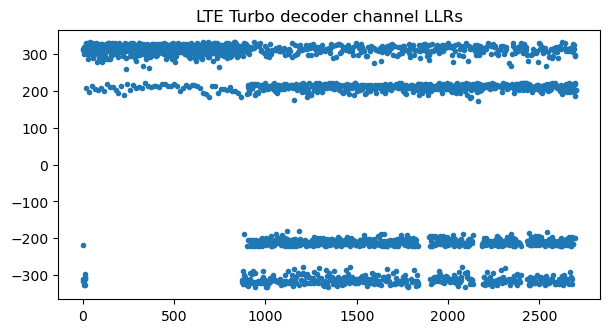

In [116]:
subframe = 97
rbs = range(23, 47)
# I_TBS = 1 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

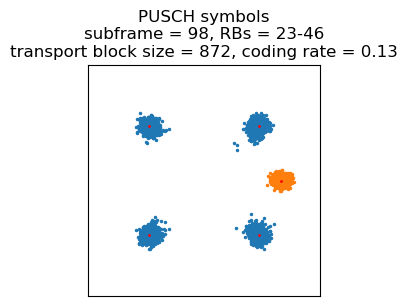

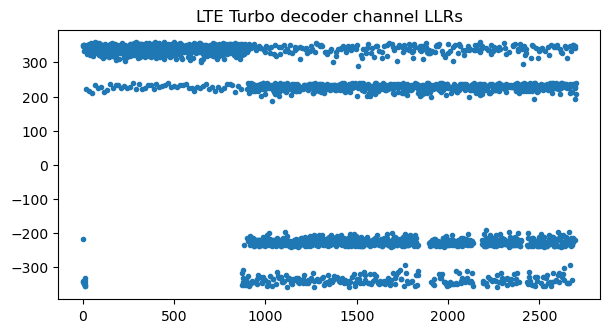

In [117]:
subframe = 98
rbs = range(23, 47)
# I_TBS = 1 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872, q_cqi=216)

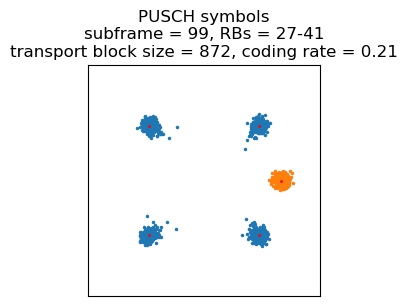

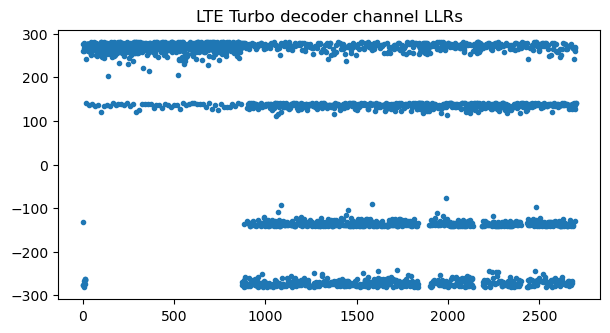

In [118]:
subframe = 99
rbs = range(27, 42)
# I_TBS = 3 -> tbs = 872
pusch_decode(subframe, rbs, rnti, 872)

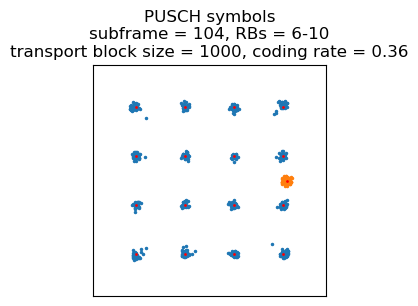

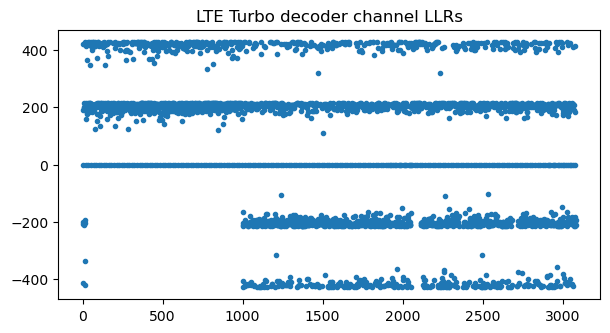

In [119]:
subframe = 104
rbs = range(6, 11)
# I_TBS = 11 -> tbs = 1000
pusch_decode(subframe, rbs, rnti, 1000, constellation=qam16_constellation)

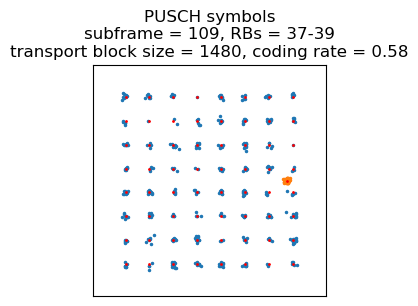

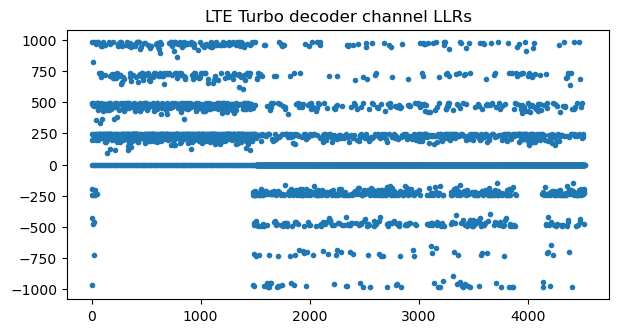

In [120]:
subframe = 109
rbs = range(37, 40)
# I_TBS = 21 -> tbs = 1480
pusch_decode(subframe, rbs, rnti, 1480, constellation=qam64_constellation)

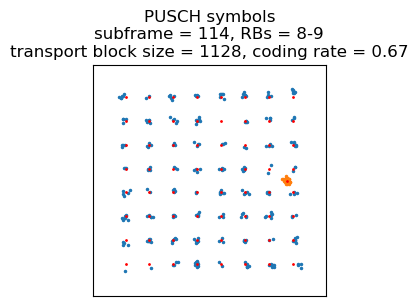

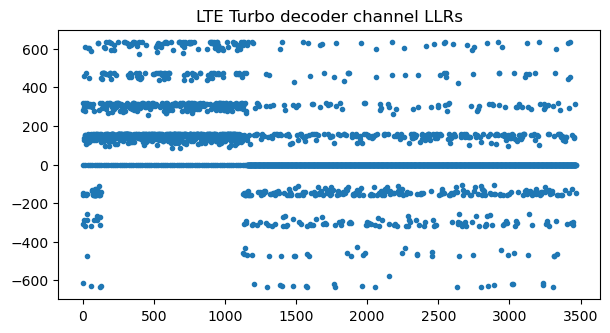

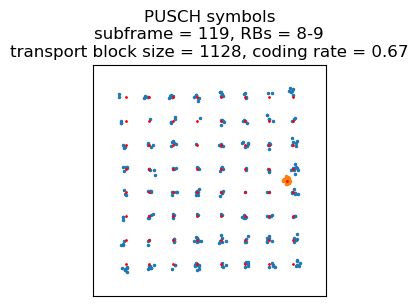

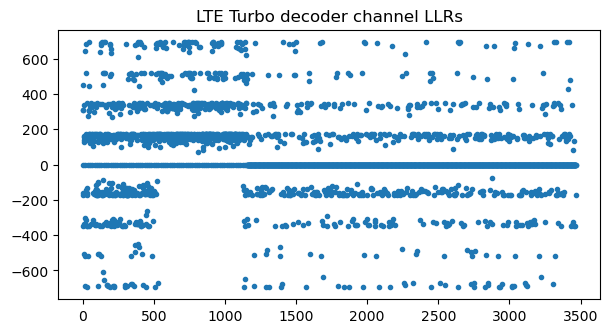

In [121]:
for subframe in [114, 119]:
    rbs = range(8, 10)
    # I_TBS = 23 -> tbs = 1128
    pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

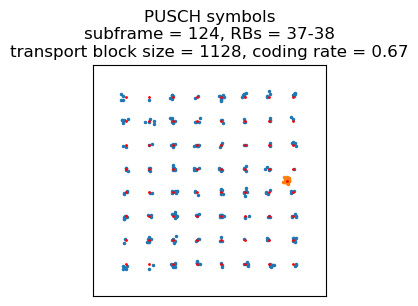

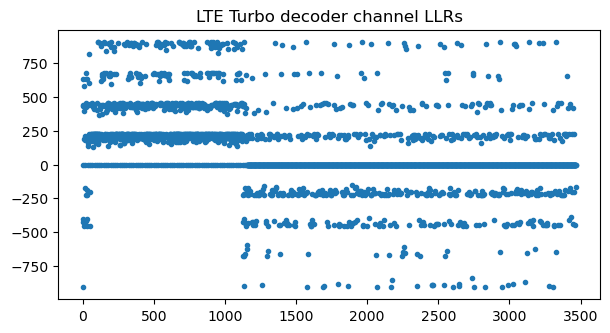

In [122]:
subframe = 124
rbs = range(37, 39)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

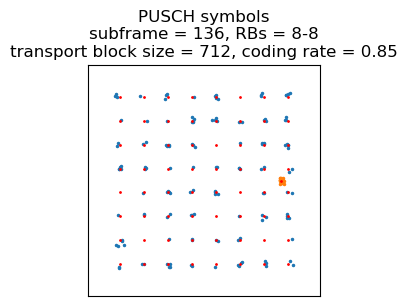

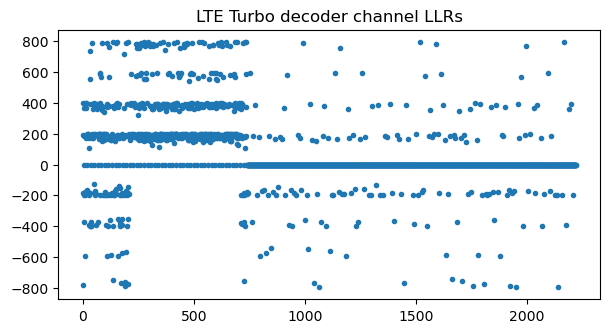

In [123]:
subframe = 136
rbs = range(8, 9)
# I_TBS = 26 -> tbs = 712
pusch_decode(subframe, rbs, rnti, 712, constellation=qam64_constellation)

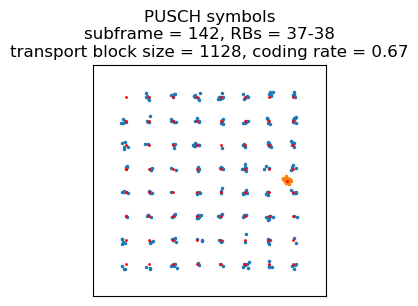

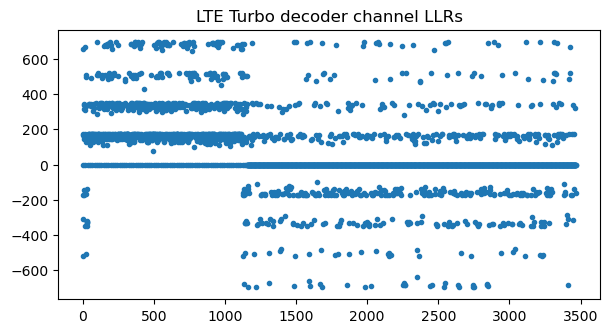

In [124]:
subframe = 142
rbs = range(37, 39)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

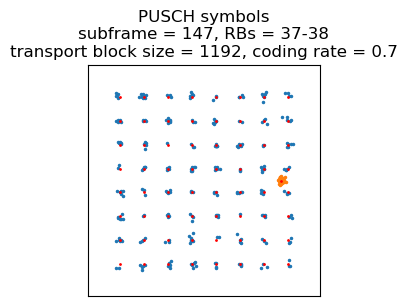

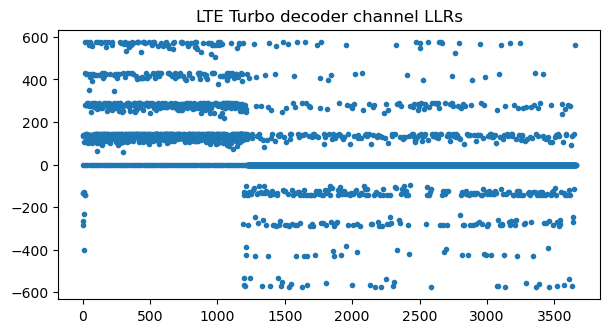

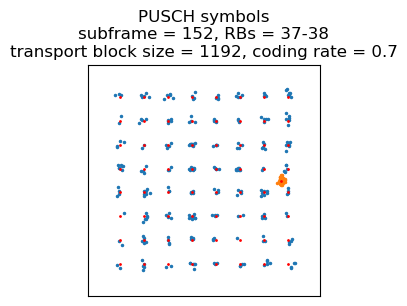

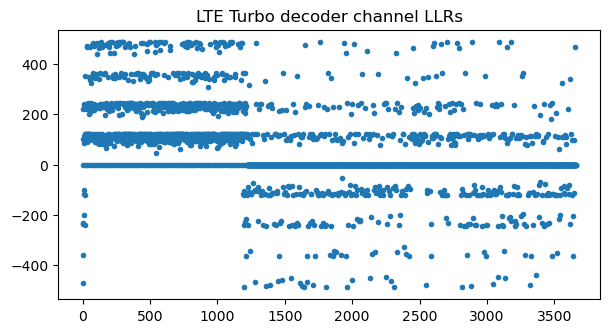

In [125]:
for subframe in [147, 152]:
    rbs = range(37, 39)
    # I_TBS = 24 -> tbs = 1192
    pusch_decode(subframe, rbs, rnti, 1192, constellation=qam64_constellation)

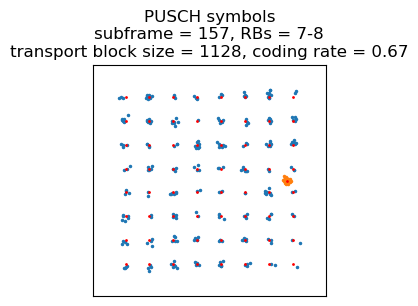

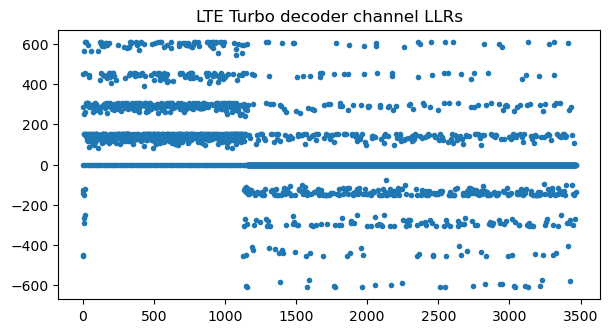

In [126]:
subframe = 157
rbs = range(7, 9)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

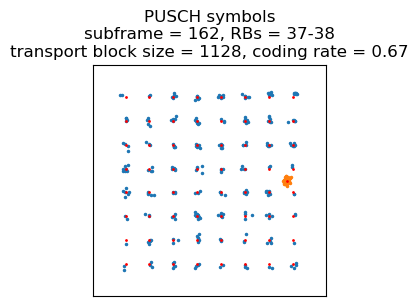

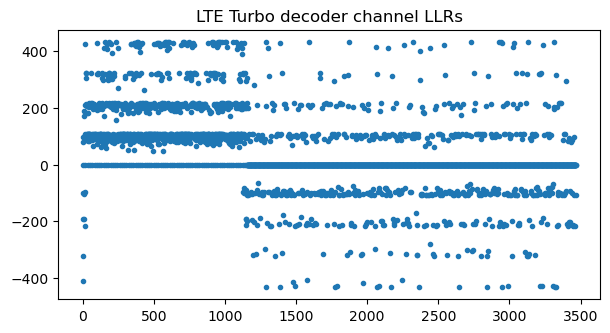

In [127]:
subframe = 162
rbs = range(37, 39)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

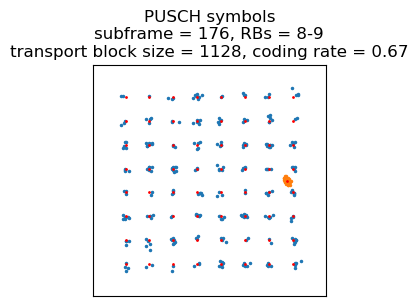

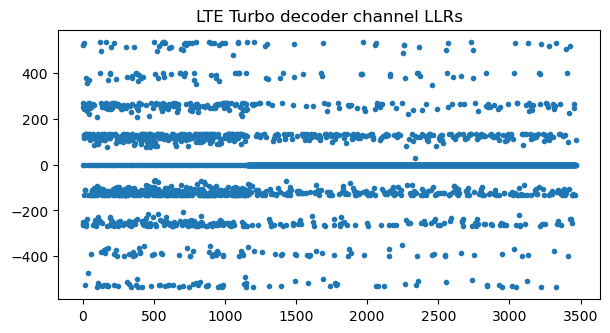

In [128]:
subframe = 176
rbs = range(8, 10)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

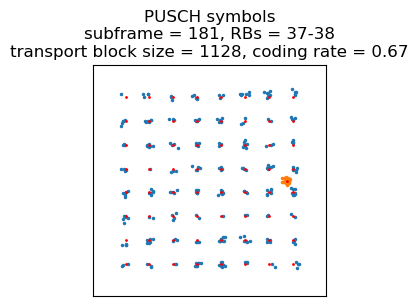

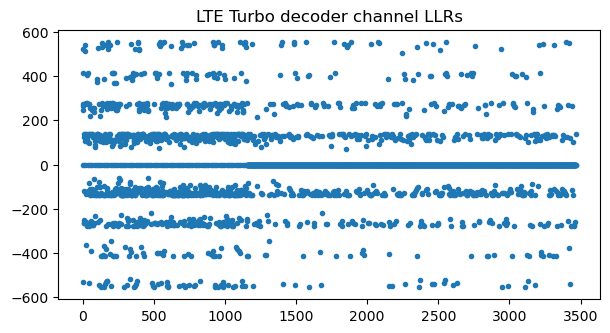

In [129]:
subframe = 181
rbs = range(37, 39)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

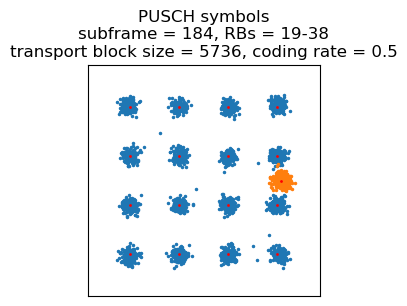

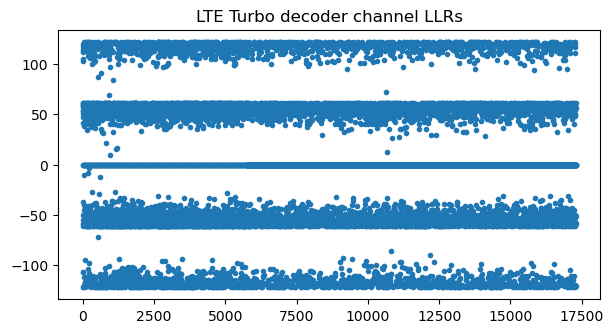

In [130]:
subframe = 184
rbs = range(19, 39)
# I_TBS = 14 -> tbs = 5736
pusch_decode(subframe, rbs, rnti, 5736, constellation=qam16_constellation)

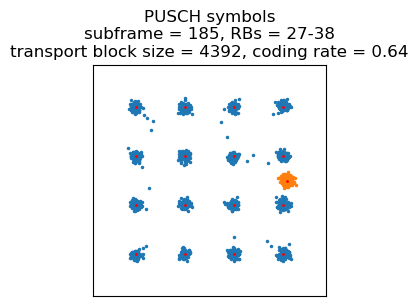

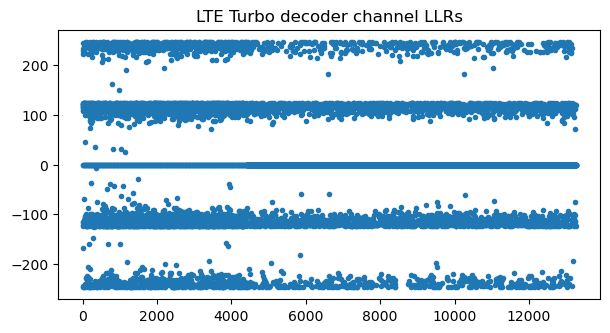

In [131]:
subframe = 185
rbs = range(27, 39)
# I_TBS = 17 -> tbs = 4392
pusch_decode(subframe, rbs, rnti, 4392, constellation=qam16_constellation)

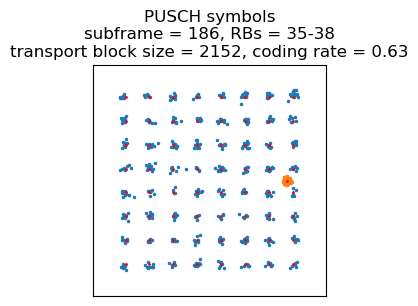

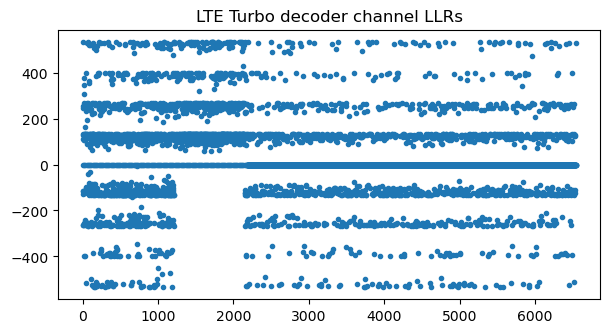

In [132]:
subframe = 186
rbs = range(35, 39)
# I_TBS = 22 -> tbs = 2152
pusch_decode(subframe, rbs, rnti, 2152, constellation=qam64_constellation)

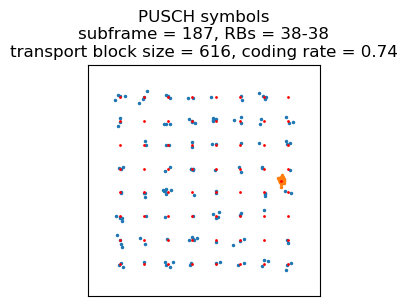

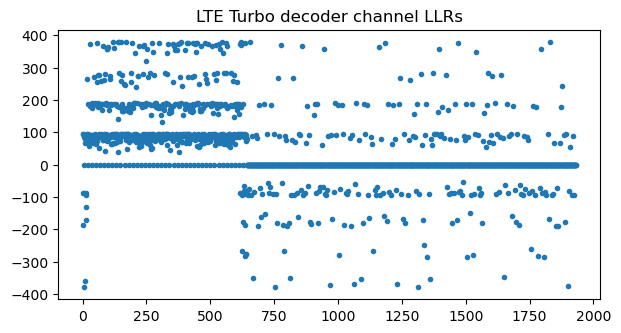

In [133]:
subframe = 187
rbs = range(38, 39)
# I_TBS = 25 -> tbs = 616
pusch_decode(subframe, rbs, rnti, 616, constellation=qam64_constellation)

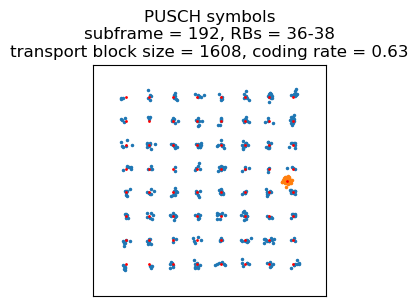

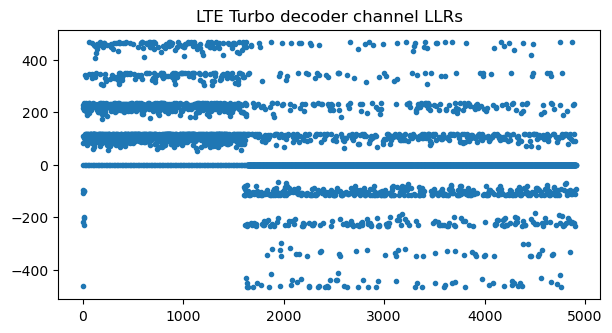

In [134]:
subframe = 192
rbs = range(36, 39)
# I_TBS = 22 -> tbs = 1608
pusch_decode(subframe, rbs, rnti, 1608, constellation=qam64_constellation)

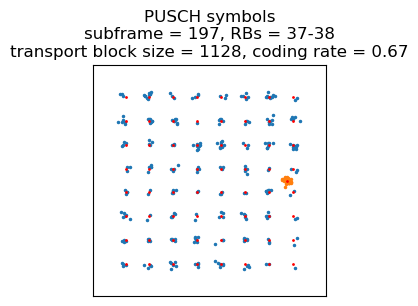

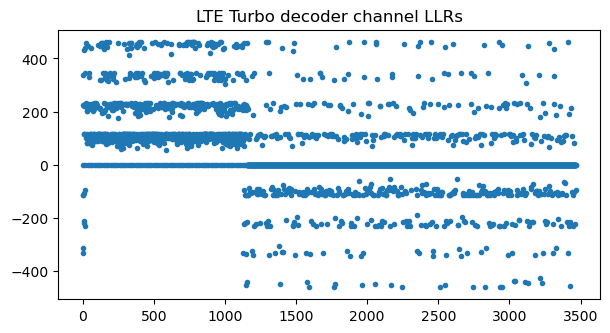

In [135]:
subframe = 197
rbs = range(37, 39)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

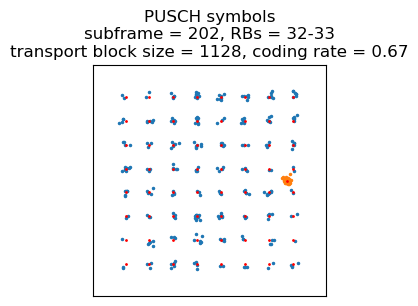

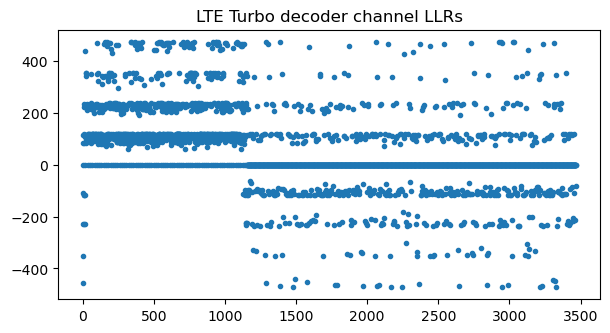

In [136]:
subframe = 202
rbs = range(32, 34)
# I_TBS = 23 -> tbs = 1128
pusch_decode(subframe, rbs, rnti, 1128, constellation=qam64_constellation)

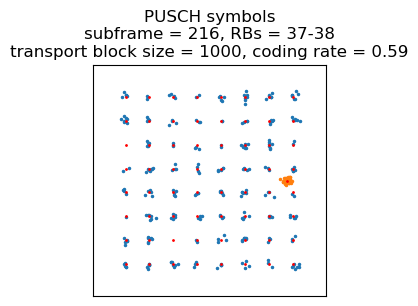

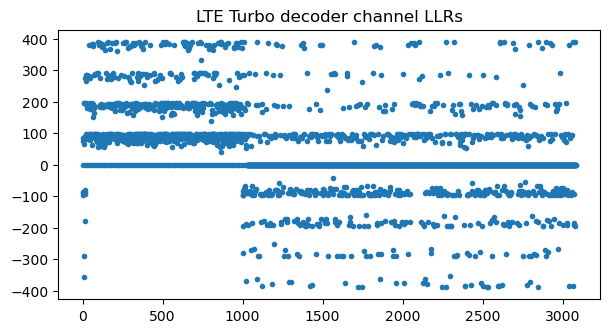

In [137]:
subframe = 216
rbs = range(37, 39)
# I_TBS = 21 -> tbs = 1000
pusch_decode(subframe, rbs, rnti, 1000, constellation=qam64_constellation)

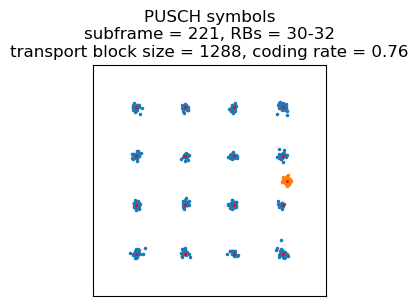

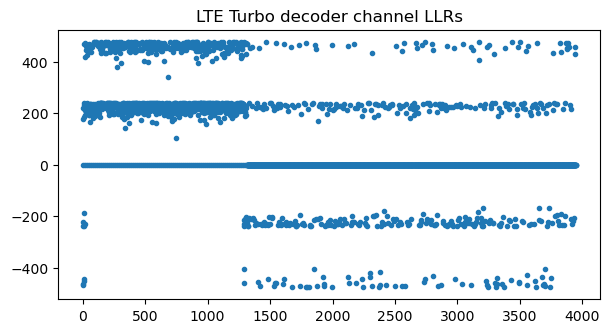

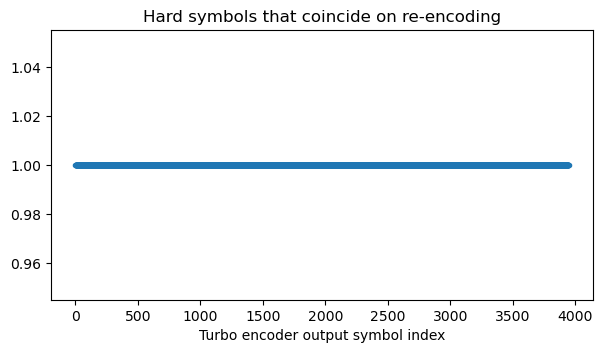

In [138]:
subframe = 221
rbs = range(30, 33)
# I_TBS = 19 -> tbs = 1288
pusch_decode(subframe, rbs, rnti, 1288, constellation=qam16_constellation, q_ack=11, plot_reencode_match=True)

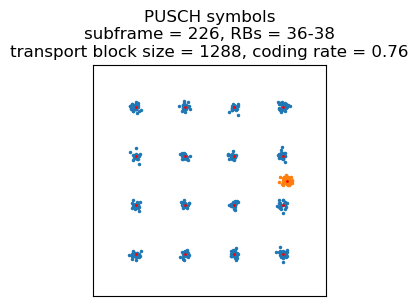

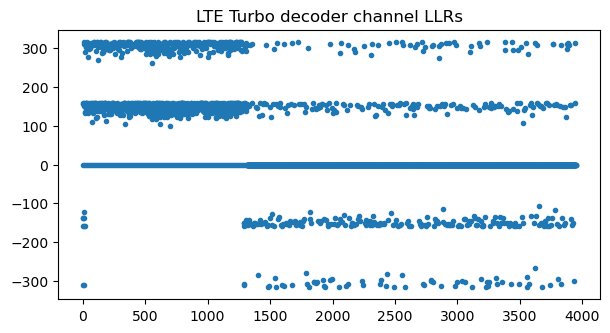

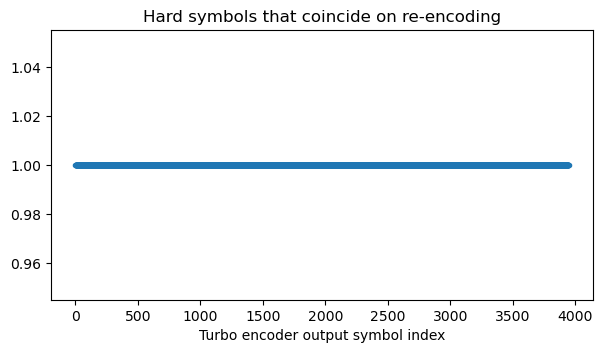

In [139]:
subframe = 226
rbs = range(36, 39)
# I_TBS = 19 -> tbs = 1288
pusch_decode(subframe, rbs, rnti, 1288, constellation=qam16_constellation, q_ack=11, plot_reencode_match=True)

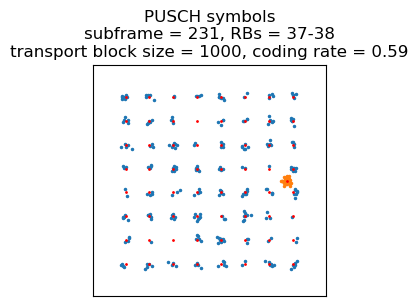

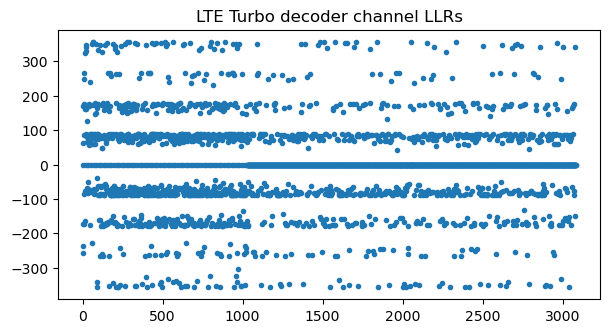

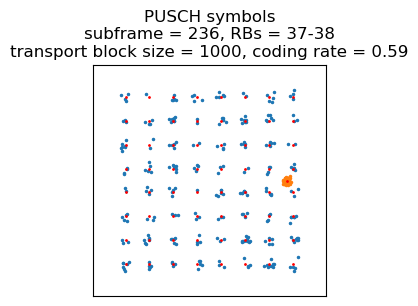

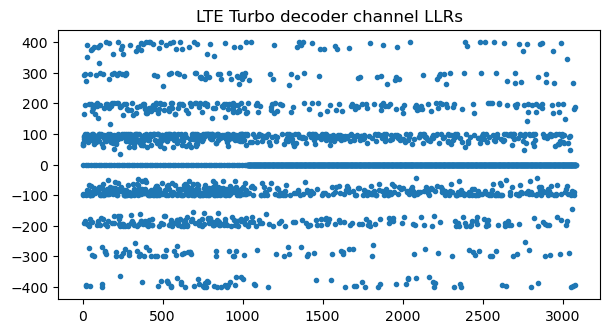

In [140]:
for subframe in [231, 236]:
    rbs = range(37, 39)
    # I_TBS = 21 -> tbs = 1000
    pusch_decode(subframe, rbs, rnti, 1000, constellation=qam64_constellation)

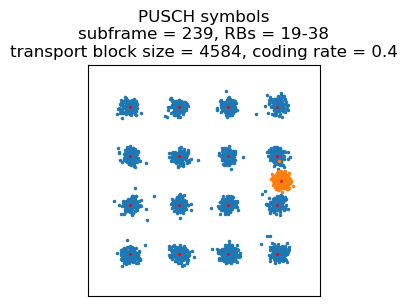

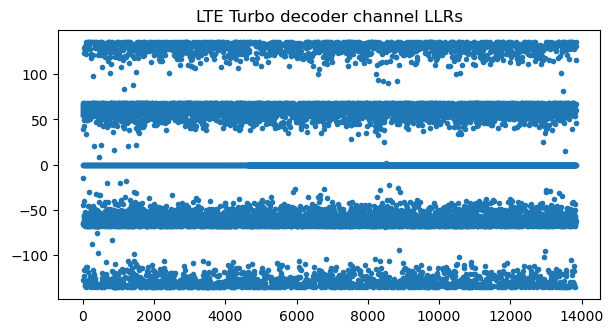

In [141]:
subframe = 239
rbs = range(19, 39)
# I_TBS = 12 -> tbs = 4584
pusch_decode(subframe, rbs, rnti, 4584, constellation=qam16_constellation)

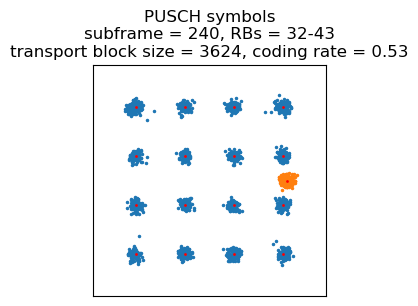

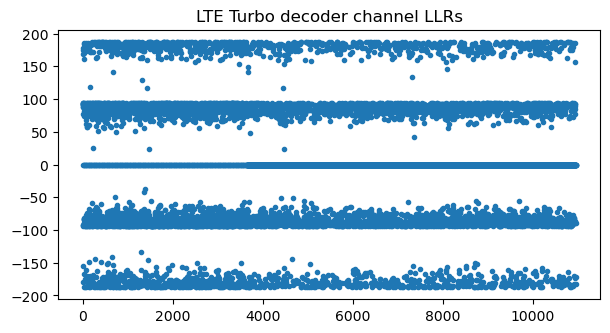

In [142]:
subframe = 240
rbs = range(32, 44)
# I_TBS = 15 -> tbs = 3624
pusch_decode(subframe, rbs, rnti, 3624, constellation=qam16_constellation)

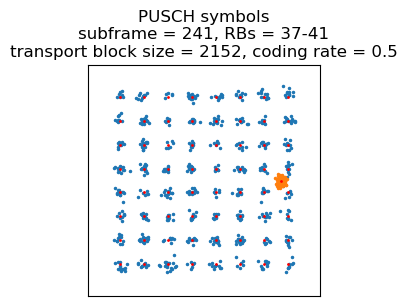

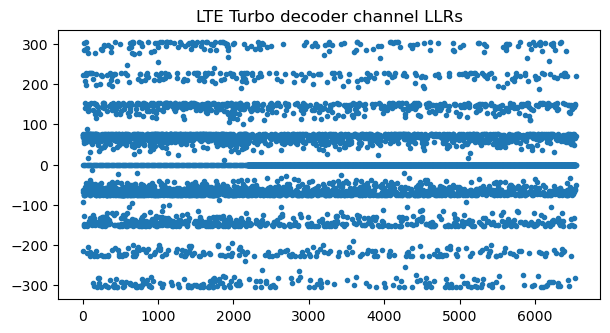

In [143]:
subframe = 241
rbs = range(37, 42)
# I_TBS = 19 -> tbs = 2152
pusch_decode(subframe, rbs, rnti, 2152, constellation=qam64_constellation)

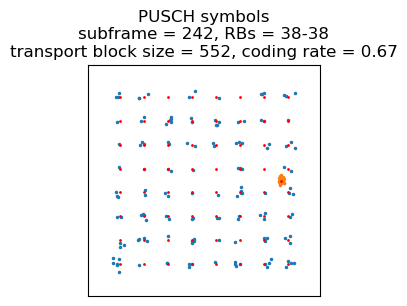

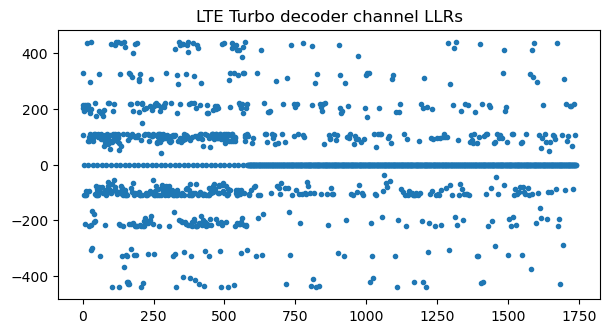

In [144]:
subframe = 242
rbs = range(38, 39)
# I_TBS = 23 -> tbs = 552
pusch_decode(subframe, rbs, rnti, 552, constellation=qam64_constellation)

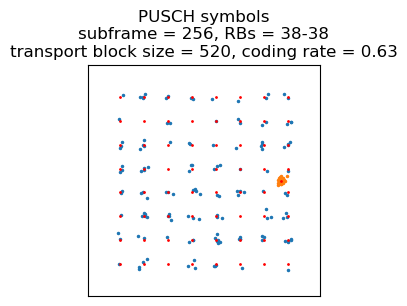

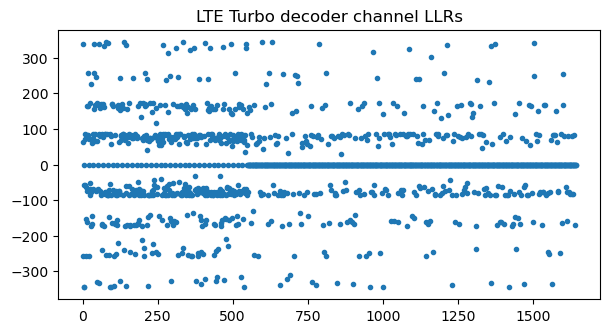

In [145]:
subframe = 256
rbs = range(38, 39)
# I_TBS = 22 -> tbs = 520
pusch_decode(subframe, rbs, rnti, 520, constellation=qam64_constellation)

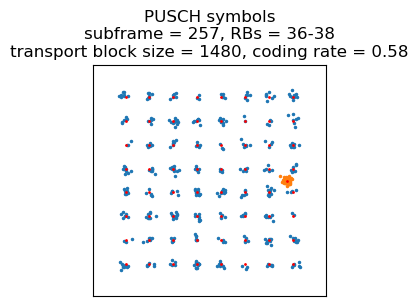

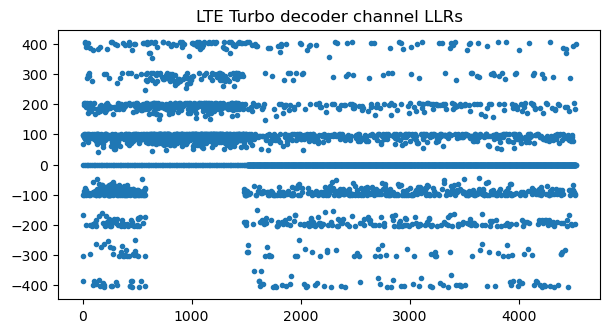

In [146]:
subframe = 257
rbs = range(36, 39)
# I_TBS = 21 -> tbs = 1480
pusch_decode(subframe, rbs, rnti, 1480, constellation=qam64_constellation)

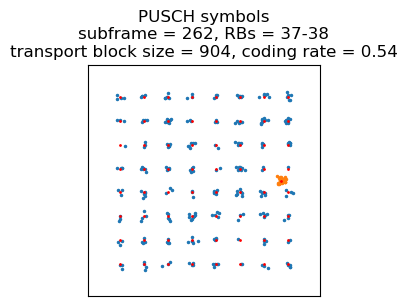

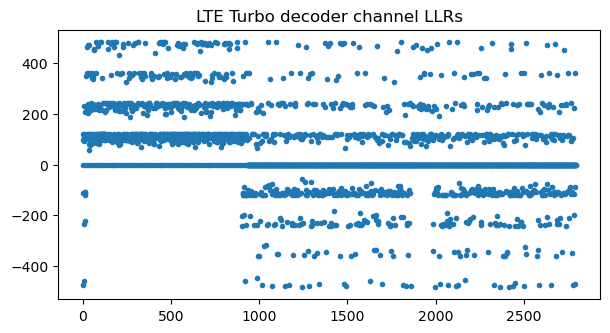

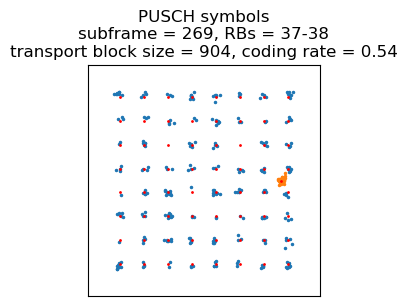

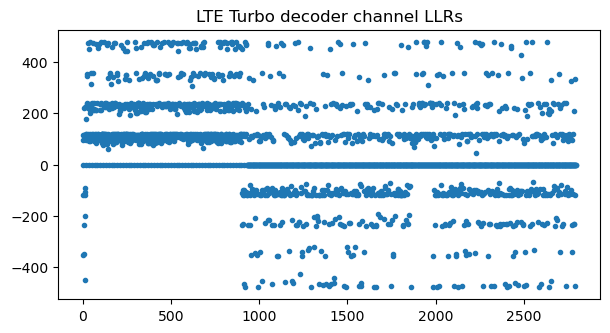

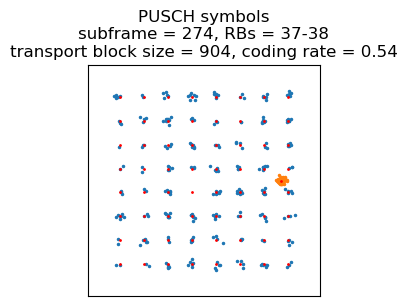

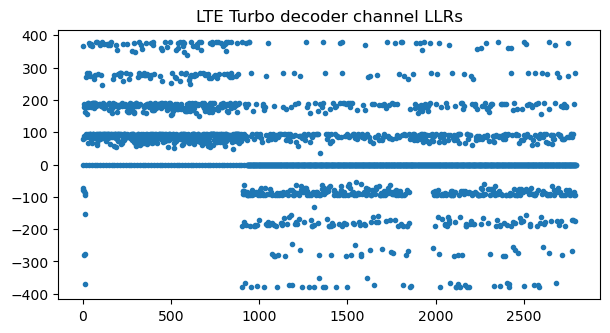

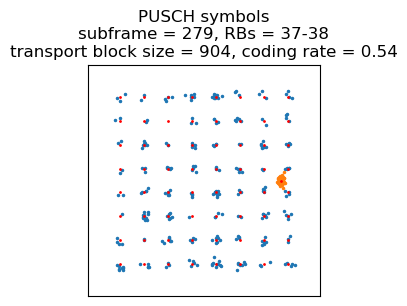

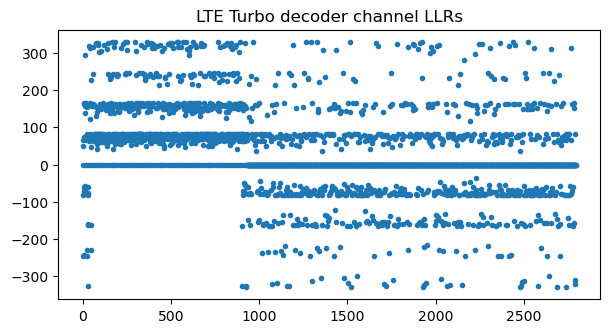

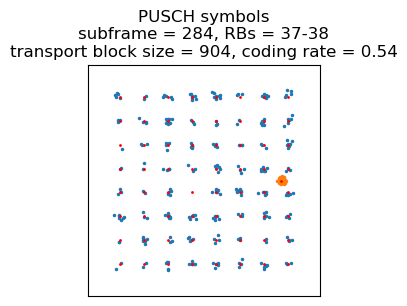

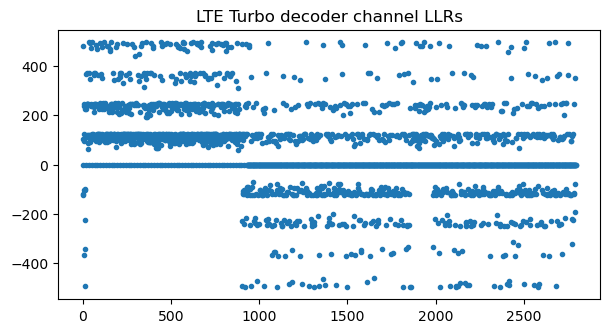

In [147]:
for subframe in [262, 269, 274, 279, 284]:
    rbs = range(37, 39)
    # I_TBS = 20 -> tbs = 904
    pusch_decode(subframe, rbs, rnti, 904, constellation=qam64_constellation)

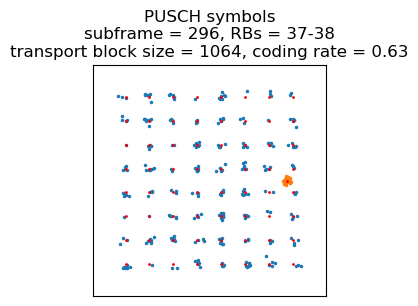

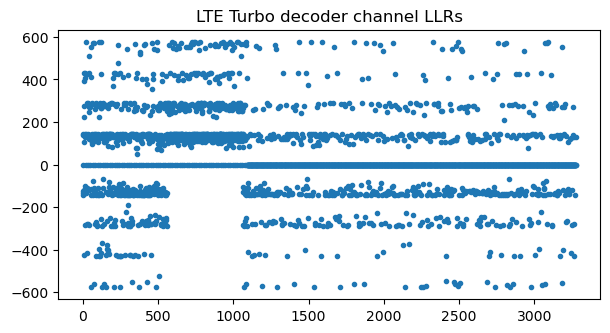

In [148]:
subframe = 296
rbs = range(37, 39)
# I_TBS = 22 -> tbs = 1064
pusch_decode(subframe, rbs, rnti, 1064, constellation=qam64_constellation)

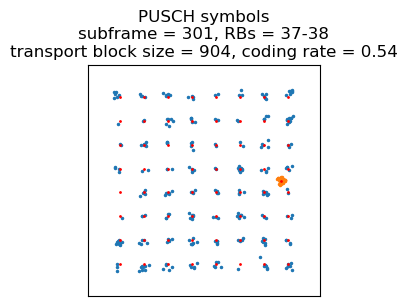

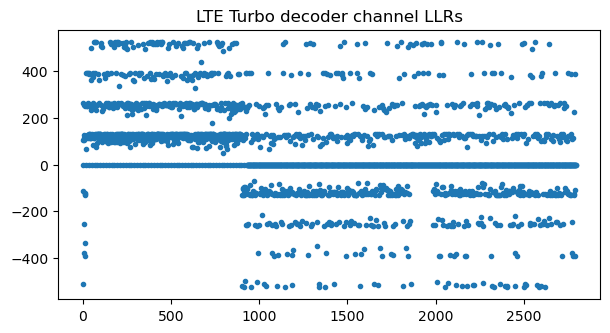

In [149]:
subframe = 301
rbs = range(37, 39)
# I_TBS = 20 -> tbs = 904
pusch_decode(subframe, rbs, rnti, 904, constellation=qam64_constellation)

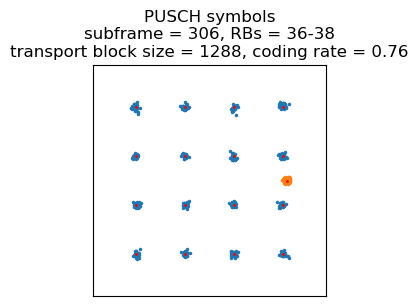

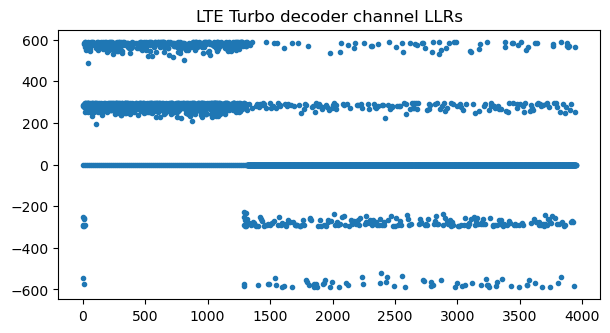

In [150]:
subframe = 306
rbs = range(36, 39)
# I_TBS = 20 -> tbs = 1288
pusch_decode(subframe, rbs, rnti, 1288, constellation=qam16_constellation, q_ack=11)

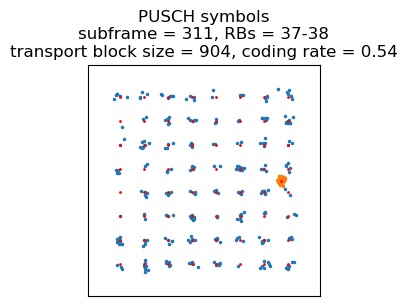

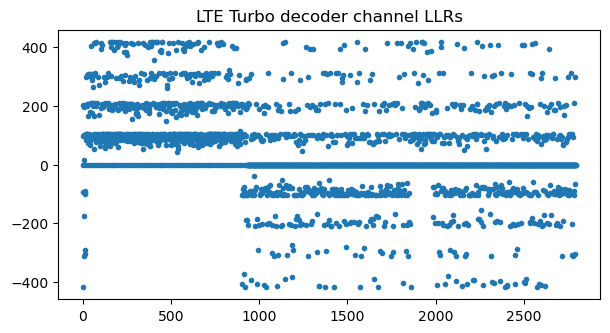

In [151]:
subframe = 311
rbs = range(37, 39)
# I_TBS = 20 -> tbs = 904
pusch_decode(subframe, rbs, rnti, 904, constellation=qam64_constellation)

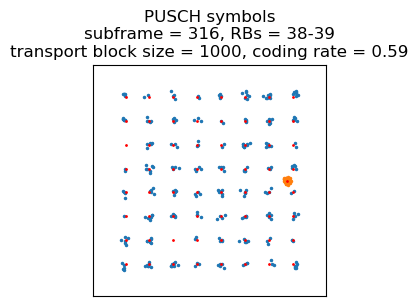

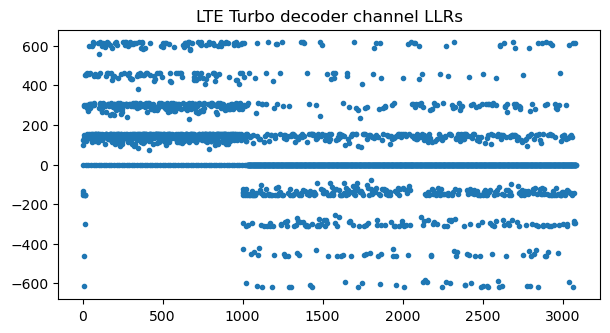

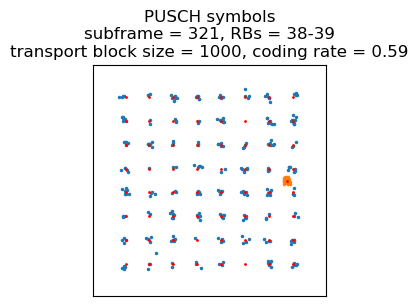

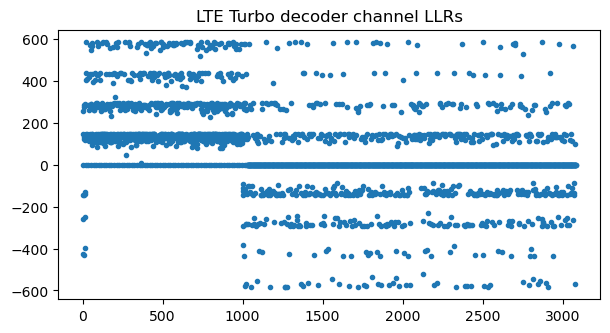

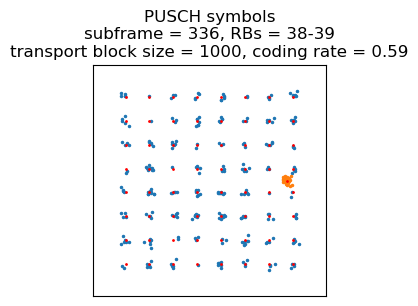

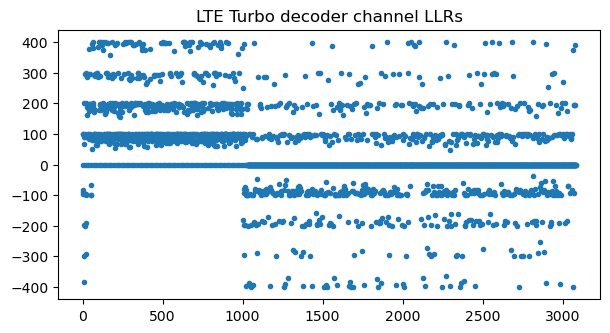

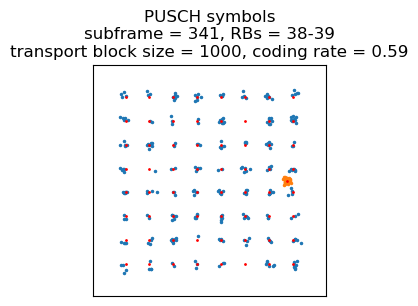

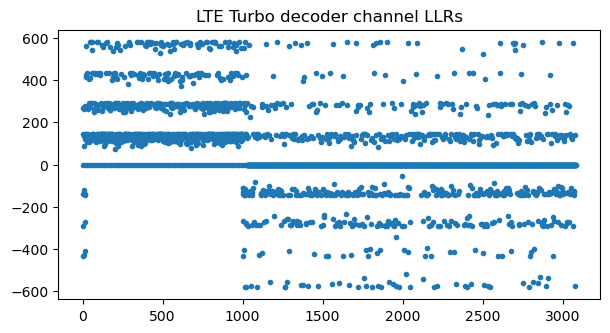

In [152]:
for subframe in [316, 321, 336, 341]:
    rbs = range(38, 40)
    # I_TBS = 21 -> tbs = 1000
    pusch_decode(subframe, rbs, rnti, 1000, constellation=qam64_constellation)

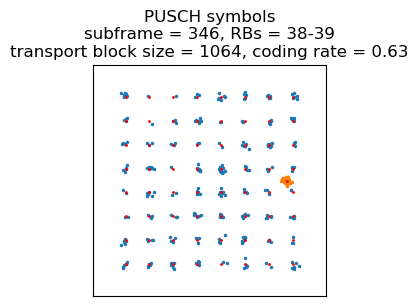

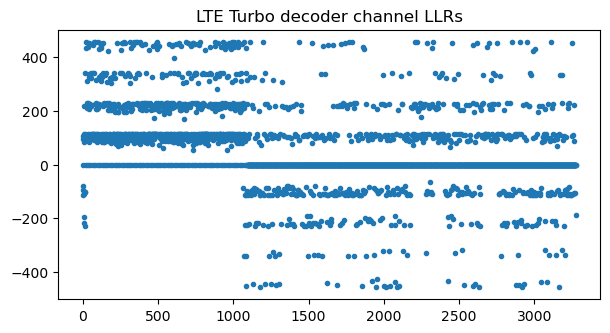

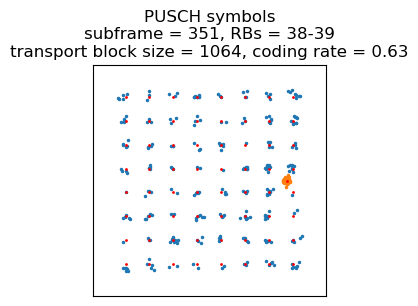

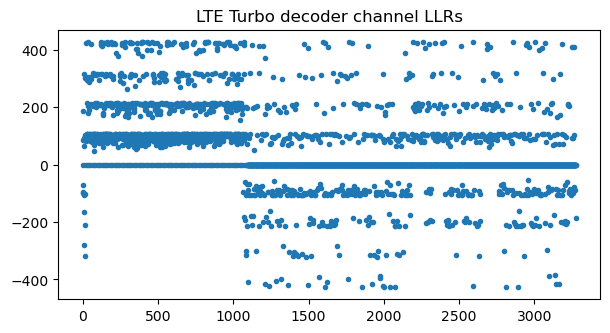

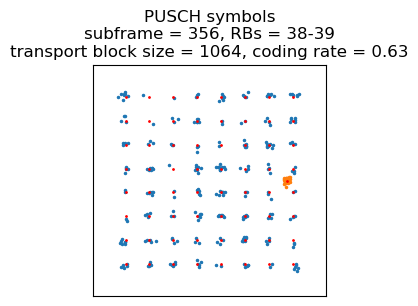

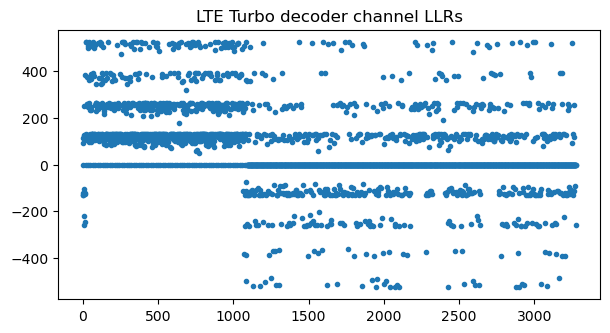

In [153]:
for subframe in [346, 351, 356]:
    rbs = range(38, 40)
    # I_TBS = 22 -> tbs = 1064
    pusch_decode(subframe, rbs, rnti, 1064, constellation=qam64_constellation)

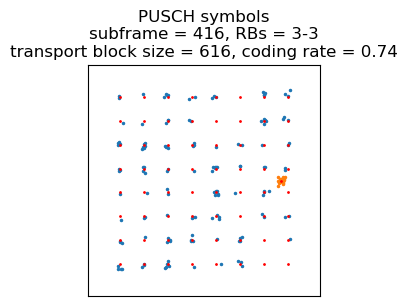

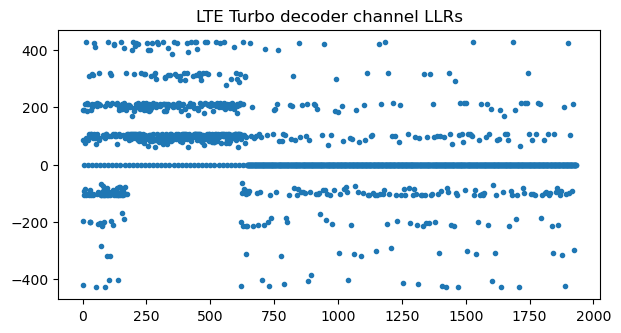

In [154]:
subframe = 416
rbs = range(3, 4)
# I_TBS = 25 -> tbs = 616
pusch_decode(subframe, rbs, rnti, 616, constellation=qam64_constellation)

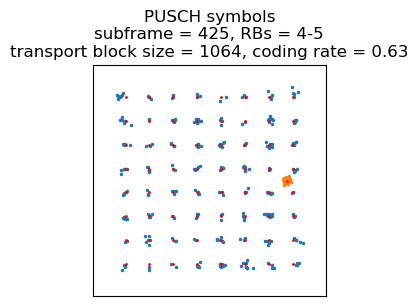

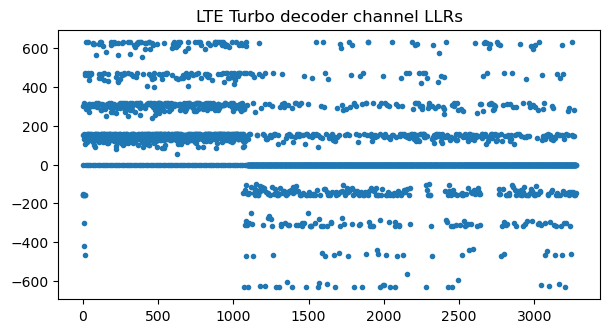

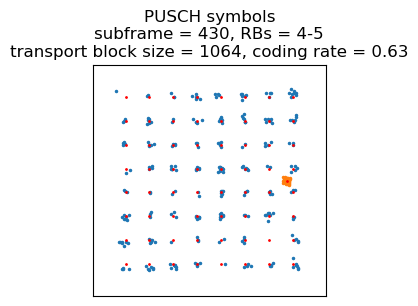

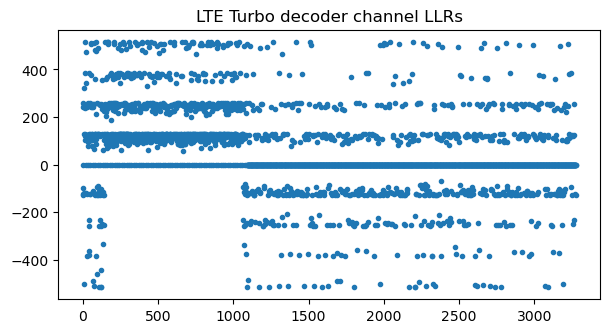

In [155]:
for subframe in [425, 430]:
    rbs = range(4, 6)
    # I_TBS = 22 -> tbs = 1064
    pusch_decode(subframe, rbs, rnti, 1064, constellation=qam64_constellation)

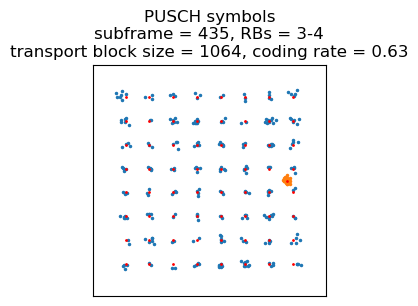

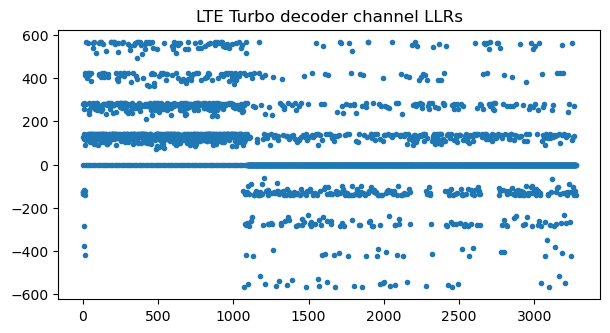

In [156]:
subframe = 435
rbs = range(3, 5)
# I_TBS = 22 -> tbs = 1064
pusch_decode(subframe, rbs, rnti, 1064, constellation=qam64_constellation)

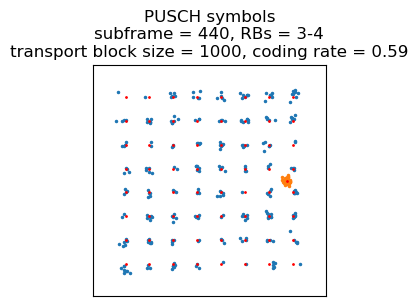

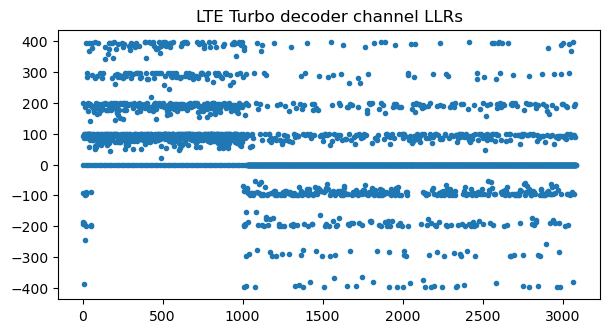

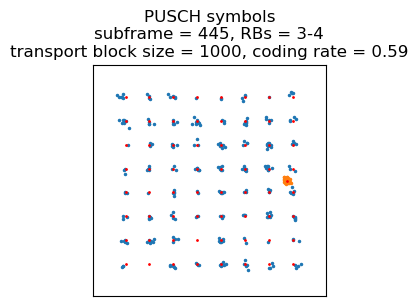

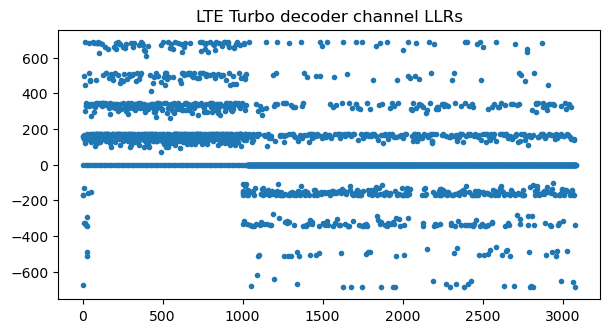

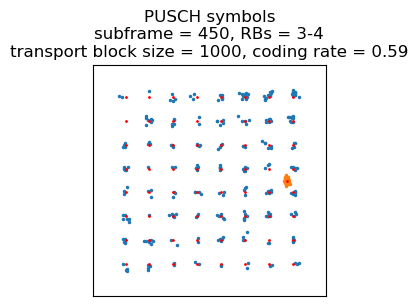

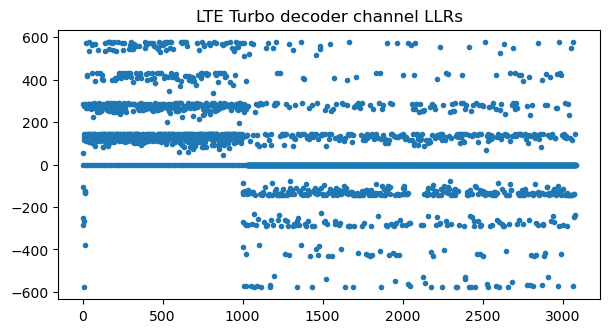

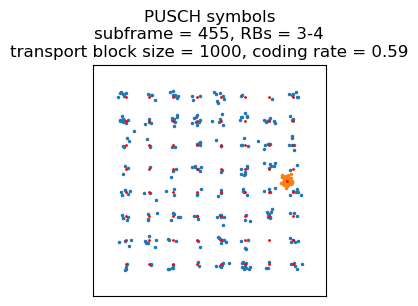

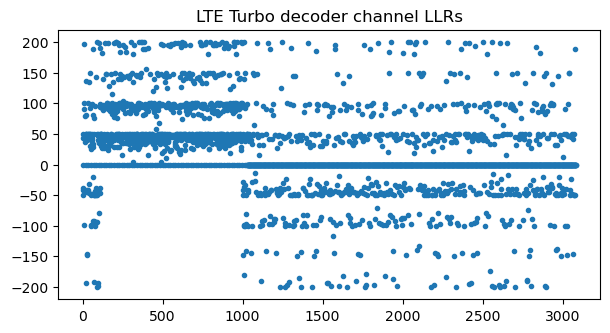

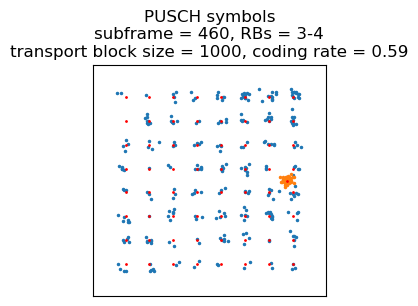

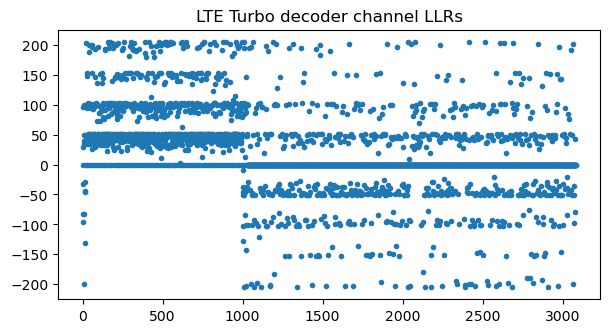

In [157]:
for subframe in [440, 445, 450, 455, 460]:
    rbs = range(3, 5)
    # I_TBS = 21 -> tbs = 1000
    pusch_decode(subframe, rbs, rnti, 1000, constellation=qam64_constellation)

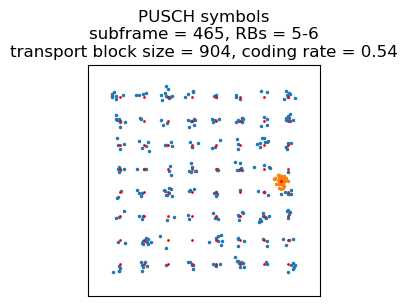

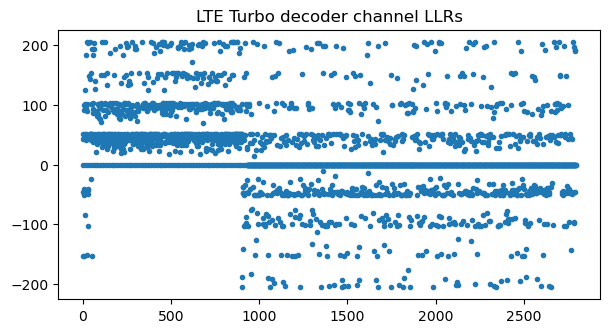

In [158]:
subframe = 465
rbs = range(5, 7)
# I_TBS = 20 -> tbs = 904
pusch_decode(subframe, rbs, rnti, 904, constellation=qam64_constellation)

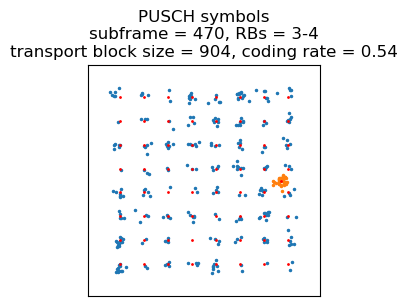

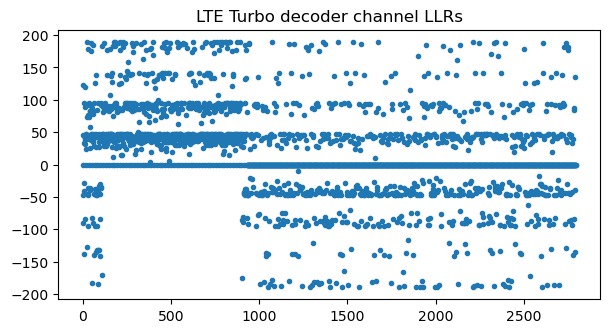

In [159]:
subframe = 470
rbs = range(3, 5)
# I_TBS = 20 -> tbs = 904
pusch_decode(subframe, rbs, rnti, 904, constellation=qam64_constellation)

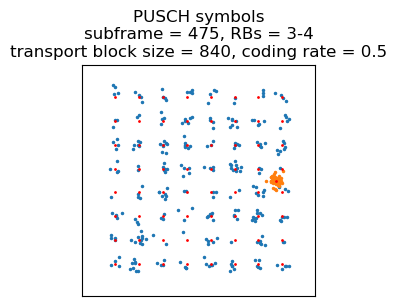

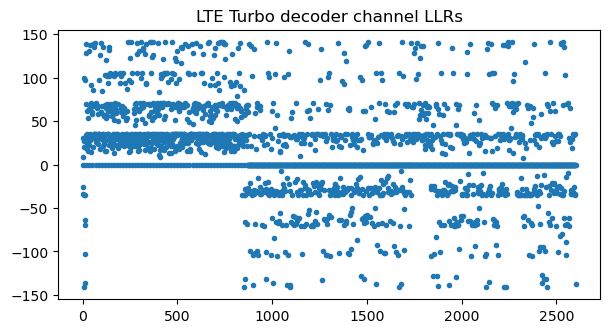

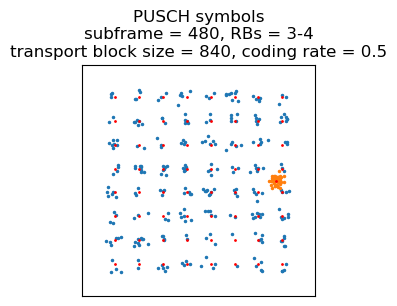

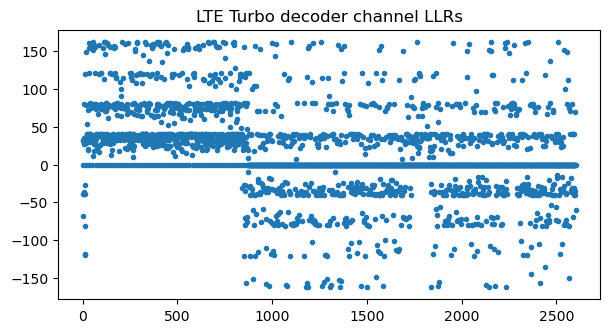

In [160]:
for subframe in [475, 480]:
    rbs = range(3, 5)
    # I_TBS = 19 -> tbs = 840
    pusch_decode(subframe, rbs, rnti, 840, constellation=qam64_constellation)

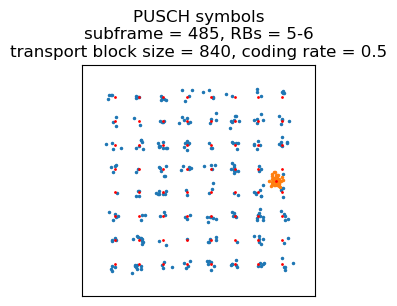

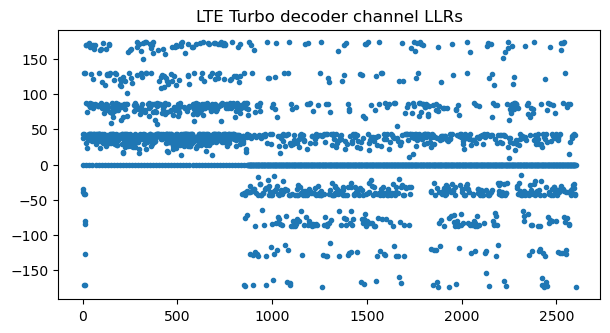

In [161]:
subframe = 485
rbs = range(5, 7)
# I_TBS = 19 -> tbs = 840
pusch_decode(subframe, rbs, rnti, 840, constellation=qam64_constellation)

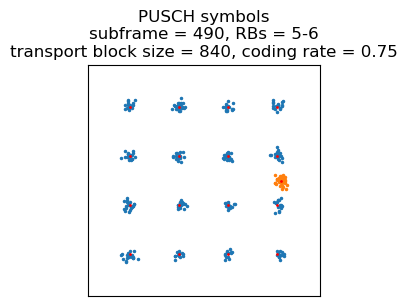

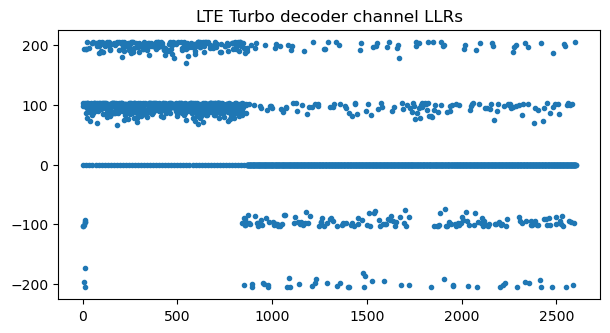

In [162]:
subframe = 490
rbs = range(5, 7)
# I_TBS = 19 -> tbs = 840
pusch_decode(subframe, rbs, rnti, 840, constellation=qam16_constellation)

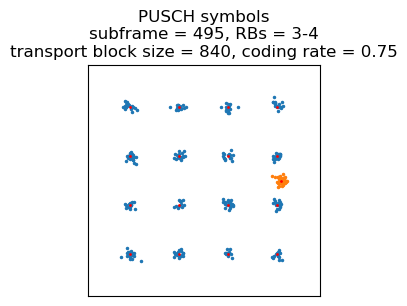

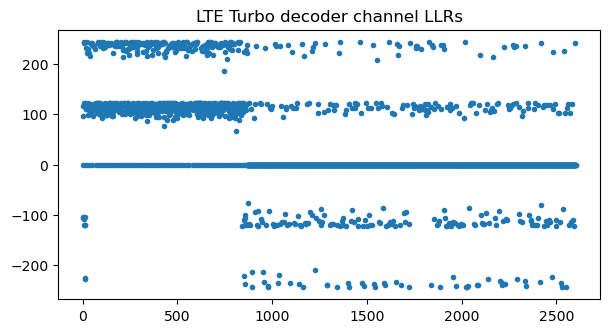

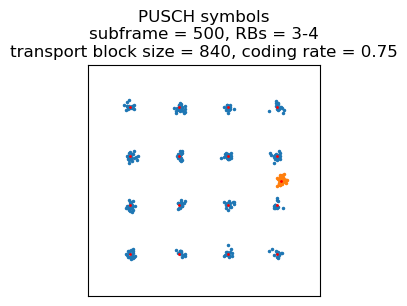

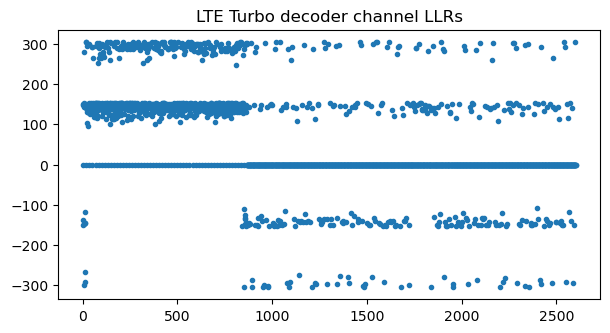

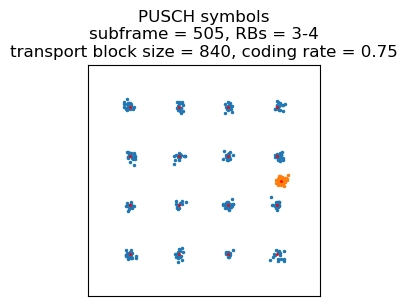

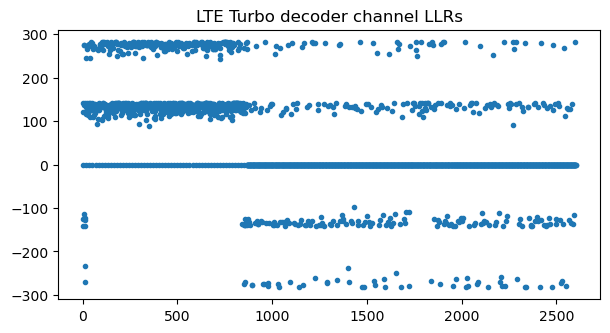

In [163]:
for subframe in [495, 500, 505]:
    rbs = range(3, 5)
    # I_TBS = 19 -> tbs = 840
    pusch_decode(subframe, rbs, rnti, 840, constellation=qam16_constellation)

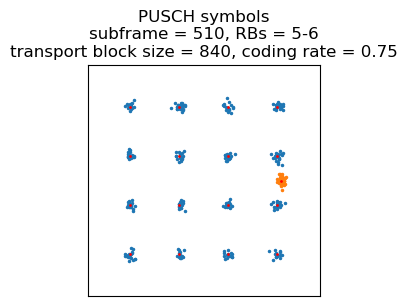

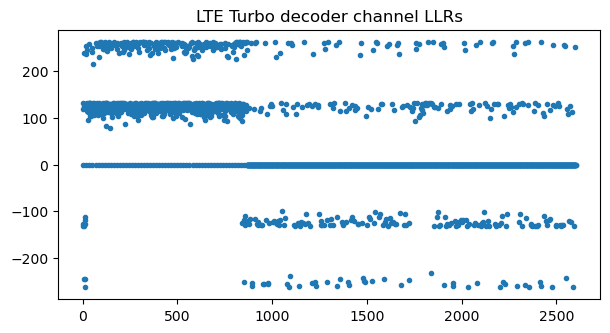

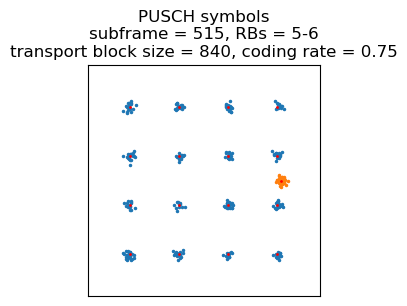

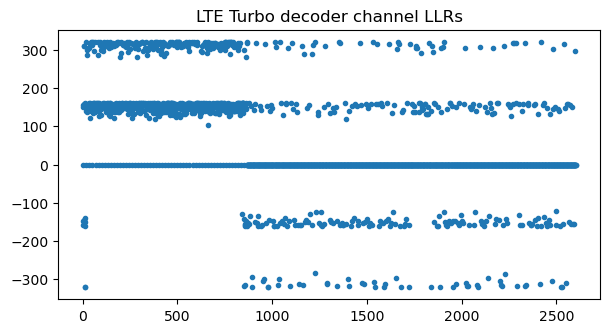

In [164]:
for subframe in [510, 515]:
    rbs = range(5, 7)
    # I_TBS = 19 -> tbs = 840
    pusch_decode(subframe, rbs, rnti, 840, constellation=qam16_constellation)

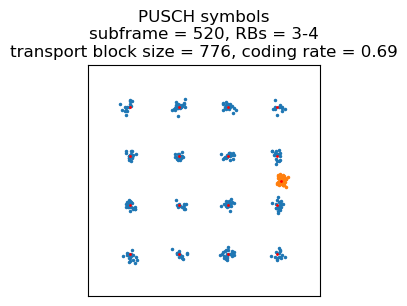

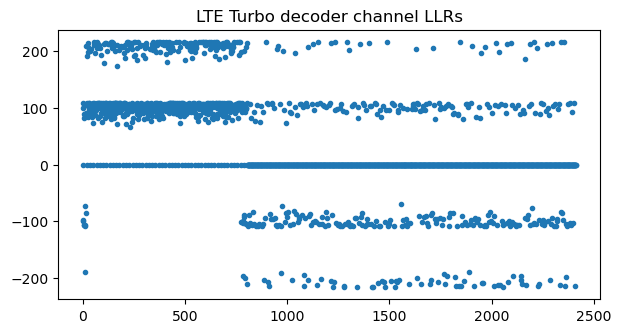

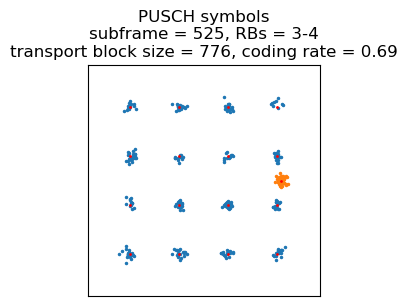

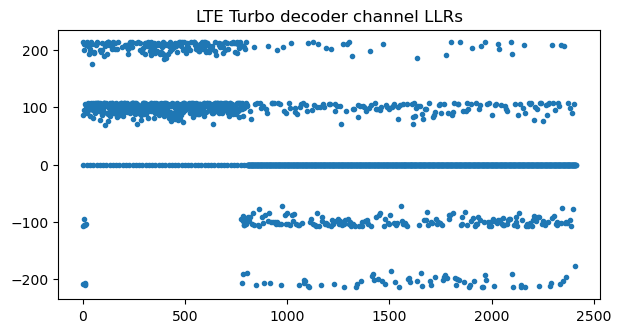

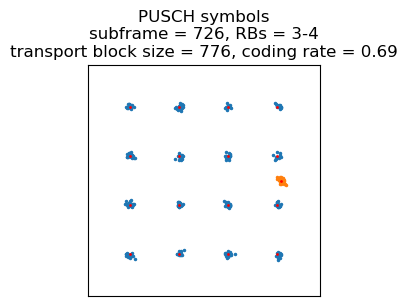

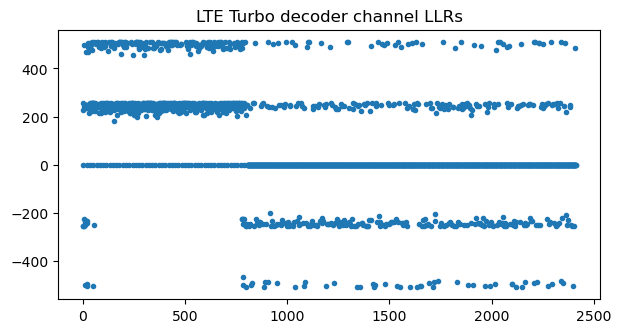

In [165]:
for subframe in [520, 525, 726]:
    rbs = range(3, 5)
    # I_TBS = 18 -> tbs = 776
    pusch_decode(subframe, rbs, rnti, 776, constellation=qam16_constellation)

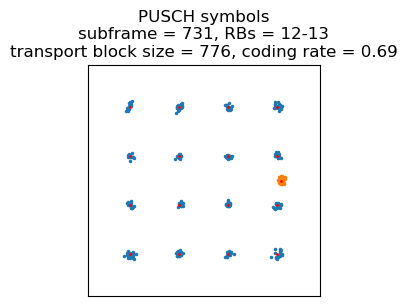

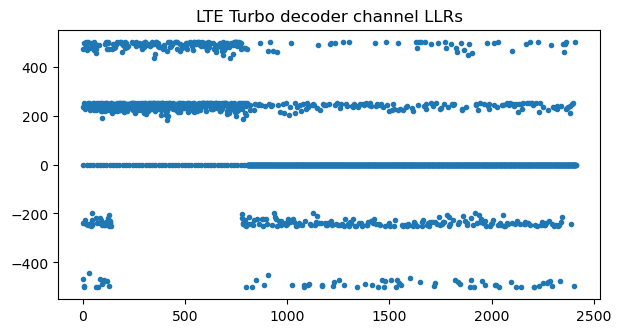

In [166]:
subframe = 731
rbs = range(12, 14)
# I_TBS = 18 -> tbs = 776
pusch_decode(subframe, rbs, rnti, 776, constellation=qam16_constellation)

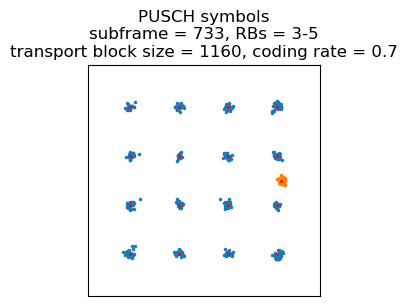

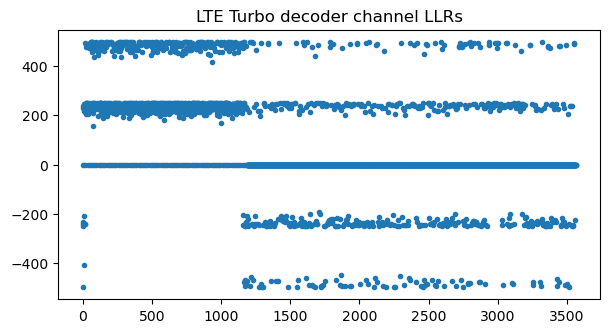

In [167]:
subframe = 733
rbs = range(3, 6)
# I_TBS = 18 -> tbs = 1160
pusch_decode(subframe, rbs, rnti, 1160, constellation=qam16_constellation, q_cqi=44)

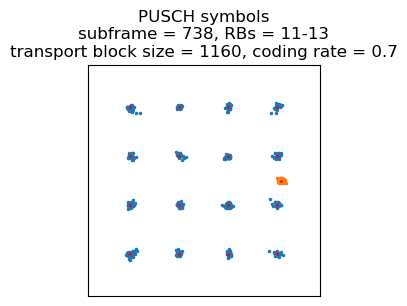

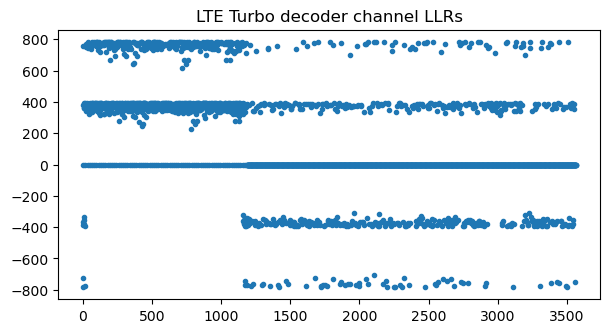

In [168]:
subframe = 738
rbs = range(11, 14)
# I_TBS = 18 -> tbs = 1160
pusch_decode(subframe, rbs, rnti, 1160, constellation=qam16_constellation, q_cqi=44)

PUSCH decoding failed


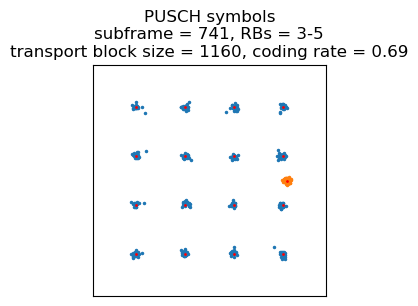

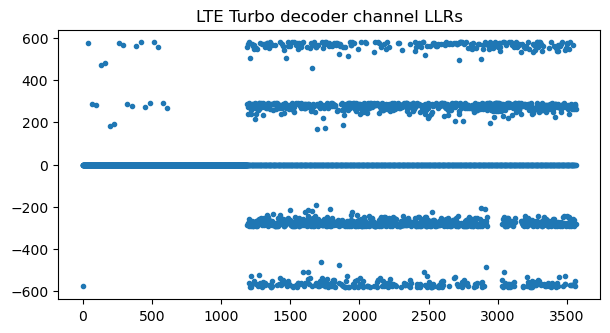

In [169]:
subframe = 741
rbs = range(3, 6)
# This is a retransmission of subframe 733, but the coding rate is high enough
# that it cannot be decoded using rv_idx=2 alone
try:
    pusch_decode(subframe, rbs, rnti, 1160, constellation=qam16_constellation, rv_idx=2)
except RuntimeError as e:
    print(e)

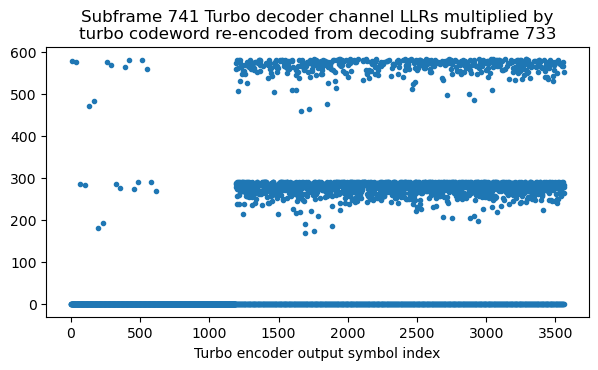

In [170]:
subframe = 733
rbs = range(3, 6)
pusch_tb_syms, pusch_tb_dmrs = pusch_demod_tb(subframe, rbs, do_plot=False, constellation=qam16_constellation)
noise_sigma = np.std(pusch_tb_dmrs)
pusch_decoded, coding_rate = pusch_fec_decode(
        pusch_tb_syms, subframe, rnti, 1160, noise_sigma,
        constellation=qam16_constellation, q_cqi=44)
encoded = 1 - 2 * np.concatenate(turbo_encode(pusch_decoded)).astype('int')

subframe = 741
rbs = range(3, 6)
pusch_tb_syms, pusch_tb_dmrs = pusch_demod_tb(subframe, rbs, do_plot=False, constellation=qam16_constellation)
noise_sigma = np.std(pusch_tb_dmrs)
pusch_llrs = llr_demod(pusch_tb_syms, noise_sigma, qam16_constellation)
pusch_descrambled = (pusch_llrs 
                     * (1 - 2 * c_seq(rnti * 2**14 + (subframe % 10) * 2**9 + N_cell_id, pusch_llrs.size).astype('float')))
bits_per_sym = 4
pusch_deinterleaved = np.einsum('ijk->jik', pusch_descrambled.reshape(12, -1, bits_per_sym))
pusch_deinterleaved = pusch_deinterleaved.ravel()
rate_matching_out = np.array([np.sum(a) for a in rate_matching_collect_turbo([(pusch_deinterleaved, 2)], turbo_len(1160)).values()])
plt.plot(rate_matching_out * encoded, '.')
plt.xlabel('Turbo encoder output symbol index')
plt.title('Subframe 741 Turbo decoder channel LLRs multiplied by\nturbo codeword re-encoded from decoding subframe 733');

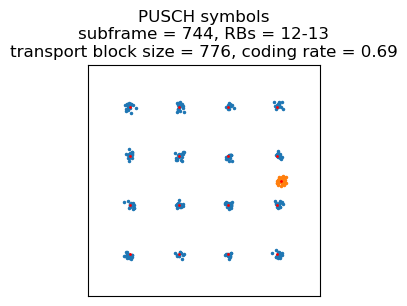

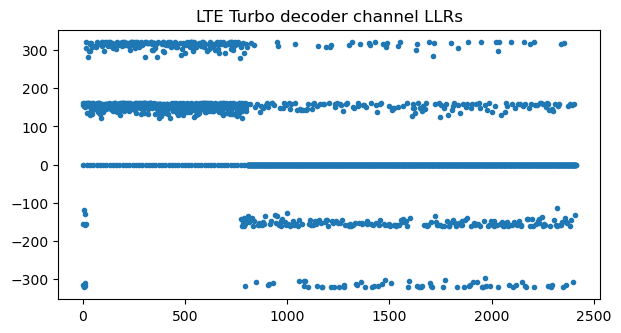

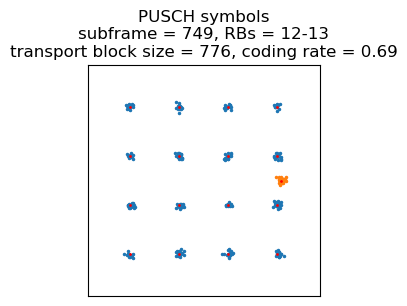

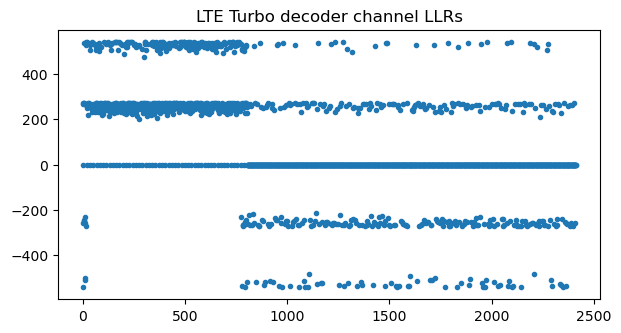

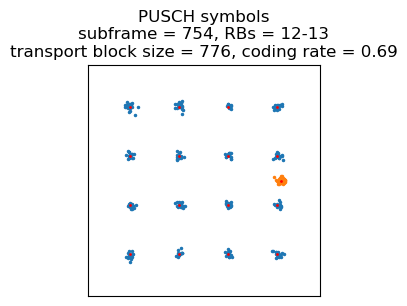

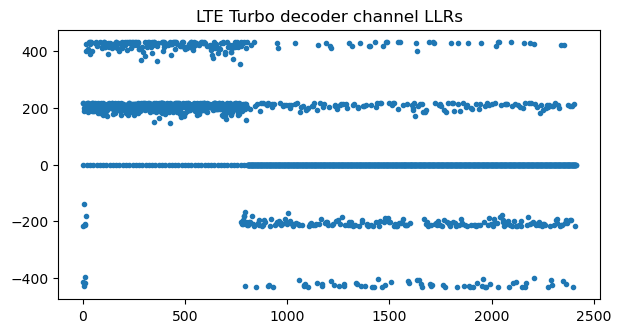

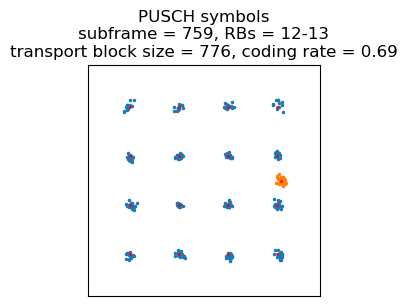

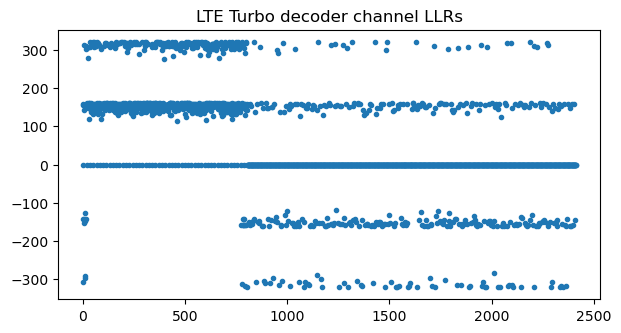

In [171]:
for subframe in [744, 749, 754, 759]:
    rbs = range(12, 14)
    # I_TBS = 18 -> tbs = 776
    pusch_decode(subframe, rbs, rnti, 776, constellation=qam16_constellation)

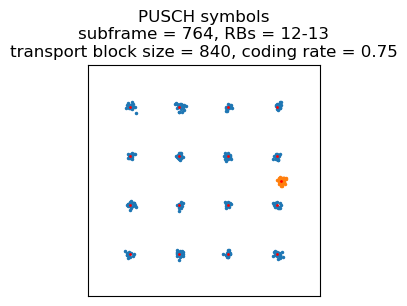

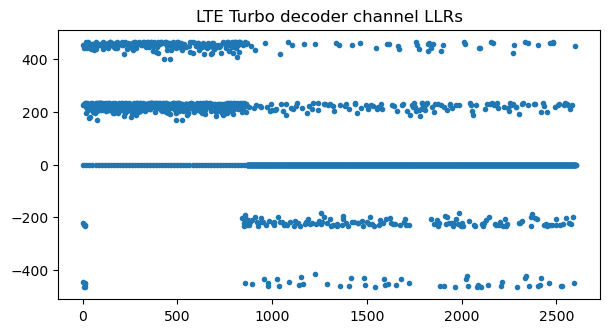

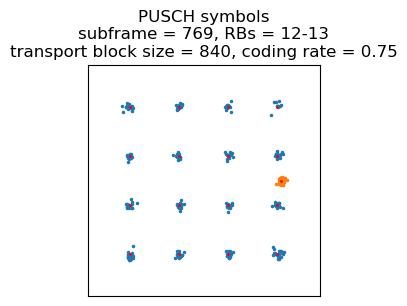

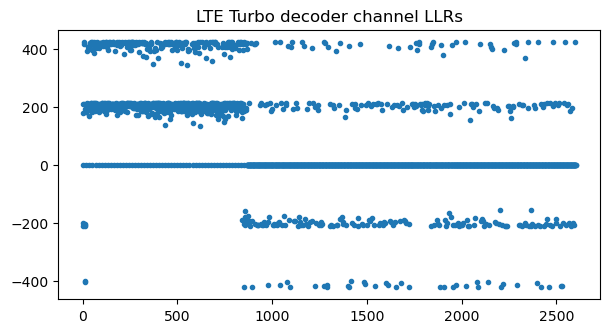

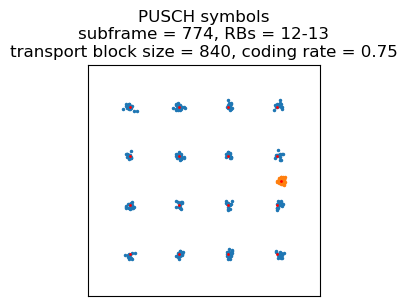

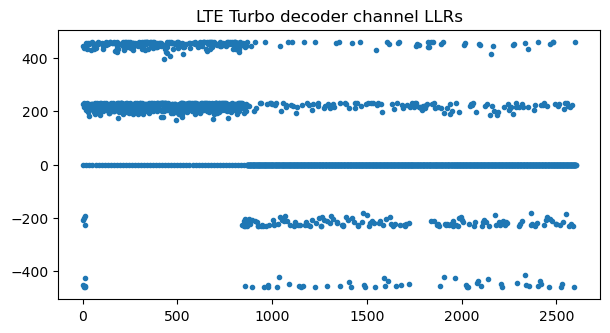

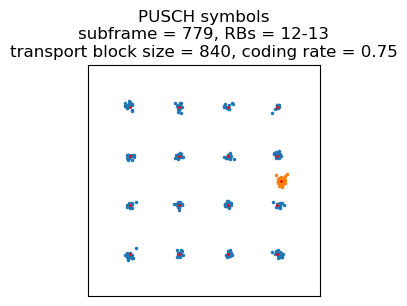

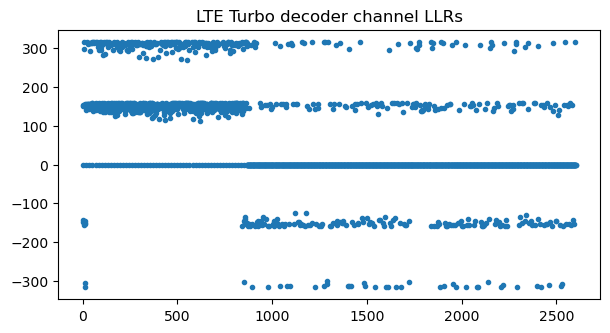

In [172]:
for subframe in [764, 769, 774, 779]:
    rbs = range(12, 14)
    # I_TBS = 19 -> tbs = 840
    pusch_decode(subframe, rbs, rnti, 840, constellation=qam16_constellation)

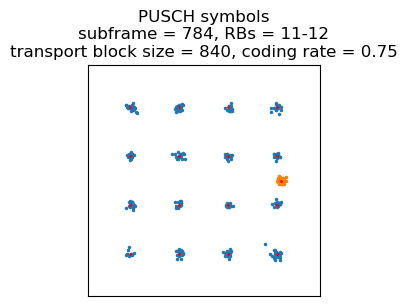

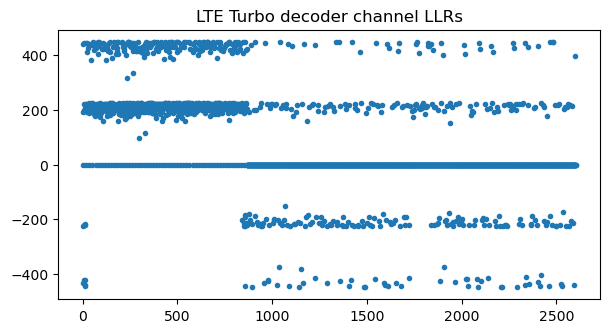

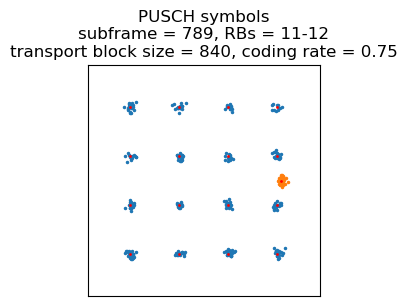

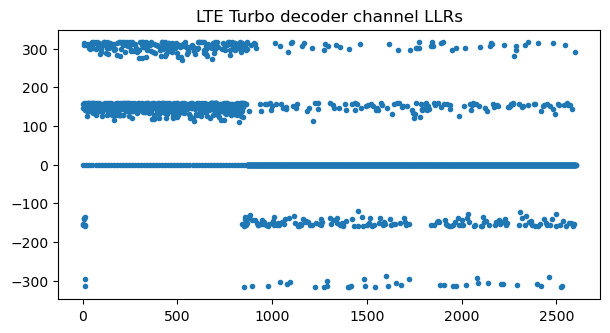

In [173]:
for subframe in [784, 789]:
    rbs = range(11, 13)
    # I_TBS = 19 -> tbs = 840
    pusch_decode(subframe, rbs, rnti, 840, constellation=qam16_constellation)

In [174]:
wireshark_udp_packets.sort(key=lambda packet: packet.time)
scapy.utils.wrpcap('lte-uplink.pcap', wireshark_udp_packets)